# 互评作业1: 数据探索性分析与数据预处理

## 数据预处理方法
1. 数据摘要

    标称属性，给出每个可能取值的频数
    数值属性，给出5数概括及缺失值的个数
2. 数据可视化

    使用直方图、盒图等检查数据分布及离群点
    
## 数据缺失值处理
观察数据集中缺失数据，分析其缺失的原因。分别使用下列四种策略对缺失值进行处理:
1. 将缺失部分剔除
2. 用最高频率值来填补缺失值
3. 通过属性的相关关系来填补缺失值
4. 通过数据对象之间的相似性来填补缺失值

注意：在处理后，要可视化地对比新旧数据集。

In [1]:
!pip3 install impyute

In [2]:
import numpy as np
import scipy as sp
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import json
import math
import re
import sys
import csv

/usr/local/lib/python3.6/dist-packages/statsmodels/tools/_testing.py:19: FutureWarning: pandas.util.testing is deprecated. Use the functions in the public API at pandas.testing instead.
  import pandas.util.testing as tm


In [3]:
import os
from google.colab import drive
drive.mount('/content/drive') # mount google drive
co_path = '/content/drive/My Drive/Colab Notebooks/dataMining'
os.chdir(co_path)
os.listdir(co_path)

Go to this URL in a browser: https://accounts.google.com/o/oauth2/auth?client_id=947318989803-6bn6qk8qdgf4n4g3pfee6491hc0brc4i.apps.googleusercontent.com&redirect_uri=urn%3aietf%3awg%3aoauth%3a2.0%3aoob&response_type=code&scope=email%20https%3a%2f%2fwww.googleapis.com%2fauth%2fdocs.test%20https%3a%2f%2fwww.googleapis.com%2fauth%2fdrive%20https%3a%2f%2fwww.googleapis.com%2fauth%2fdrive.photos.readonly%20https%3a%2f%2fwww.googleapis.com%2fauth%2fpeopleapi.readonly

Enter your authorization code:
··········
Mounted at /content/drive


['cbg_patterns.csv', 'wine-reviews']

In [0]:
"""
数据预处理

    标称属性，给出每个可能取值的频数
    数值属性，给出5数概括及缺失值的个数
"""
# 给出数据的基本信息，主要用于判断标称属性和数值属性
def columns_info(df,show_shape=True,new_df=None):
    print(df.info())
    if show_shape: print(df.shape)
    if new_df is not None:
        print();
        print(new_df.info())
        if show_shape: print(new_df.shape)  
    return None

# 标称属性每个可能取值的频数及直方图
def nominal_summary(df,nominal_index=None,head_n=50,new_df=None):
    # 根据频数绘制直方图
    def bar_describe(data,new_data=None,head_n=50):
        if new_data is None:
            plt.figure(figsize=(24,8))
            plt.title(data.name, fontsize=30)    
            plt.bar(data.index[:head_n], data.values[:head_n])
            plt.xticks(rotation=90)
            plt.show()
        else:
            plt.figure(figsize=(24,8))
            #plt.subplot(211)
            plt.title(data.name, fontsize=30)    
            plt.bar(data.index[:head_n], data.values[:head_n],color='b',label=data.name)
            #plt.xticks(rotation=90)
            
            #plt.figure(figsize=(24,8))
            #plt.subplot(212)
            #plt.title('new_'+new_data.name,fontsize=30)
            plt.bar(new_data.index[:head_n],new_data.values[:head_n],color='r',label='new_'+new_data.name)
            plt.xticks(rotation=90)
            plt.legend()
            plt.show()
            
    # 获取数据中每个取值的频数
    frequency = {key: df[key].value_counts() for key in df.columns}
    new_frequency = None
    if new_df is not None:
        new_frequency = {key: new_df[key].value_counts() for key in new_df.columns}
        
    if nominal_index is None:
        nominal_index=df.columns
    if new_frequency is None:
        for key in nominal_index:
            bar_describe(data=frequency[key],new_data=None,head_n=head_n)
    else:
        for key in nominal_index:
            bar_describe(data=frequency[key],new_data=new_frequency[key],head_n=head_n)
    return None

# 数值属性缺失值个数及五数概括
def numerical_summary(df,numerical_index=None,new_df=None):
    shape=df.shape # 样本总数
    # 格式化输出五数概括和缺失值个数
    def data_describe(data,new_data=None):
        print('descriptive statistics (%s):' % data.name)
        info=data.describe()
        new_info = None
        if new_data is not None:
            new_info = new_data.describe()
            
        print("Min: {:.4f}\tQ1(25%): {:.4f} \tQ2(50%): {:.4f} \tQ3(75%): {:.4f} \tMax: {:.4f}".format(
            info['min'],info['25%'],info['50%'],info['75%'],info['max']))
        print("Missing: {:d}".format(int(shape[0] - info['count'])))
        print()
        
        if new_info is not None:
            print("\033[95m new Min: {:.4f}\tQ1(25%): {:.4f} \tQ2(50%): {:.4f} \tQ3(75%): {:.4f} \tMax: {:.4f} \033[0m".format(
            new_info['min'],new_info['25%'],new_info['50%'],new_info['75%'],new_info['max']))
            print("\033[95m new Missing: {:d} \033[0m".format(int(shape[0] - new_info['count'])))
            print()
        
    if numerical_index is None:
        print("Please provide the numerical index needed to be describe")
        return None
    
    # 获取数值属性的5数概况和缺失值个数
    if new_df is None:
        for key in numerical_index:
            data_describe(df[key])
    else:
        for key in numerical_index:
            data_describe(df[key],new_df[key])
    
    return None

"""
数据可视化

    使用直方图、盒图等检查数据分布及离群点
"""
# 数据可视化，用于绘制数值属性的直方图，盒图及散点图
def box_plot(df,ylabel=None,new_df=None):
    if new_df is None:
        plt.figure()
        plt.title('Boxplot')
        sns.boxplot(y=ylabel,data=df,palette='Set2')
    else:
        plt.figure(figsize=(14,8))
        plt.subplot(121)
        plt.title('Boxplot')
        sns.boxplot(y=ylabel,data=df,palette='Set1')

        plt.subplot(122)
        plt.title('new_Boxplot')
        sns.boxplot(y=ylabel,data=new_df,palette='Set2')
    
def hist_plot(df,ylabel=None,bins=10,new_df=None):
    if ylabel is None:
        print("Please provide ylabel")
        return None
    if new_df is None:
        plt.figure()
        plt.title('Histogram')
        sns.distplot(a=df[ylabel].dropna(),bins=bins,hist=True,kde=False)
    else:
        plt.figure(figsize=(14,8))
        plt.subplot(121)
        plt.title('Histogram')
        sns.distplot(a=df[ylabel].dropna(),bins=bins,hist=True,kde=False)

        plt.subplot(122)
        plt.title('new_Histogram')
        sns.distplot(a=new_df[ylabel].dropna(),bins=bins,hist=True,kde=False)

def scatter_plot(df,xlabel=None,ylabel=None,new_df=None):
    if xlabel is None or ylabel is None:
        print("Please provide xlabel and ylabel")
        return None
    if new_df is None:
        plt.figure()
        plt.title('Scatter plot')
        sns.scatterplot(x=xlabel,y=ylabel,data=df)
    else:
        plt.figure(figsize=(14,8))
        plt.subplot(121)
        plt.title('Scatter plot')
        sns.scatterplot(x=xlabel,y=ylabel,data=df)

        plt.subplot(122)
        plt.title('new Scatter plot')
        sns.scatterplot(x=xlabel,y=ylabel,data=new_df)

def viz_pairs(df,ylabel=None,xlabel=None,bins=20,new_df=None):
    if ylabel is None or xlabel is None:
        print("Please provide xlabel and ylabel")
        return None
    box_plot(df,ylabel=ylabel,new_df=new_df)
    box_plot(df,ylabel=xlabel,new_df=new_df)
    hist_plot(df,ylabel=ylabel,bins=bins,new_df=new_df)
    hist_plot(df,ylabel=xlabel,bins=bins,new_df=new_df)
    scatter_plot(df,xlabel=xlabel,ylabel=ylabel,new_df=new_df)

"""
数据缺失值处理

    1. 将缺失部分剔除
    2. 用最高频率值来填补缺失值
    3. 通过属性的相关关系来填补缺失值
    4. 通过数据对象之间的相似性来填补缺失值
"""    
#将缺失部分剔除
def miss_drop(df):
    return df.dropna(axis=0,inplace=False)

#用最高频率值来填补缺失值
def miss_mode_fill(df):
    cpdf = df.copy(deep=True)
    for key in cpdf.columns:
        cpdf[key].fillna(cpdf[key].mode()[0],inplace=True)
    return cpdf

#通过属性的相关关系来填补缺失值
from sklearn.preprocessing import OrdinalEncoder
from sklearn.ensemble import RandomForestRegressor
def attr_corr_fill(df,miss_index,complete_index):
  def set_miss_values(df, complete_index):
    enc_label = OrdinalEncoder()
    enc_fea = OrdinalEncoder()
    missing_index = complete_index[0]
    
    # Take out the existing numerical data (no NaN) and throw them in Random Forest Regressor
    train_df = df[complete_index]
    # known & unknow values
    known_values = np.array(train_df[train_df[missing_index].notnull()])
    unknow_values = np.array(train_df[train_df[missing_index].isnull()])
    
    # y is the know missing_index
    y = known_values[:, 0].reshape(-1, 1)
    enc_label.fit(y)
    y = enc_label.transform(y)
    
    # X are the features
    X = known_values[:, 1:]
    test_X = unknow_values[:, 1:]
    all_X = np.row_stack((X,test_X))
    enc_fea.fit(all_X)
    X = enc_fea.transform(X)
    
    # fit
    rfr = RandomForestRegressor(random_state=0, n_estimators=2000, n_jobs=-1)
    rfr.fit(X, y.ravel())
    # predict
    predicted_values = rfr.predict(enc_fea.transform(unknow_values[:, 1:]))
    predicted_values = enc_label.inverse_transform(predicted_values.reshape(-1, 1))
    # fill in with predicted values
    df.loc[ (df[missing_index].isnull()), missing_index] = predicted_values
    return df
  
  cpdf = df.copy(deep=True)
  for i in range(0,len(miss_index)):
    complete_index.insert(0,miss_index[i])
    cpdf = set_miss_values(cpdf,complete_index)
  return cpdf


from impyute.imputation.cs import fast_knn
#通过数据对象之间的相似性来填补缺失值
def obj_corr_fill(df,numerical_index,k=30):
  sys.setrecursionlimit(100000) #Increase the recursion limit of the OS
  # start the KNN training
  cpdf = df.copy(deep=True)
  imputed_training=fast_knn(cpdf[numerical_index].values, k=k)
  imputed_training=pd.DataFrame(data=imputed_training,columns=numerical_index)
  cpdf[numerical_index] = imputed_training[numerical_index]
  return cpdf

# 数据集1 - Wine Reviews
130k wine reviews with variety, location, winery, price, and description.

> winemag-data-130k-v2.csv contains 10 columns and 130k rows of wine reviews.  
> winemag-data_first150k.csv contains 10 columns and 150k rows of wine reviews.

## winemag-data_first150k.csv

In [0]:
wine_reviews_dir = "wine-reviews"
winemag150k=pd.read_csv(wine_reviews_dir+"/winemag-data_first150k.csv",sep=',',header='infer',index_col=0)

In [6]:
columns_info(winemag150k)

<class 'pandas.core.frame.DataFrame'>
Int64Index: 150930 entries, 0 to 150929
Data columns (total 10 columns):
 #   Column       Non-Null Count   Dtype  
---  ------       --------------   -----  
 0   country      150925 non-null  object 
 1   description  150930 non-null  object 
 2   designation  105195 non-null  object 
 3   points       150930 non-null  int64  
 4   price        137235 non-null  float64
 5   province     150925 non-null  object 
 6   region_1     125870 non-null  object 
 7   region_2     60953 non-null   object 
 8   variety      150930 non-null  object 
 9   winery       150930 non-null  object 
dtypes: float64(1), int64(1), object(8)
memory usage: 12.7+ MB
None
(150930, 10)


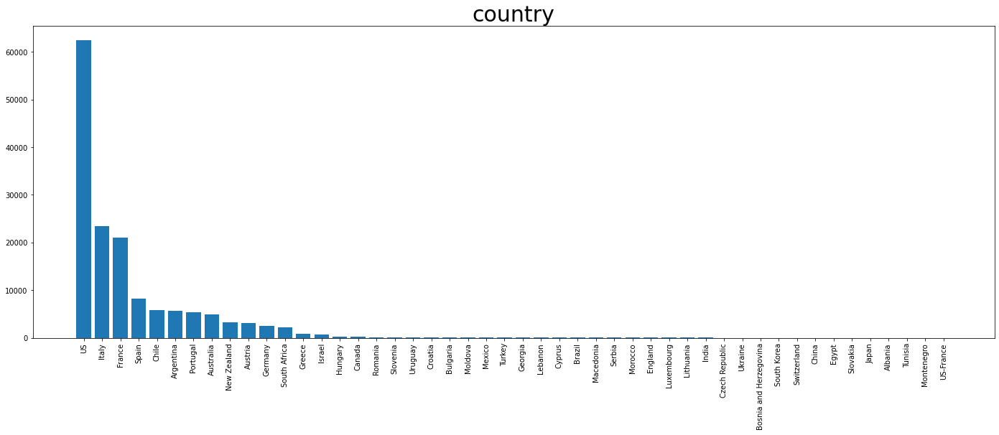

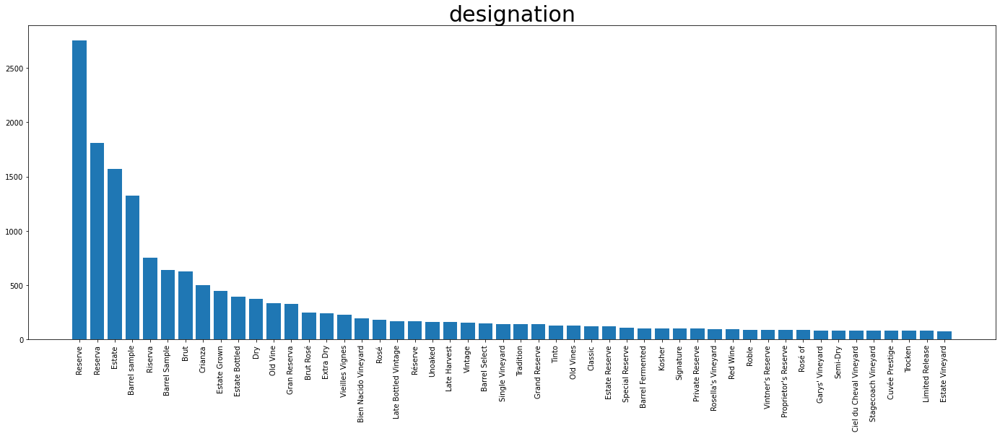

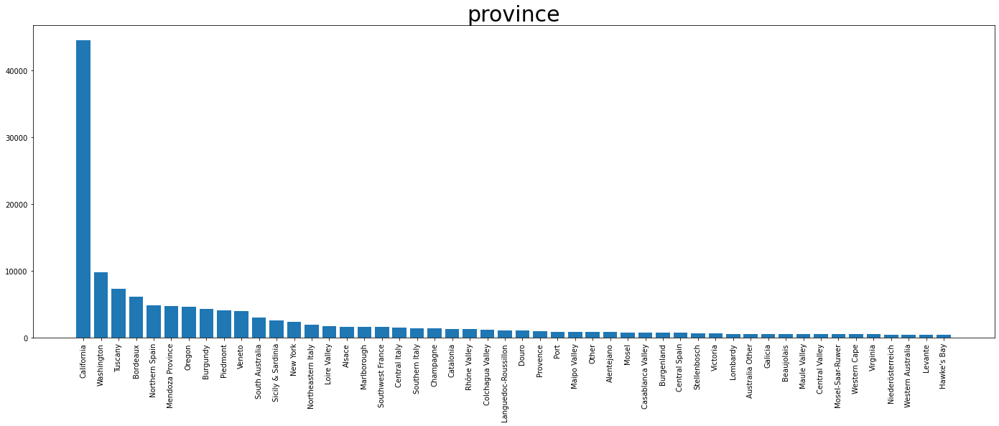

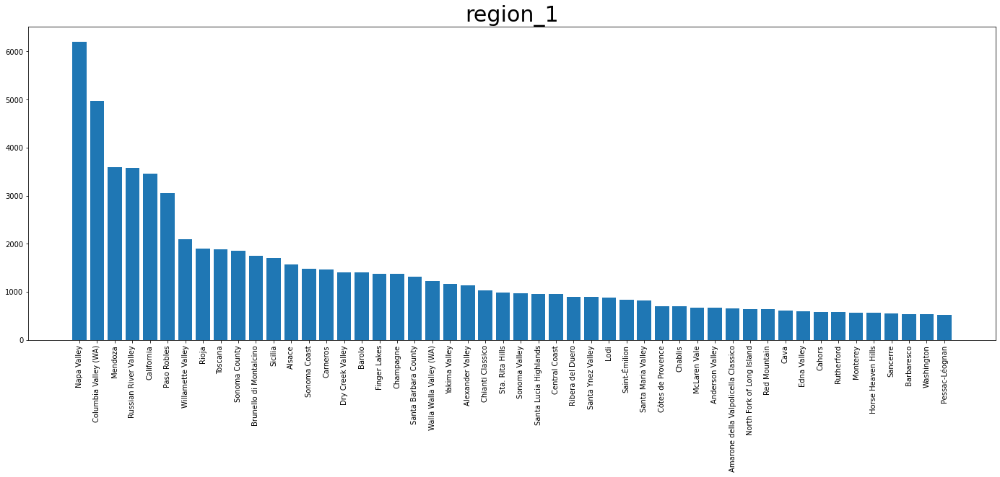

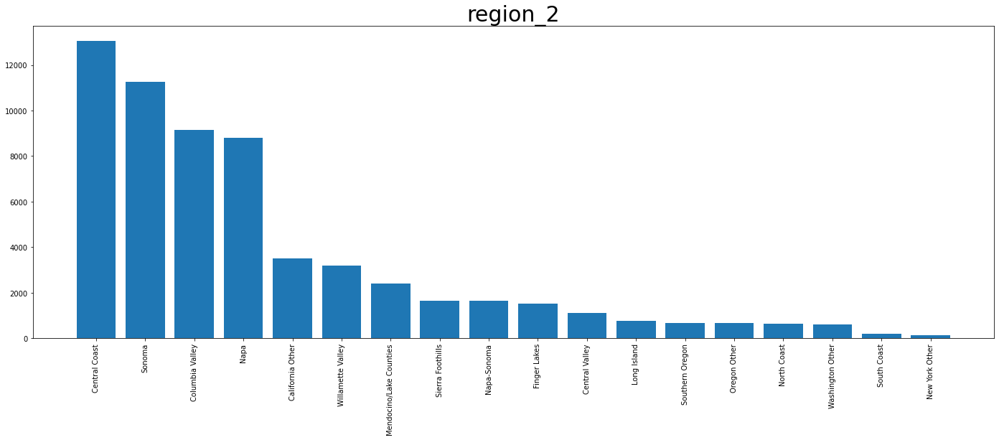

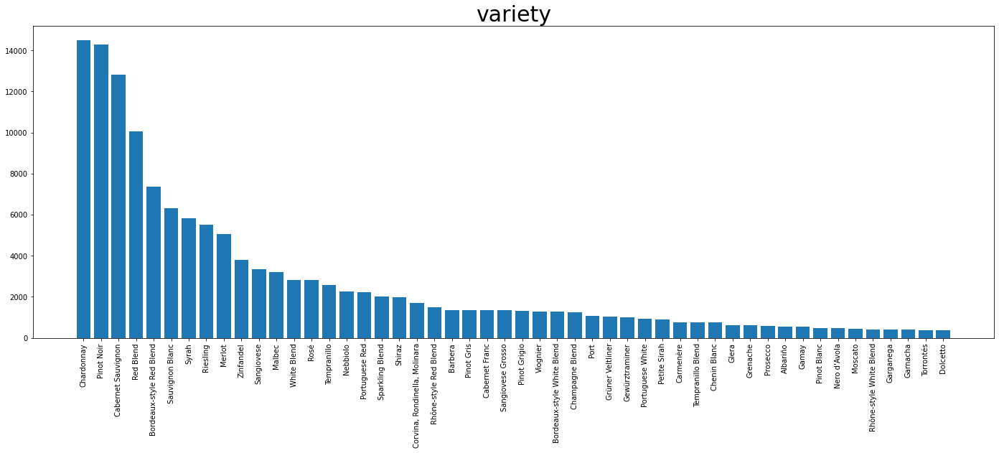

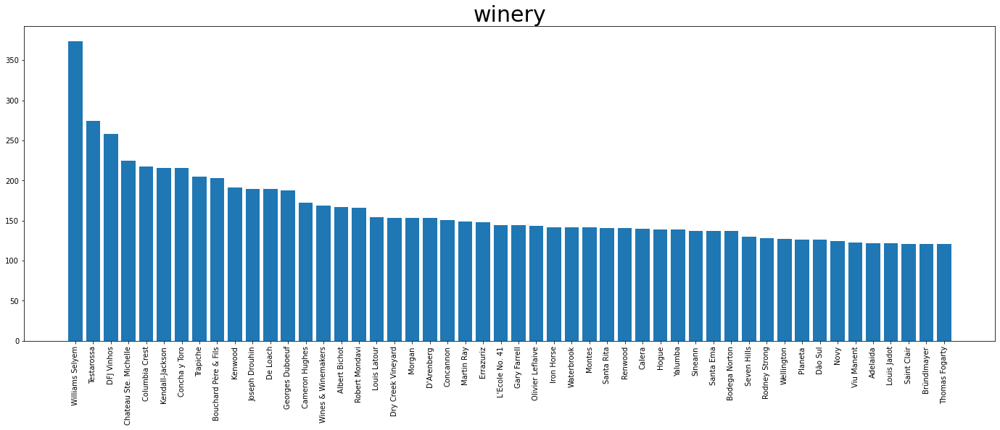

descriptive statistics (points):
Min: 80.0000	Q1(25%): 86.0000 	Q2(50%): 88.0000 	Q3(75%): 90.0000 	Max: 100.0000
Missing: 0

descriptive statistics (price):
Min: 4.0000	Q1(25%): 16.0000 	Q2(50%): 24.0000 	Q3(75%): 40.0000 	Max: 2300.0000
Missing: 13695



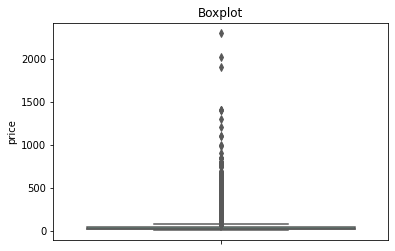

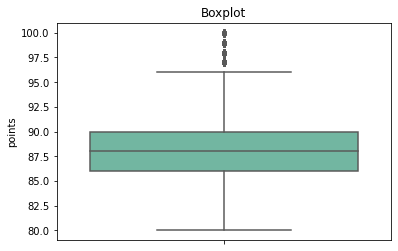

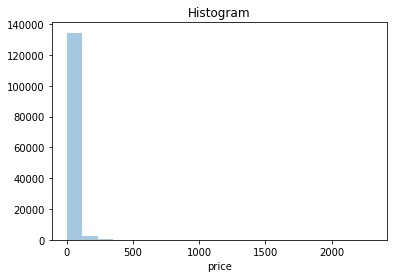

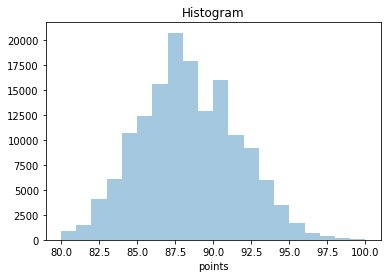

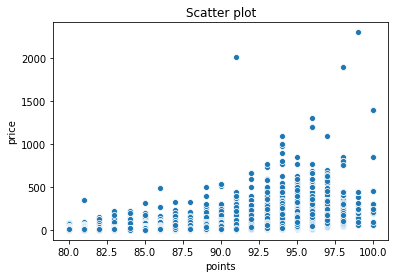

In [7]:
# Nominal index
nominal_index = ['country', 'designation', 'province', 'region_1', 'region_2', 'variety', 'winery']
# Numerical index
numerical_index = ['points', 'price']
nominal_summary(winemag150k,new_df=None,nominal_index=nominal_index,head_n=50)
numerical_summary(winemag150k,new_df=None,numerical_index=numerical_index)
viz_pairs(winemag150k,xlabel='points',ylabel='price',bins=20,new_df=None)

### 缺失值处理与对比

#### 1 将缺失部分剔除

<class 'pandas.core.frame.DataFrame'>
Int64Index: 150930 entries, 0 to 150929
Data columns (total 10 columns):
 #   Column       Non-Null Count   Dtype  
---  ------       --------------   -----  
 0   country      150925 non-null  object 
 1   description  150930 non-null  object 
 2   designation  105195 non-null  object 
 3   points       150930 non-null  int64  
 4   price        137235 non-null  float64
 5   province     150925 non-null  object 
 6   region_1     125870 non-null  object 
 7   region_2     60953 non-null   object 
 8   variety      150930 non-null  object 
 9   winery       150930 non-null  object 
dtypes: float64(1), int64(1), object(8)
memory usage: 12.7+ MB
None
(150930, 10)

<class 'pandas.core.frame.DataFrame'>
Int64Index: 39241 entries, 0 to 150916
Data columns (total 10 columns):
 #   Column       Non-Null Count  Dtype  
---  ------       --------------  -----  
 0   country      39241 non-null  object 
 1   description  39241 non-null  object 
 2   designat

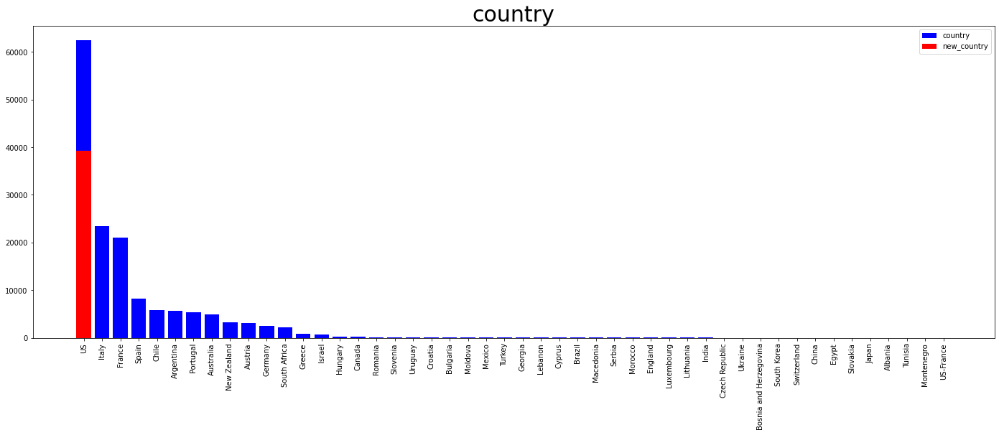

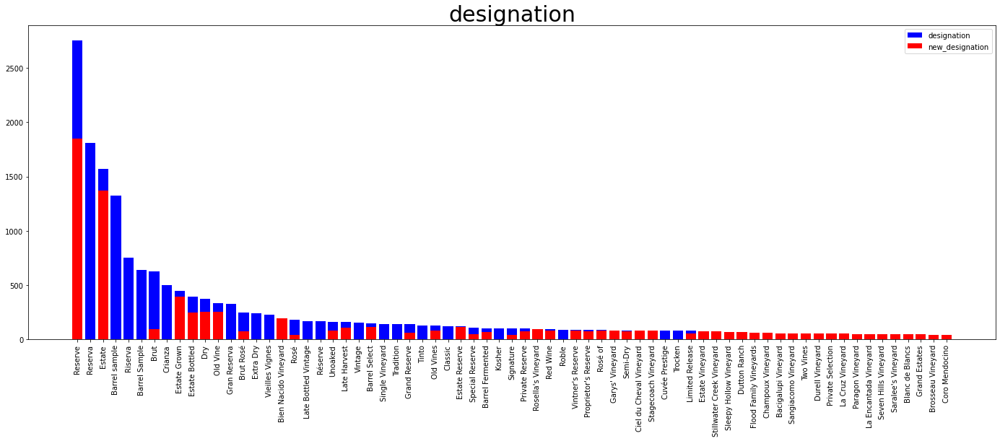

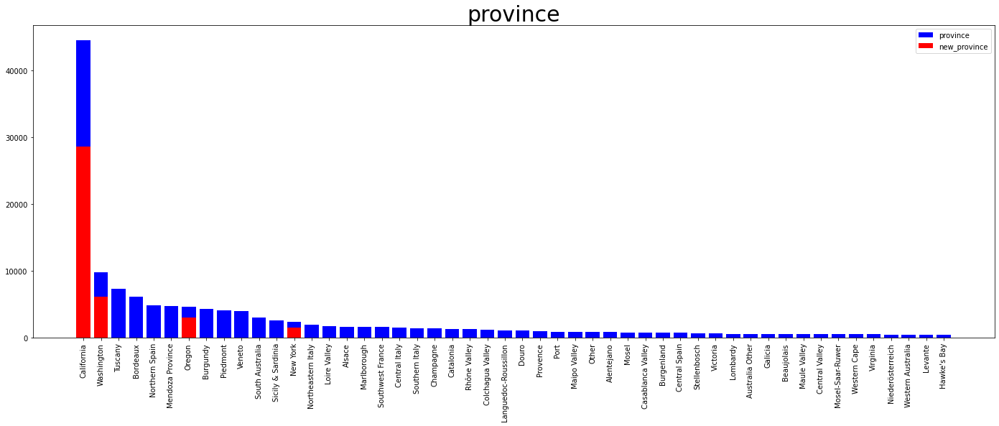

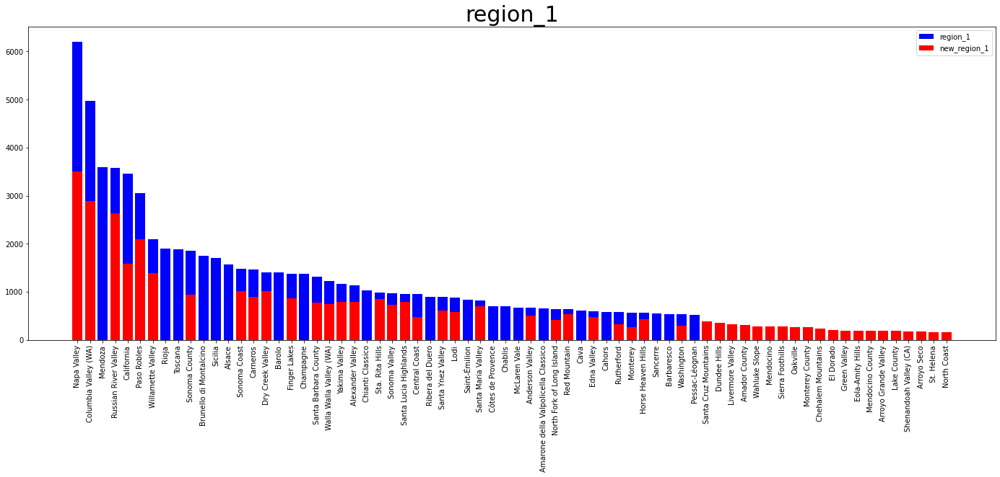

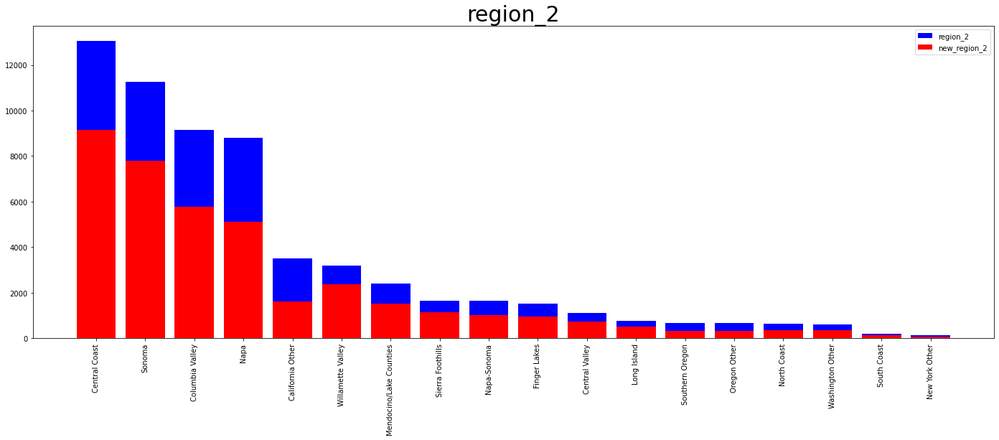

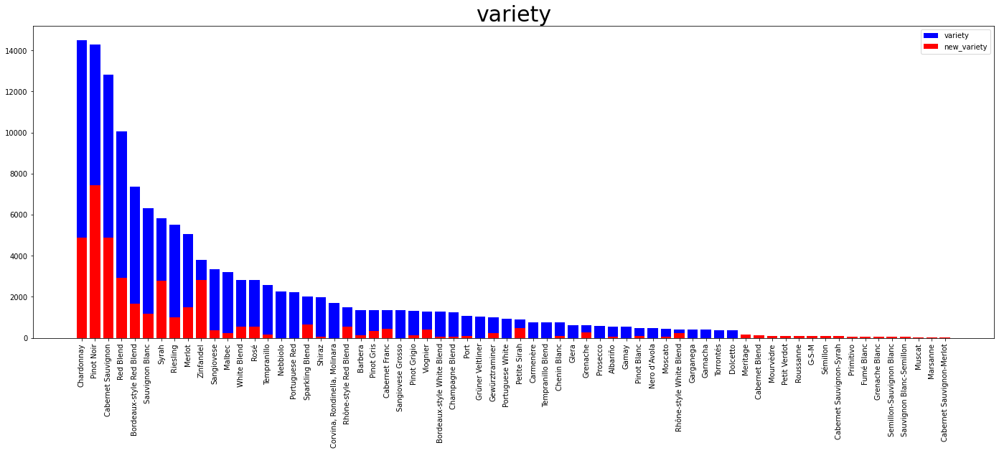

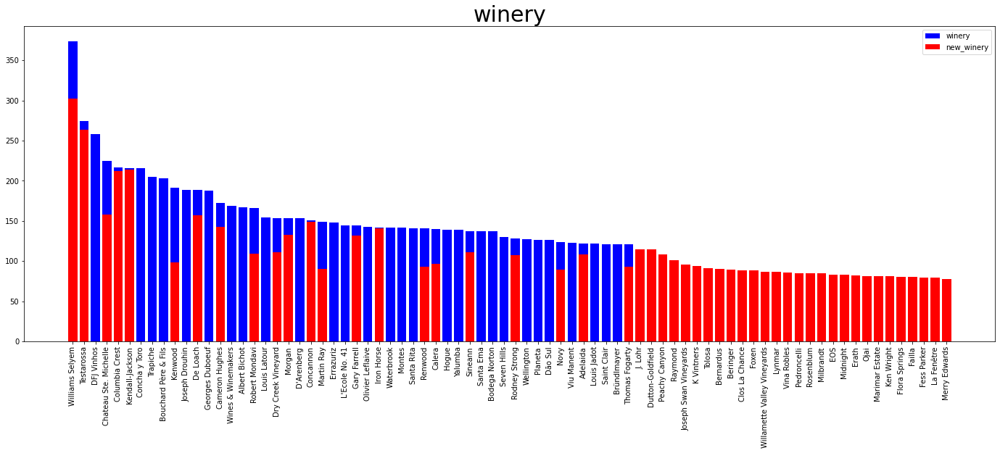

descriptive statistics (points):
Min: 80.0000	Q1(25%): 86.0000 	Q2(50%): 88.0000 	Q3(75%): 90.0000 	Max: 100.0000
Missing: 0

 new Min: 80.0000	Q1(25%): 86.0000 	Q2(50%): 88.0000 	Q3(75%): 91.0000 	Max: 100.0000 
 new Missing: 111689 

descriptive statistics (price):
Min: 4.0000	Q1(25%): 16.0000 	Q2(50%): 24.0000 	Q3(75%): 40.0000 	Max: 2300.0000
Missing: 13695

 new Min: 4.0000	Q1(25%): 22.0000 	Q2(50%): 32.0000 	Q3(75%): 45.0000 	Max: 2013.0000 
 new Missing: 111689 



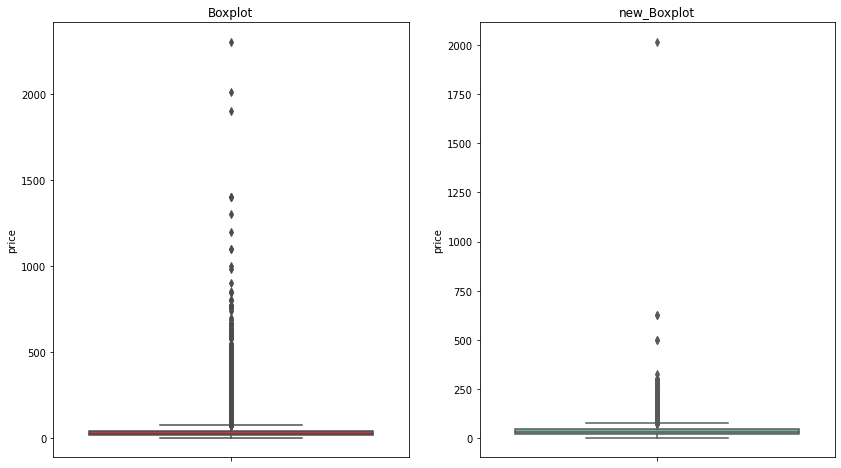

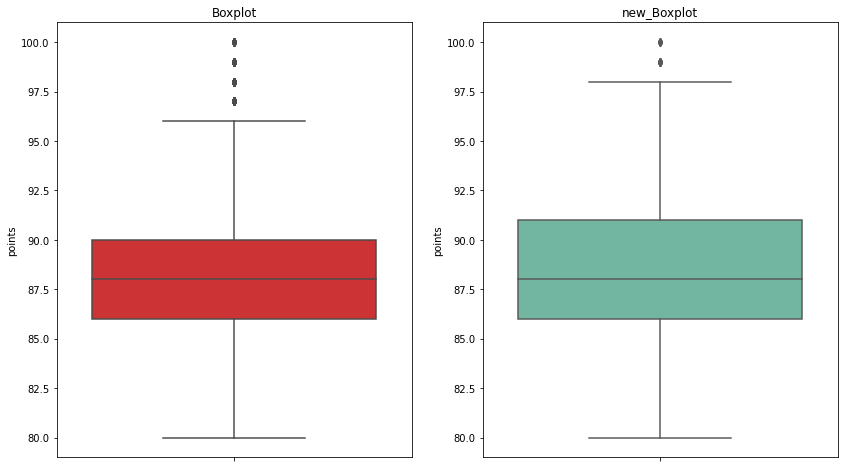

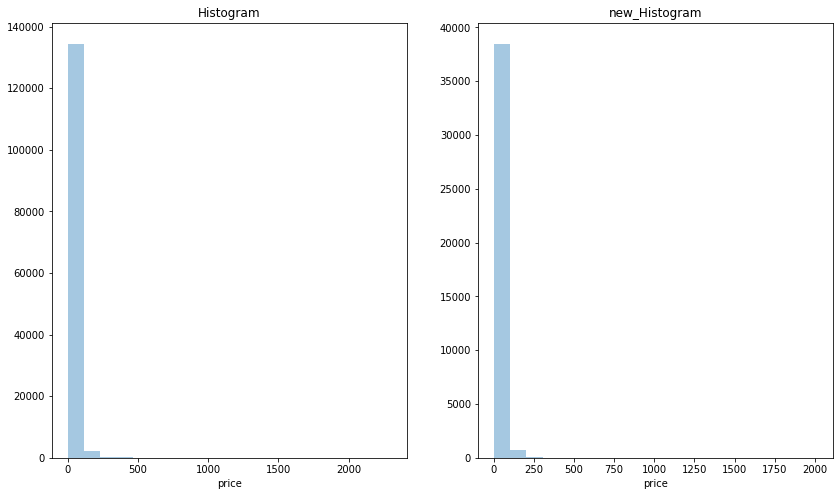

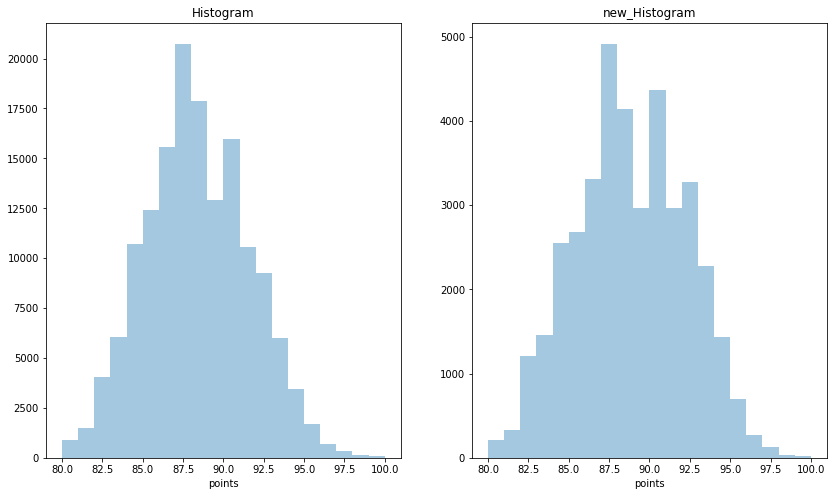

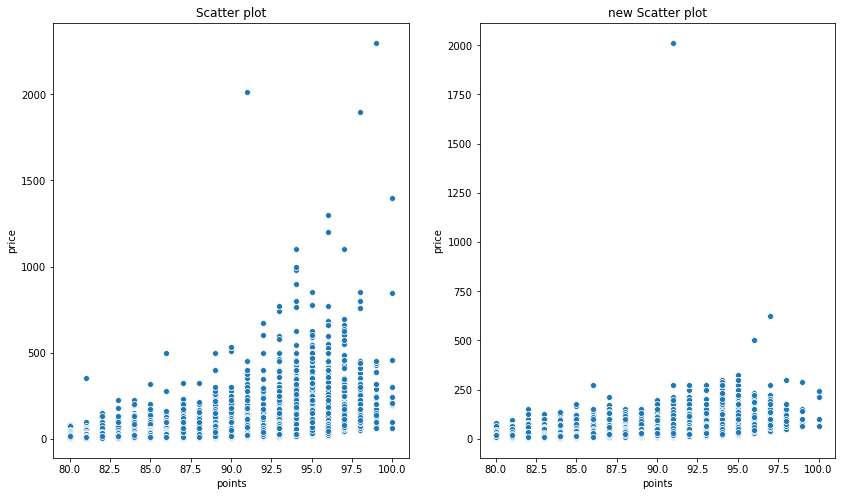

In [8]:
dw150k=miss_drop(winemag150k)
columns_info(winemag150k,show_shape=True,new_df=dw150k)
nominal_summary(winemag150k,nominal_index=nominal_index,head_n=50,new_df=dw150k)
numerical_summary(winemag150k,numerical_index=numerical_index,new_df=dw150k)
viz_pairs(winemag150k,xlabel='points',ylabel='price',bins=20,new_df=dw150k)

#### 2 用最高频率值来填补缺失值

<class 'pandas.core.frame.DataFrame'>
Int64Index: 150930 entries, 0 to 150929
Data columns (total 10 columns):
 #   Column       Non-Null Count   Dtype  
---  ------       --------------   -----  
 0   country      150925 non-null  object 
 1   description  150930 non-null  object 
 2   designation  105195 non-null  object 
 3   points       150930 non-null  int64  
 4   price        137235 non-null  float64
 5   province     150925 non-null  object 
 6   region_1     125870 non-null  object 
 7   region_2     60953 non-null   object 
 8   variety      150930 non-null  object 
 9   winery       150930 non-null  object 
dtypes: float64(1), int64(1), object(8)
memory usage: 12.7+ MB
None
(150930, 10)

<class 'pandas.core.frame.DataFrame'>
Int64Index: 150930 entries, 0 to 150929
Data columns (total 10 columns):
 #   Column       Non-Null Count   Dtype  
---  ------       --------------   -----  
 0   country      150930 non-null  object 
 1   description  150930 non-null  object 
 2   des

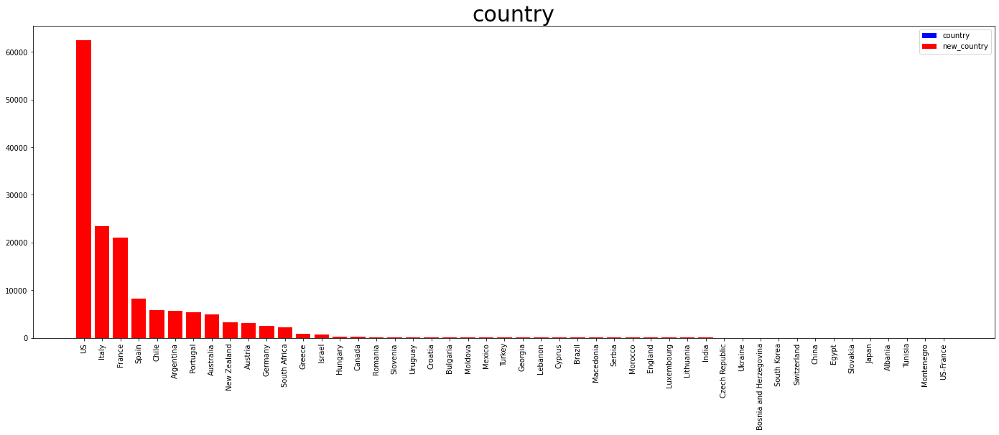

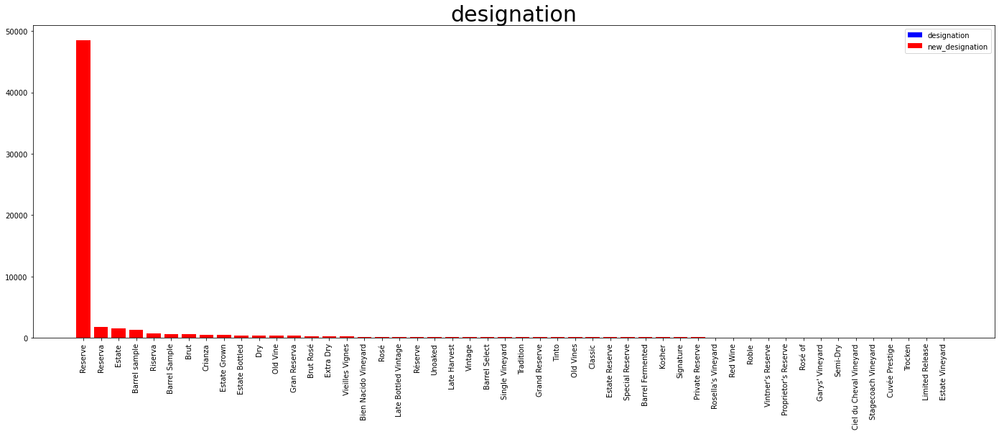

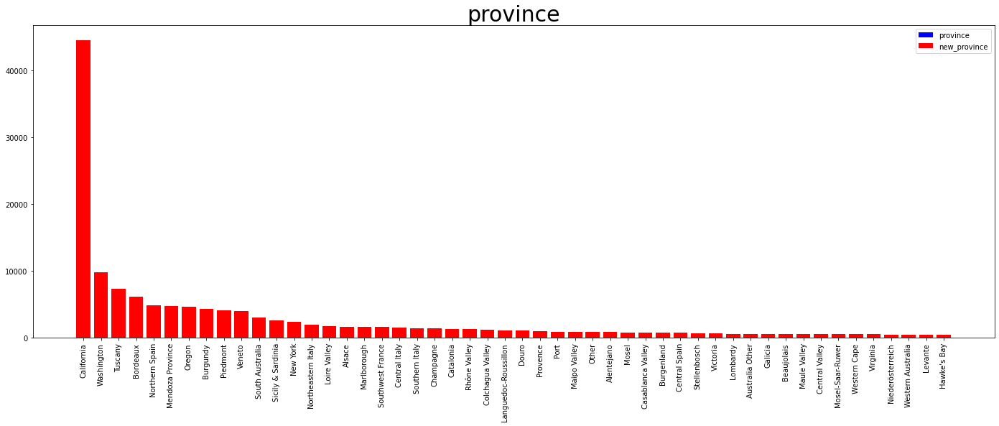

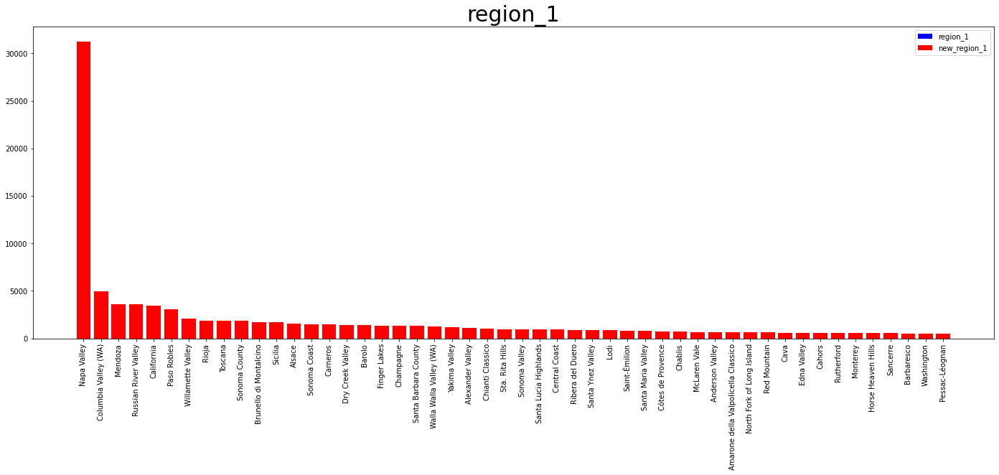

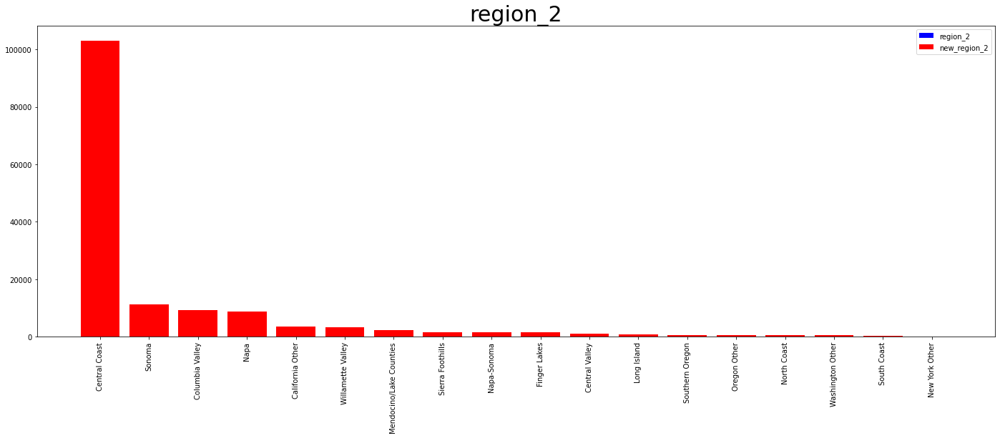

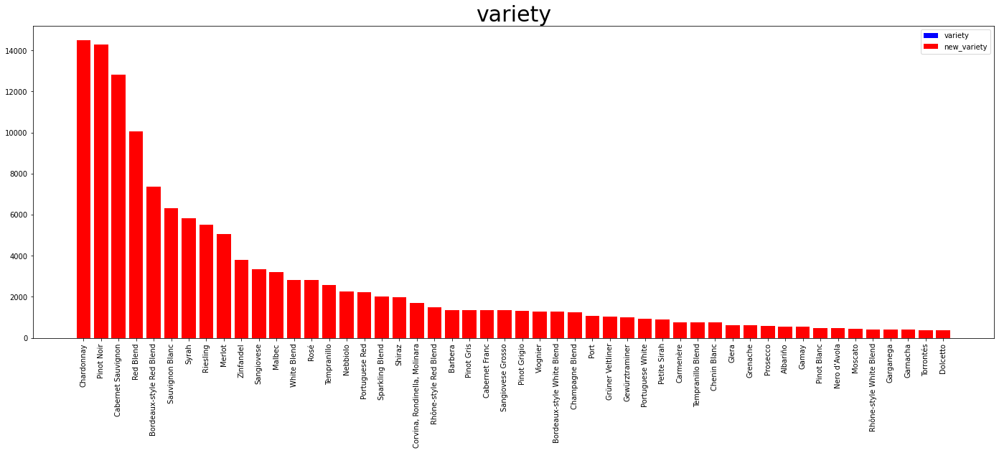

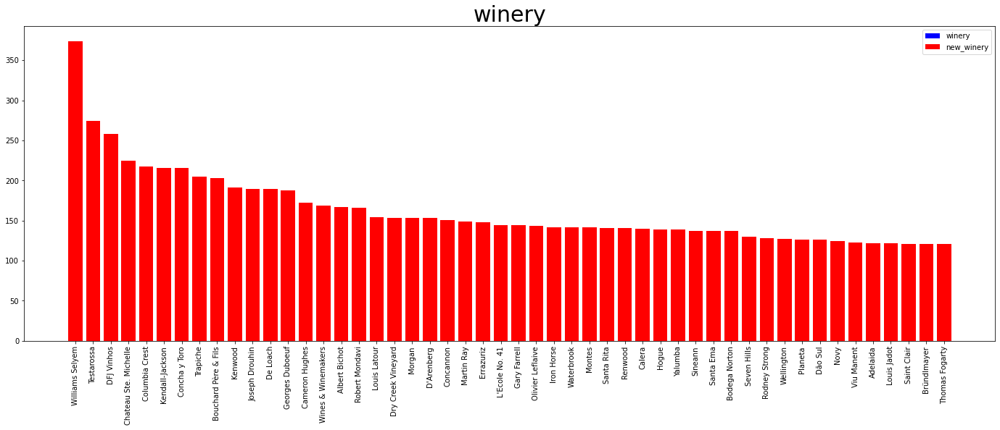

descriptive statistics (points):
Min: 80.0000	Q1(25%): 86.0000 	Q2(50%): 88.0000 	Q3(75%): 90.0000 	Max: 100.0000
Missing: 0

 new Min: 80.0000	Q1(25%): 86.0000 	Q2(50%): 88.0000 	Q3(75%): 90.0000 	Max: 100.0000 
 new Missing: 0 

descriptive statistics (price):
Min: 4.0000	Q1(25%): 16.0000 	Q2(50%): 24.0000 	Q3(75%): 40.0000 	Max: 2300.0000
Missing: 13695

 new Min: 4.0000	Q1(25%): 16.0000 	Q2(50%): 22.0000 	Q3(75%): 38.0000 	Max: 2300.0000 
 new Missing: 0 



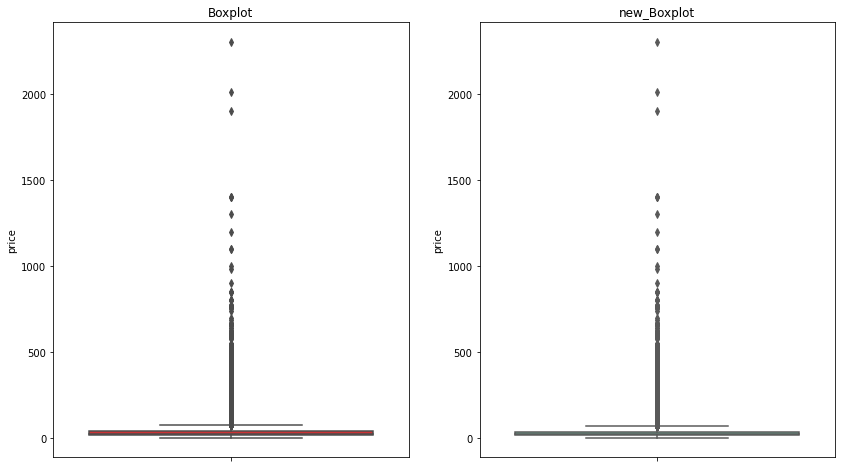

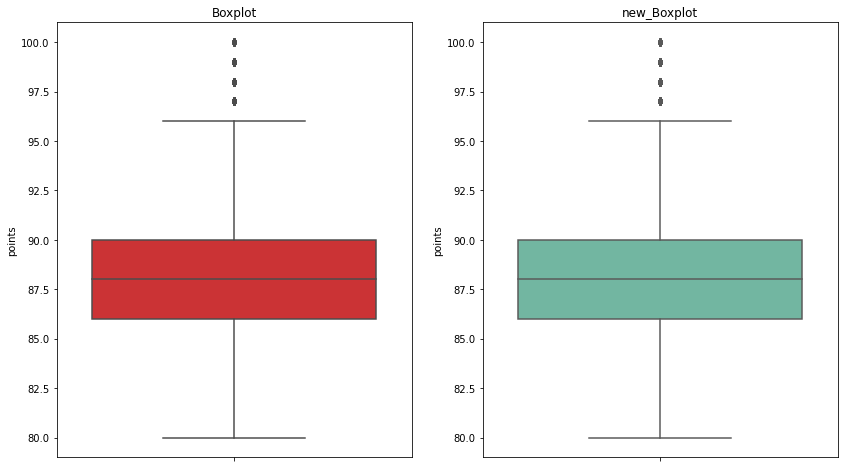

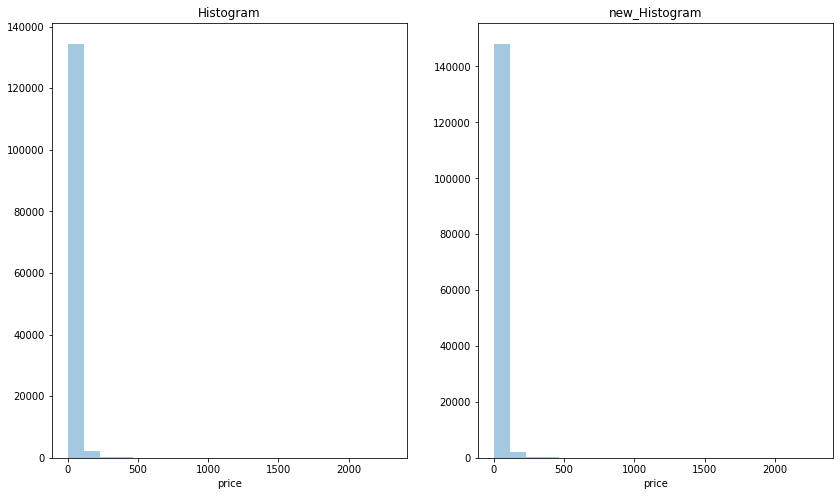

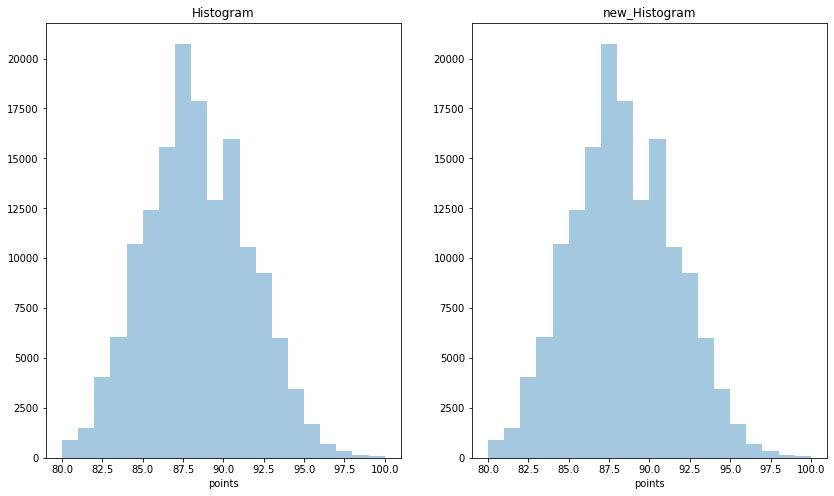

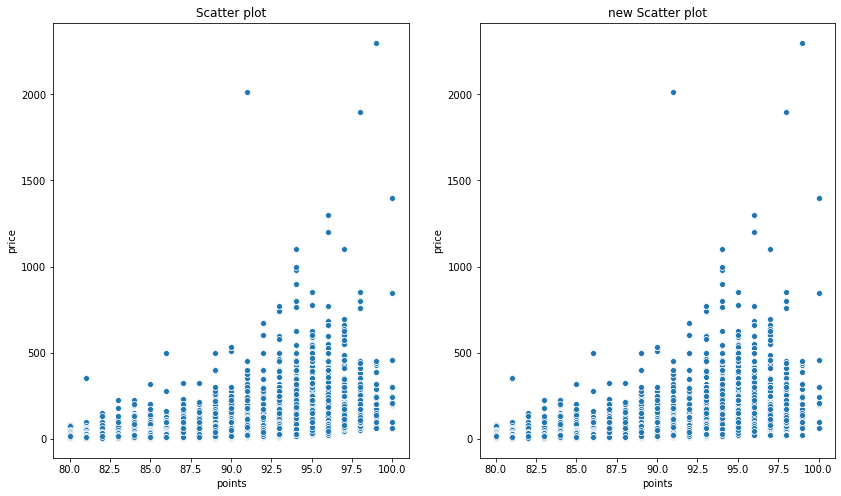

In [9]:
md150k=miss_mode_fill(winemag150k)
columns_info(winemag150k,show_shape=True,new_df=md150k)
nominal_summary(winemag150k,nominal_index=nominal_index,head_n=50,new_df=md150k)
numerical_summary(winemag150k,numerical_index=numerical_index,new_df=md150k)
viz_pairs(winemag150k,xlabel='points',ylabel='price',bins=20,new_df=md150k)

#### 3 通过属性的相关关系来填补缺失值

In [0]:
miss_index=['country','designation','price','province','region_1','region_2']
comp_index=['description','points','variety','winery']
att150k=attr_corr_fill(winemag150k,miss_index=miss_index,complete_index=comp_index)
columns_info(winemag150k,show_shape=True,new_df=att150k)
nominal_summary(winemag150k,nominal_index=nominal_index,head_n=50,new_df=att150k)
numerical_summary(winemag150k,numerical_index=numerical_index,new_df=att150k)
viz_pairs(winemag150k,xlabel='points',ylabel='price',bins=20,new_df=att150k)

#### 4 通过数据对象之间的相似性来填补缺失值

In [0]:
obj150k=obj_corr_fill(winemag150k,numerical_index=numerical_index,k=10)
columns_info(winemag150k,show_shape=True,new_df=obj150k)
nominal_summary(winemag150k,nominal_index=nominal_index,head_n=50,new_df=obj150k)
numerical_summary(winemag150k,numerical_index=numerical_index,new_df=obj150k)
viz_pairs(winemag150k,xlabel='points',ylabel='price',bins=20,new_df=obj150k)

## winemag-data-130k-v2.csv

In [11]:
wine_reviews_dir = "./wine-reviews"
winemag130k=pd.read_csv(wine_reviews_dir+"/winemag-data-130k-v2.csv",sep=',',header='infer',index_col=0)
columns_info(winemag130k)

<class 'pandas.core.frame.DataFrame'>
Int64Index: 129971 entries, 0 to 129970
Data columns (total 13 columns):
 #   Column                 Non-Null Count   Dtype  
---  ------                 --------------   -----  
 0   country                129908 non-null  object 
 1   description            129971 non-null  object 
 2   designation            92506 non-null   object 
 3   points                 129971 non-null  int64  
 4   price                  120975 non-null  float64
 5   province               129908 non-null  object 
 6   region_1               108724 non-null  object 
 7   region_2               50511 non-null   object 
 8   taster_name            103727 non-null  object 
 9   taster_twitter_handle  98758 non-null   object 
 10  title                  129971 non-null  object 
 11  variety                129970 non-null  object 
 12  winery                 129971 non-null  object 
dtypes: float64(1), int64(1), object(11)
memory usage: 13.9+ MB
None
(129971, 13)


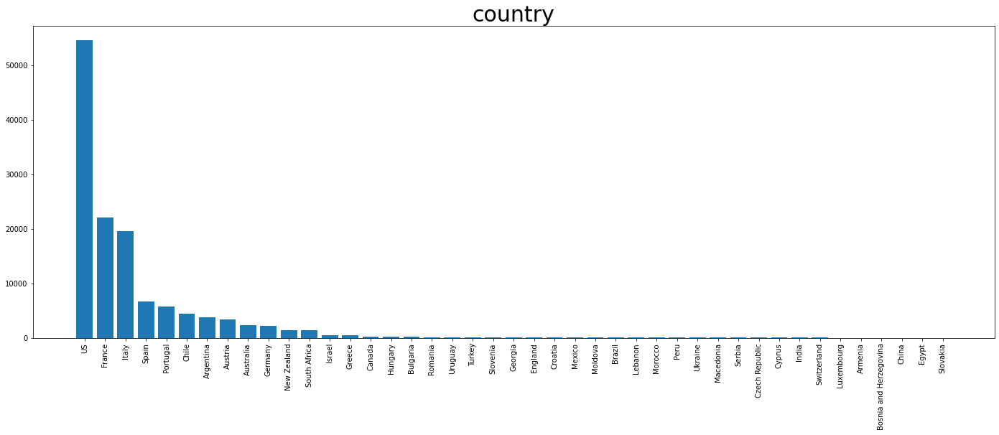

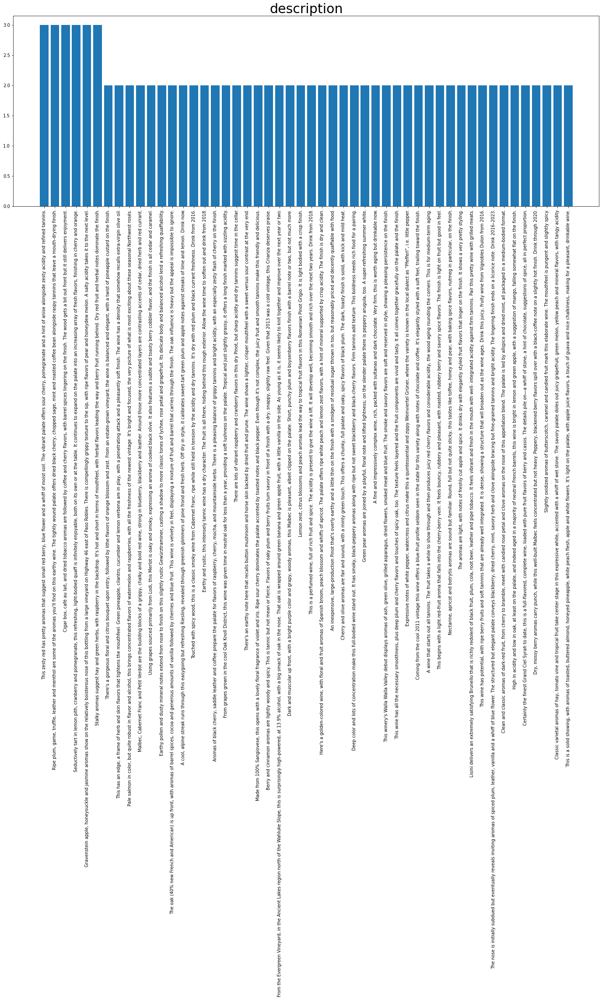

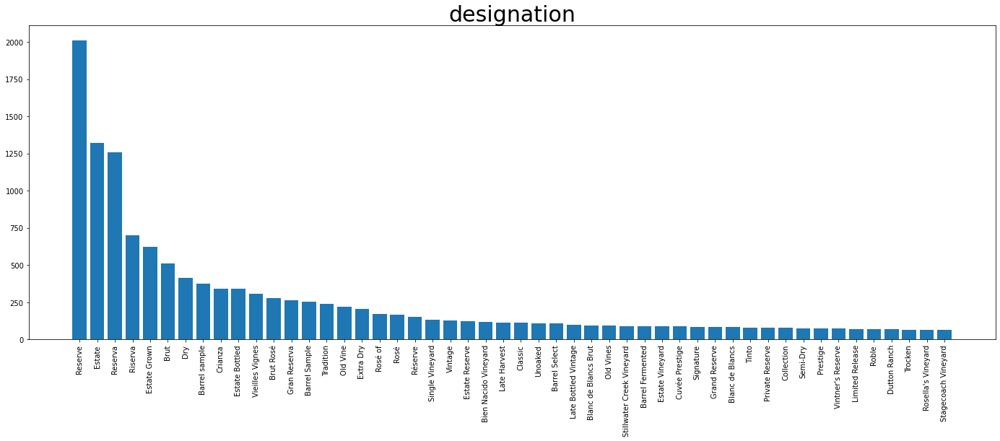

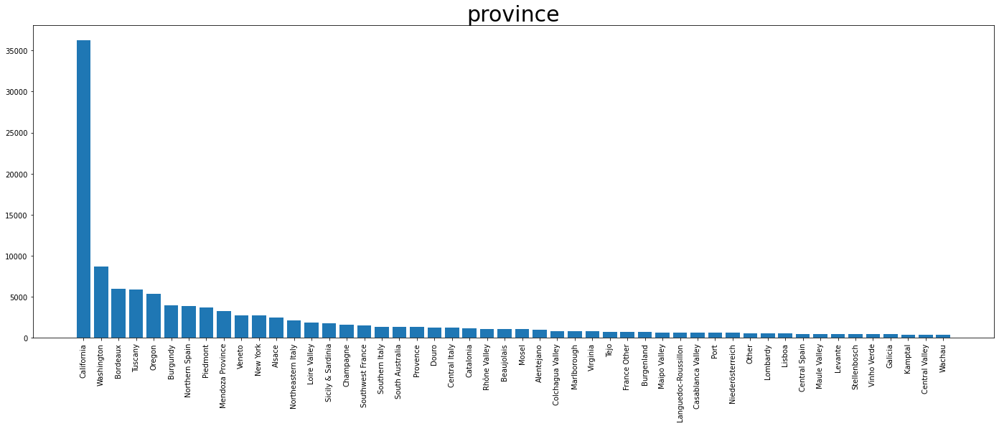

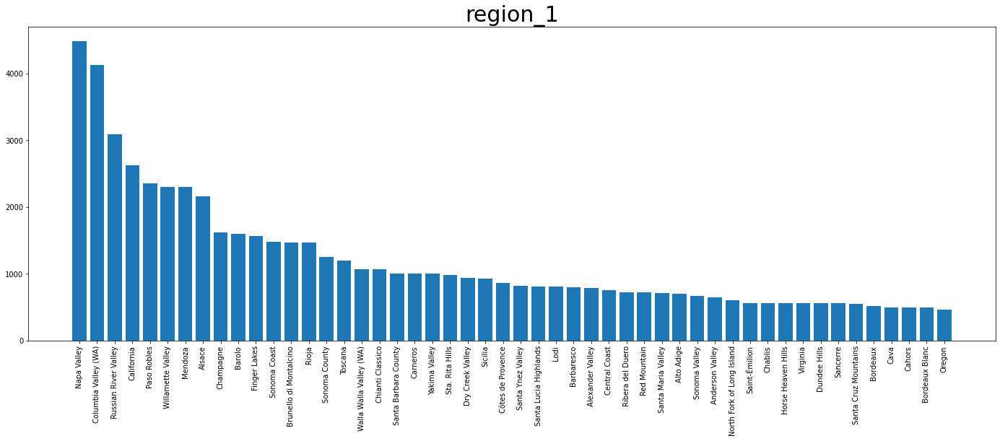

...

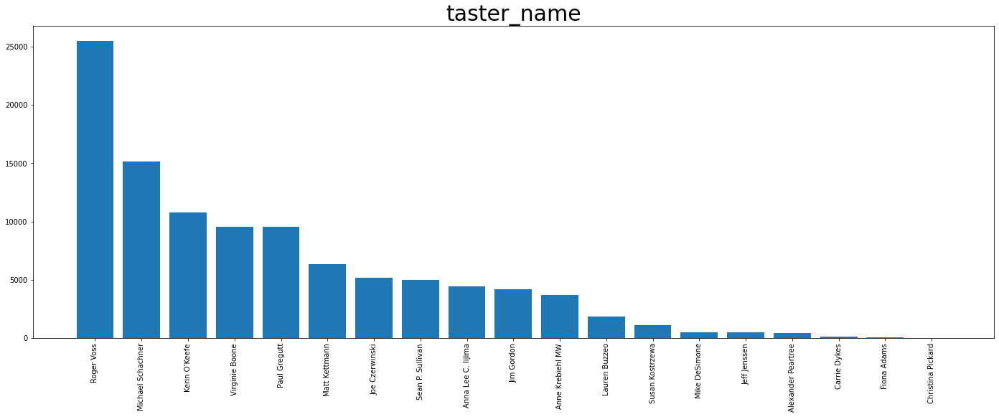

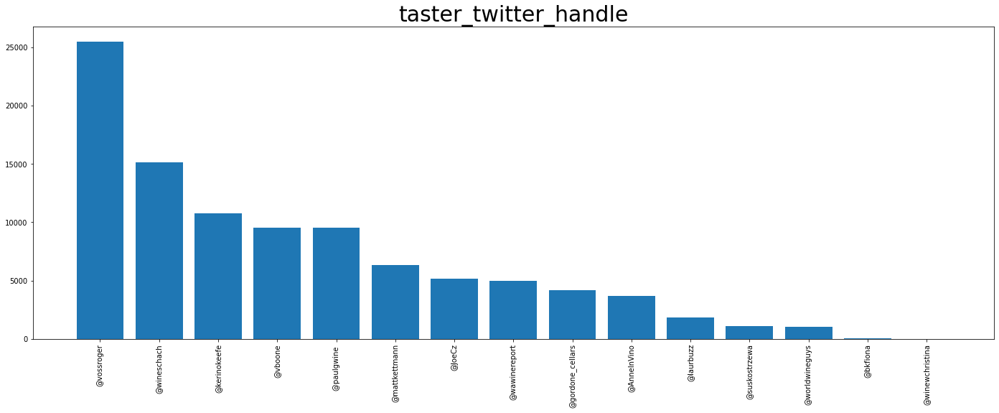

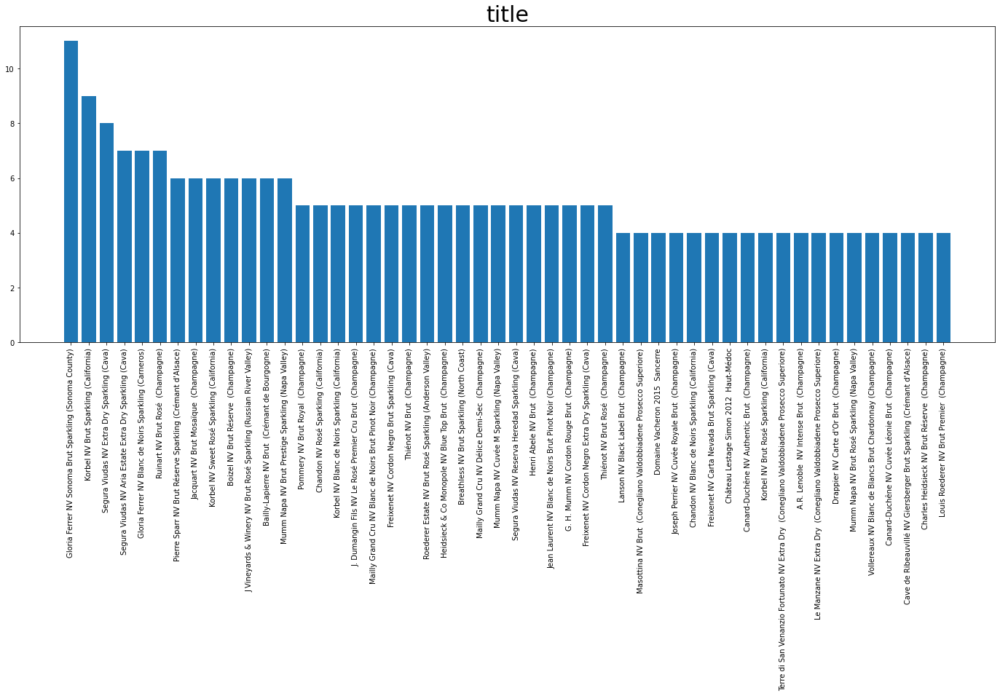

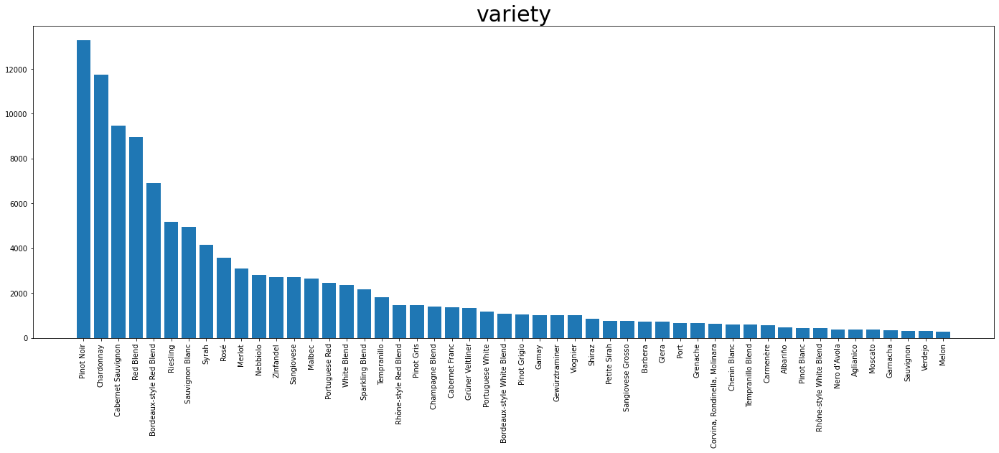

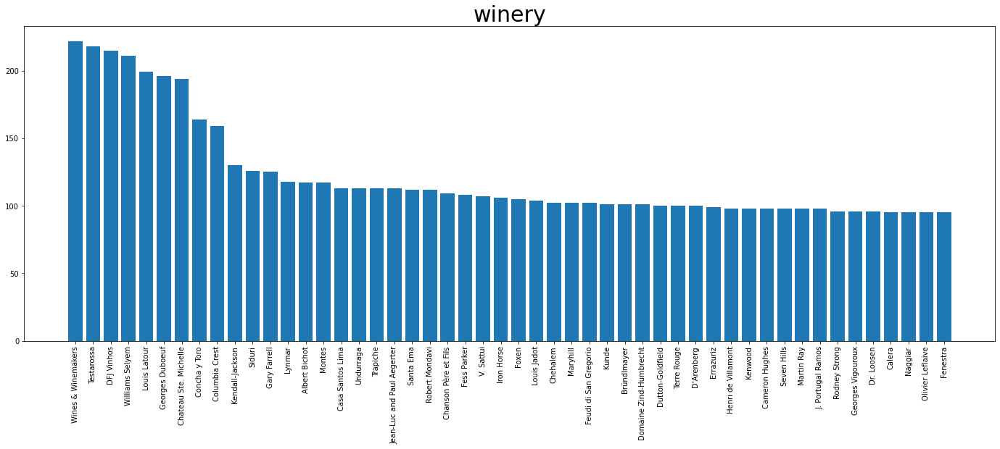

descriptive statistics (points):
Min: 80.0000	Q1(25%): 86.0000 	Q2(50%): 88.0000 	Q3(75%): 91.0000 	Max: 100.0000
Missing: 0

descriptive statistics (price):
Min: 4.0000	Q1(25%): 17.0000 	Q2(50%): 25.0000 	Q3(75%): 42.0000 	Max: 3300.0000
Missing: 8996



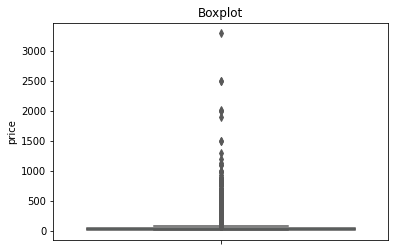

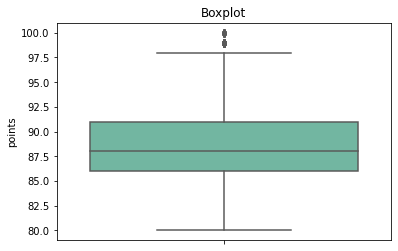

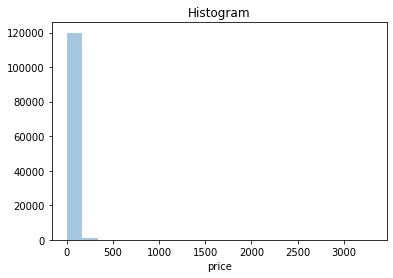

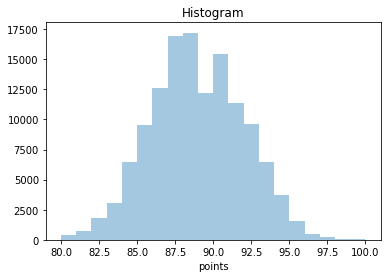

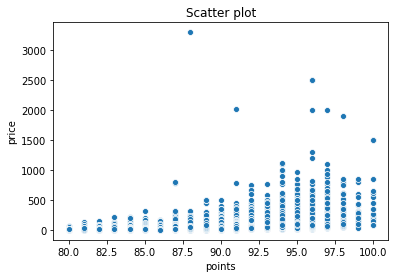

In [24]:
# Nominal index
nominal_index = ['country','description', 'designation', 'province', 'region_1', 'region_2', 
                 'taster_name','taster_twitter_handle','title',
                 'variety', 'winery']
# Numerical index
numerical_index = ['points', 'price']
nominal_summary(winemag130k,nominal_index,head_n=50)
numerical_summary(winemag130k,numerical_index)
viz_pairs(winemag130k,xlabel='points',ylabel='price',bins=20,new_df=None)

### 缺失值处理与对比

#### 1 将缺失部分剔除

<class 'pandas.core.frame.DataFrame'>
Int64Index: 129971 entries, 0 to 129970
Data columns (total 13 columns):
 #   Column                 Non-Null Count   Dtype  
---  ------                 --------------   -----  
 0   country                129908 non-null  object 
 1   description            129971 non-null  object 
 2   designation            92506 non-null   object 
 3   points                 129971 non-null  int64  
 4   price                  120975 non-null  float64
 5   province               129908 non-null  object 
 6   region_1               108724 non-null  object 
 7   region_2               50511 non-null   object 
 8   taster_name            103727 non-null  object 
 9   taster_twitter_handle  98758 non-null   object 
 10  title                  129971 non-null  object 
 11  variety                129970 non-null  object 
 12  winery                 129971 non-null  object 
dtypes: float64(1), int64(1), object(11)
memory usage: 13.9+ MB
None
(129971, 13)

<class 'pan

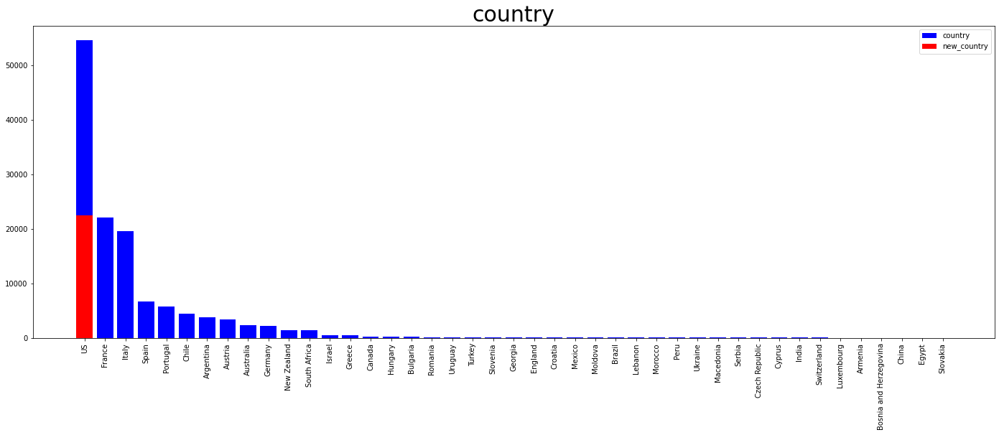

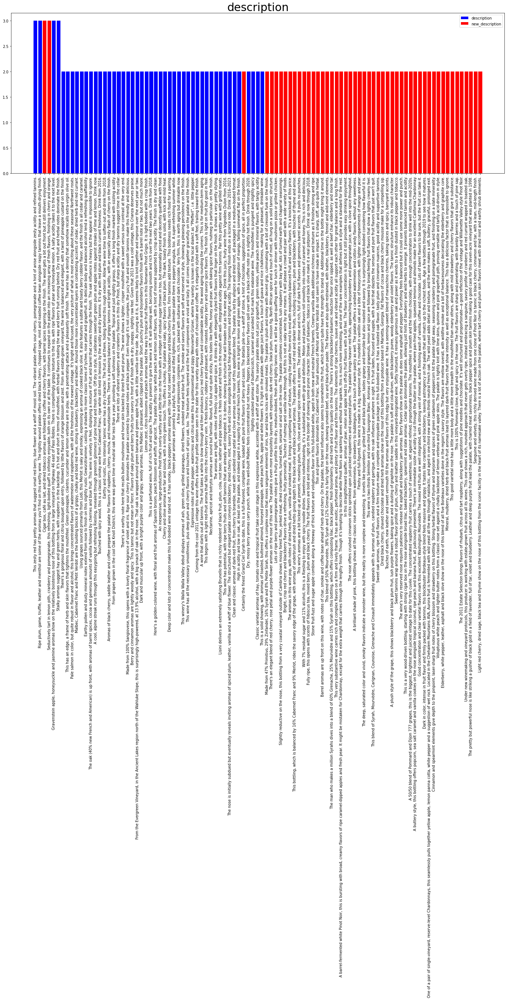

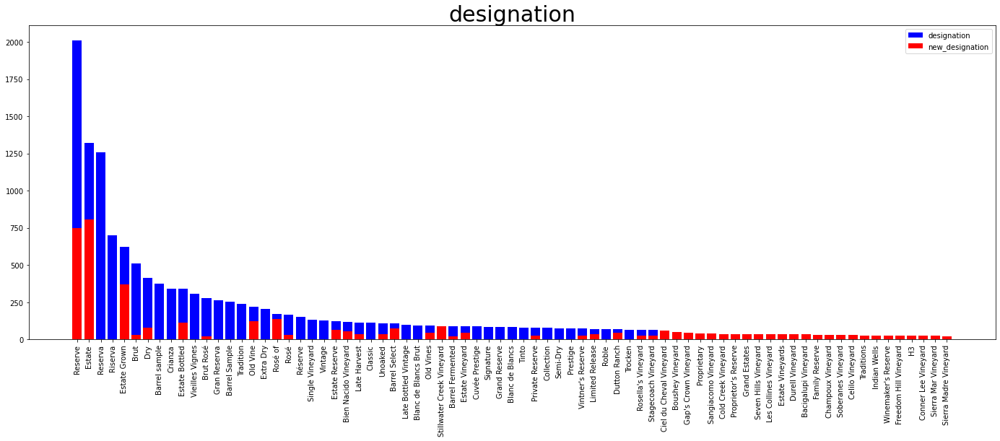

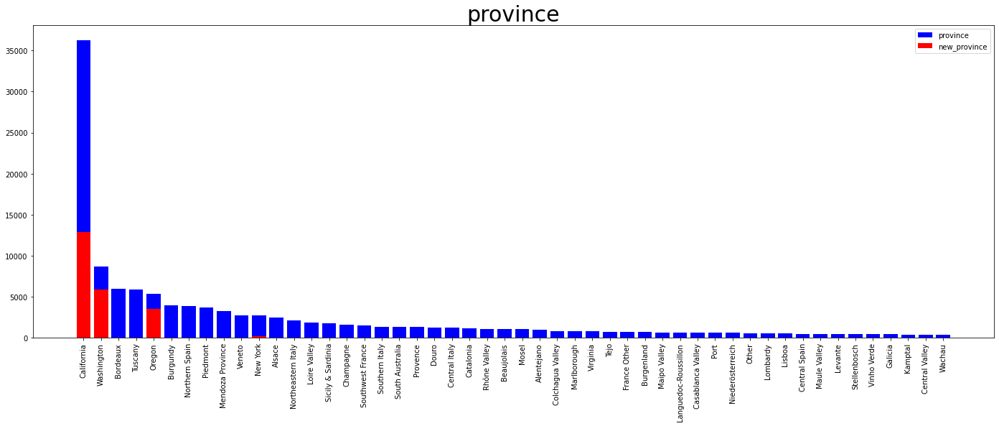

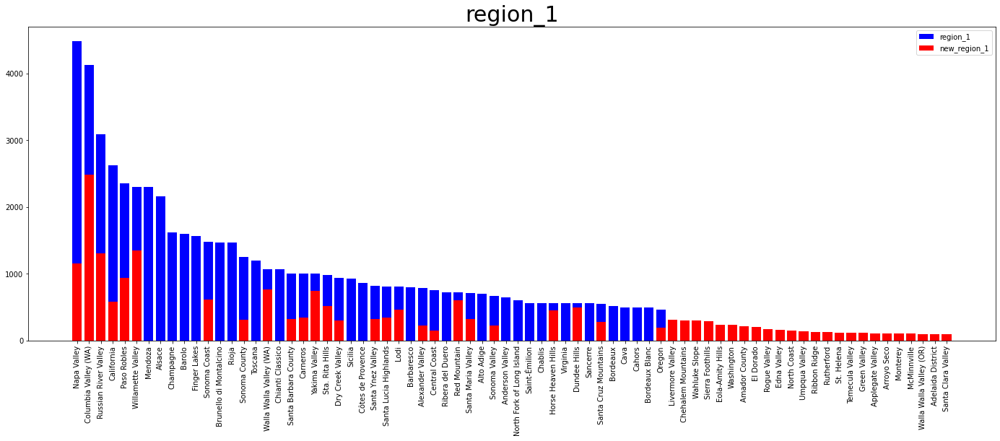

...

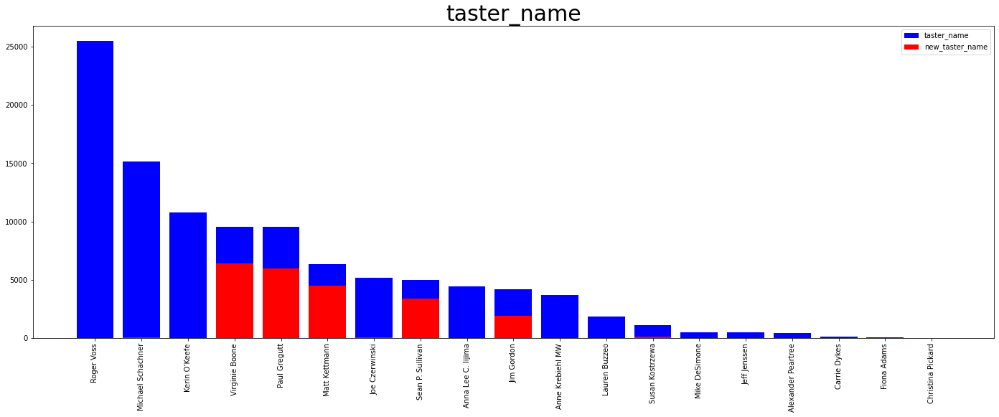

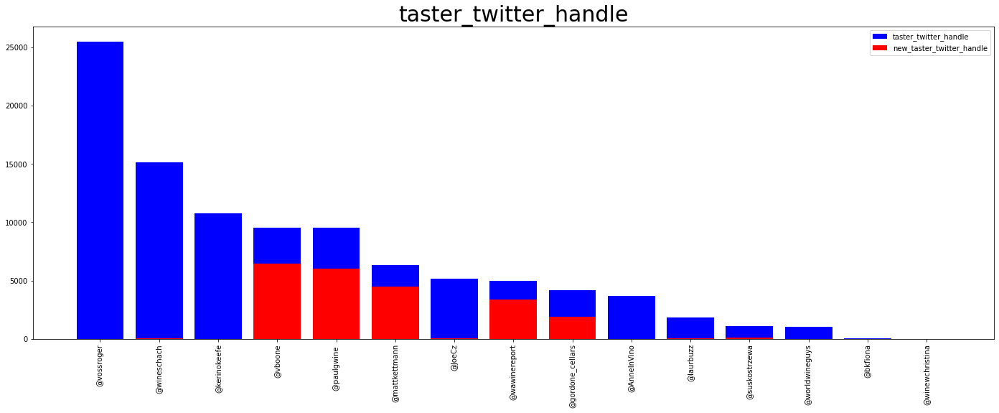

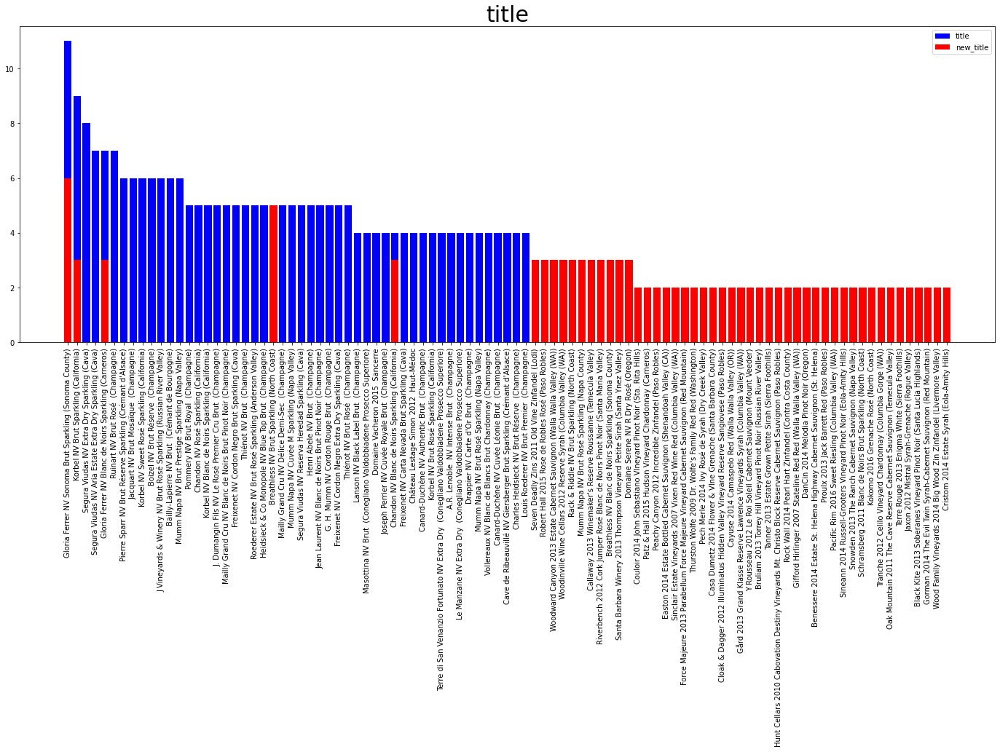

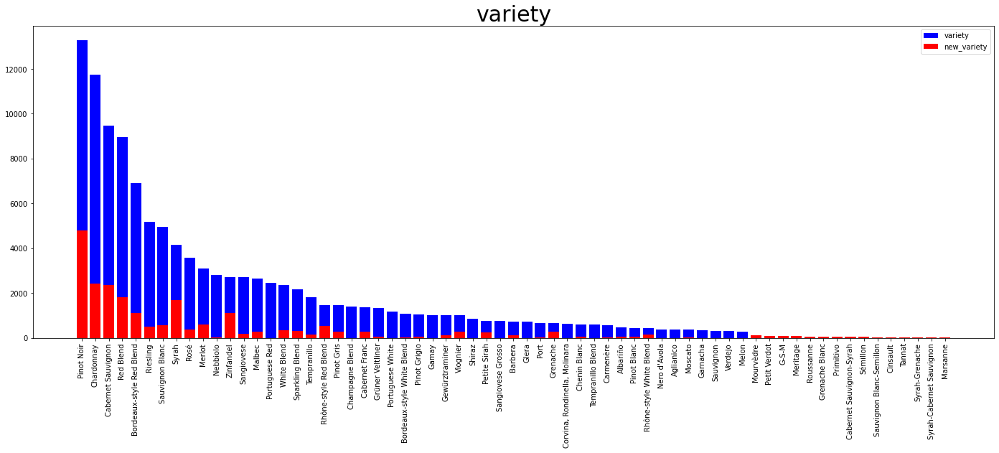

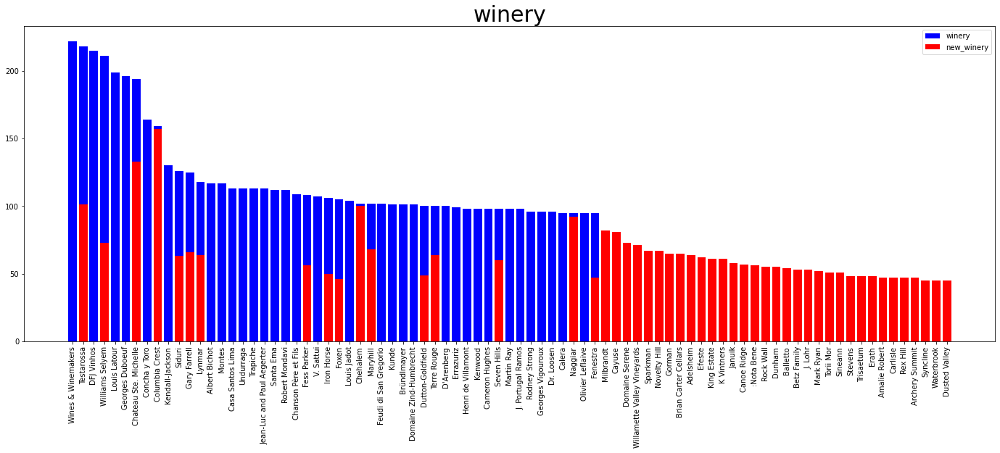

descriptive statistics (points):
Min: 80.0000	Q1(25%): 86.0000 	Q2(50%): 88.0000 	Q3(75%): 91.0000 	Max: 100.0000
Missing: 0

 new Min: 80.0000	Q1(25%): 88.0000 	Q2(50%): 90.0000 	Q3(75%): 92.0000 	Max: 100.0000 
 new Missing: 107584 

descriptive statistics (price):
Min: 4.0000	Q1(25%): 17.0000 	Q2(50%): 25.0000 	Q3(75%): 42.0000 	Max: 3300.0000
Missing: 8996

 new Min: 4.0000	Q1(25%): 25.0000 	Q2(50%): 36.0000 	Q3(75%): 50.0000 	Max: 2013.0000 
 new Missing: 107584 



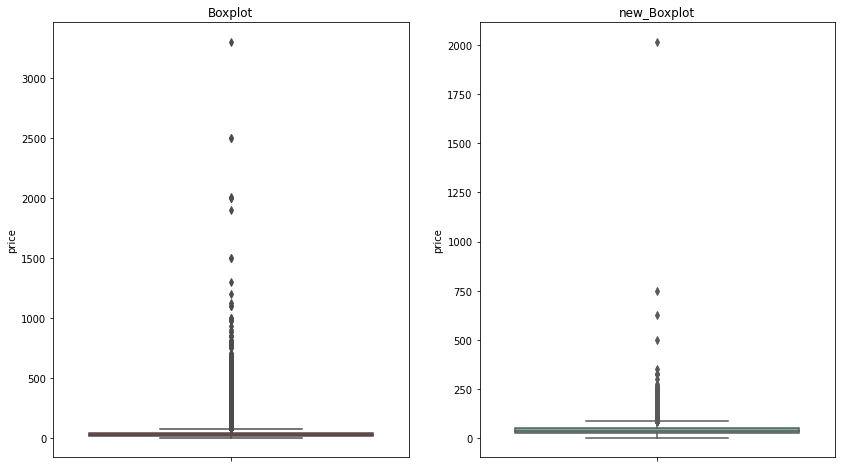

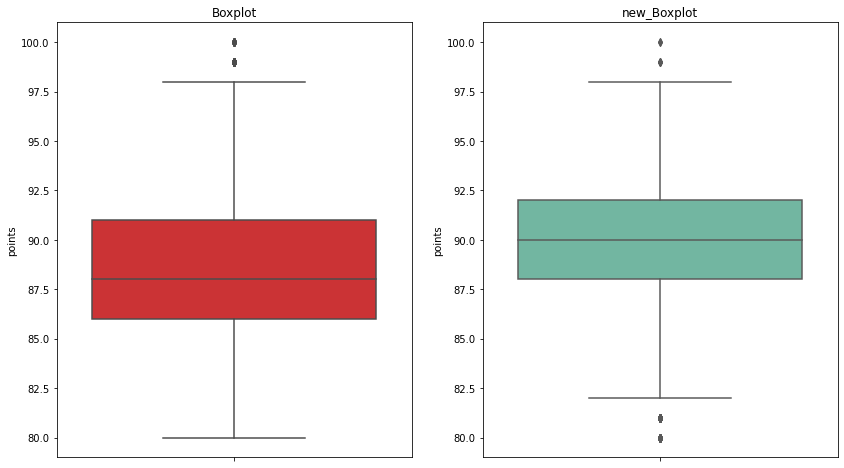

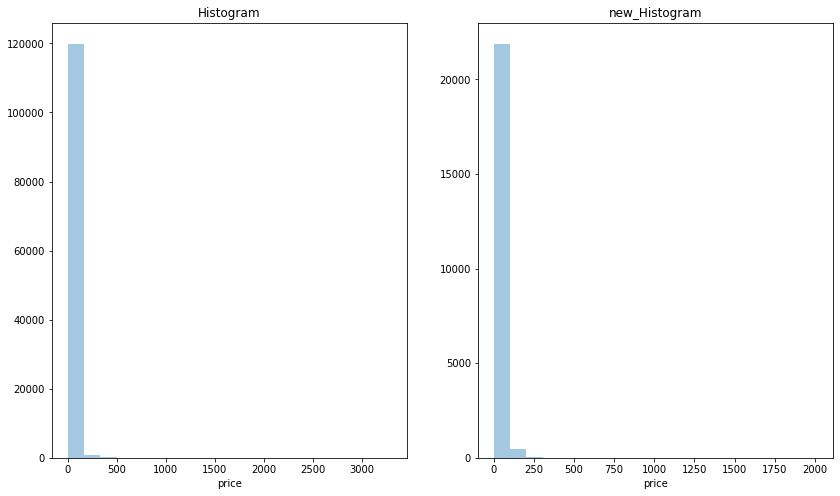

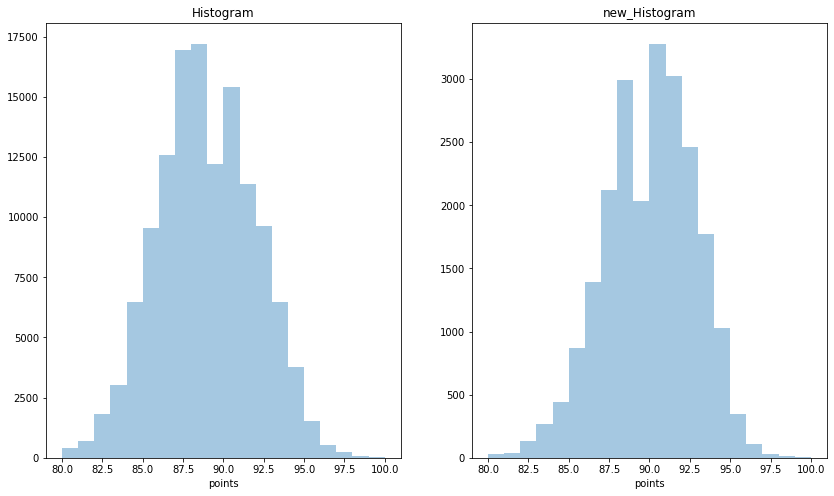

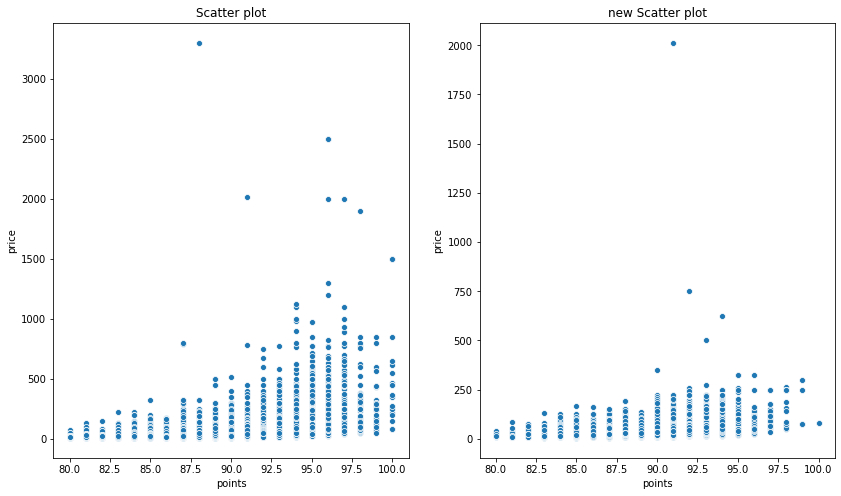

In [13]:
dw130k=miss_drop(winemag130k)
columns_info(winemag130k,show_shape=True,new_df=dw130k)
nominal_summary(winemag130k,nominal_index=nominal_index,head_n=50,new_df=dw130k)
numerical_summary(winemag130k,numerical_index=numerical_index,new_df=dw130k)
viz_pairs(winemag130k,xlabel='points',ylabel='price',bins=20,new_df=dw130k)

#### 2 用最高频率值来填补缺失值

<class 'pandas.core.frame.DataFrame'>
Int64Index: 129971 entries, 0 to 129970
Data columns (total 13 columns):
 #   Column                 Non-Null Count   Dtype  
---  ------                 --------------   -----  
 0   country                129908 non-null  object 
 1   description            129971 non-null  object 
 2   designation            92506 non-null   object 
 3   points                 129971 non-null  int64  
 4   price                  120975 non-null  float64
 5   province               129908 non-null  object 
 6   region_1               108724 non-null  object 
 7   region_2               50511 non-null   object 
 8   taster_name            103727 non-null  object 
 9   taster_twitter_handle  98758 non-null   object 
 10  title                  129971 non-null  object 
 11  variety                129970 non-null  object 
 12  winery                 129971 non-null  object 
dtypes: float64(1), int64(1), object(11)
memory usage: 13.9+ MB
None
(129971, 13)

<class 'pan

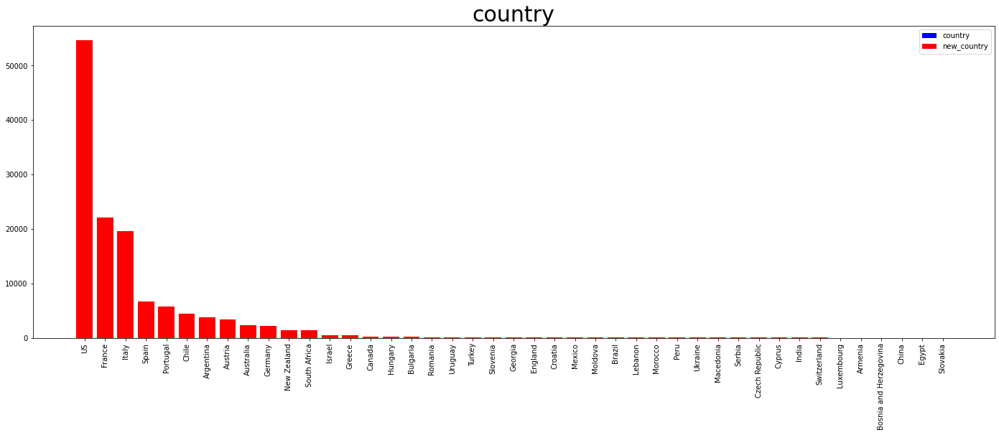

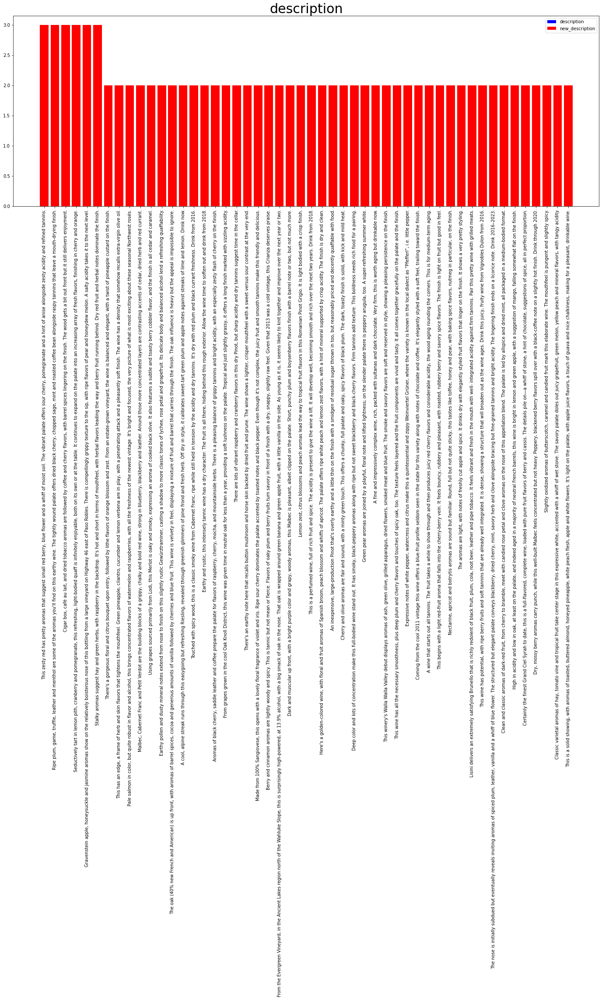

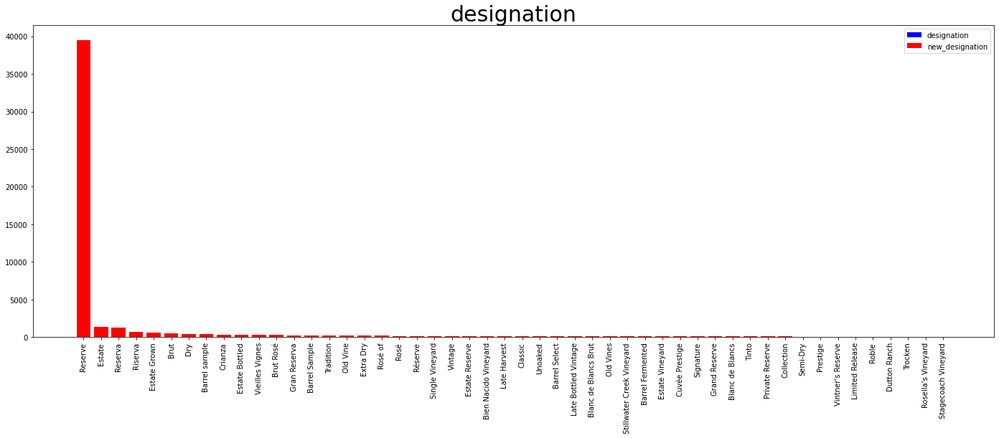

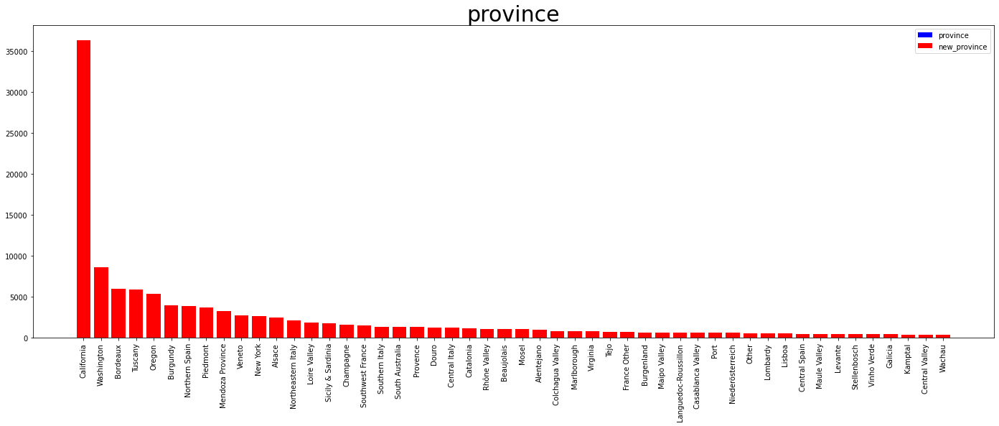

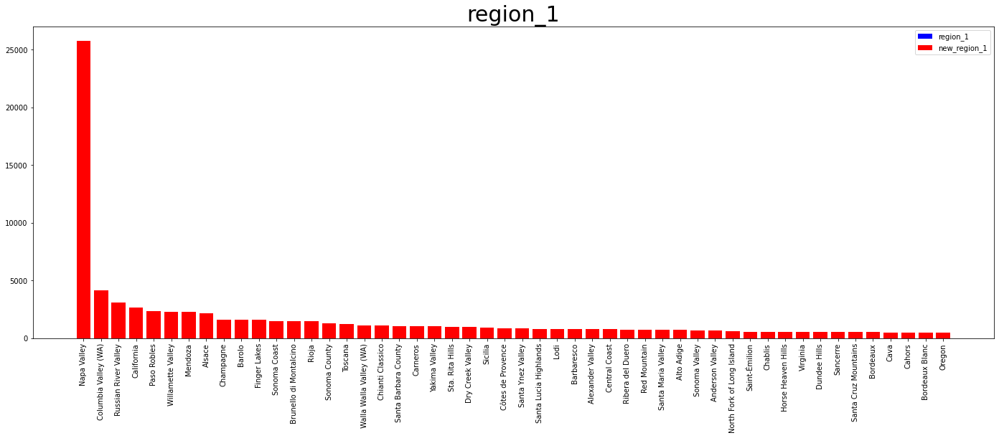

...

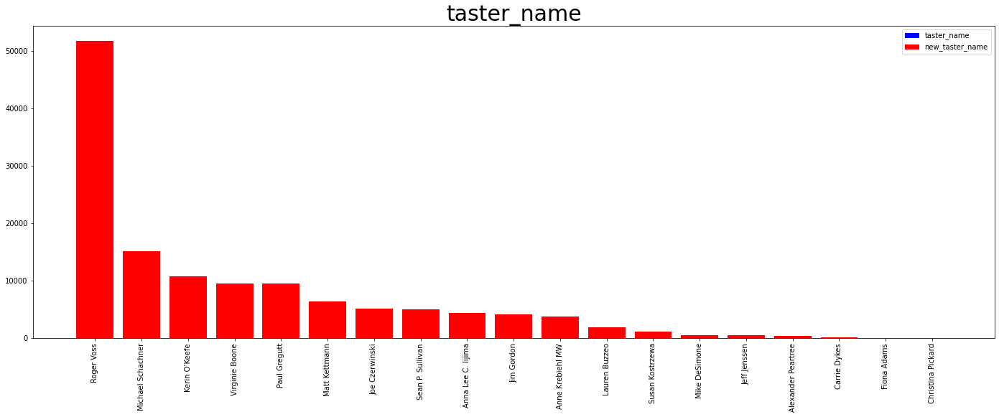

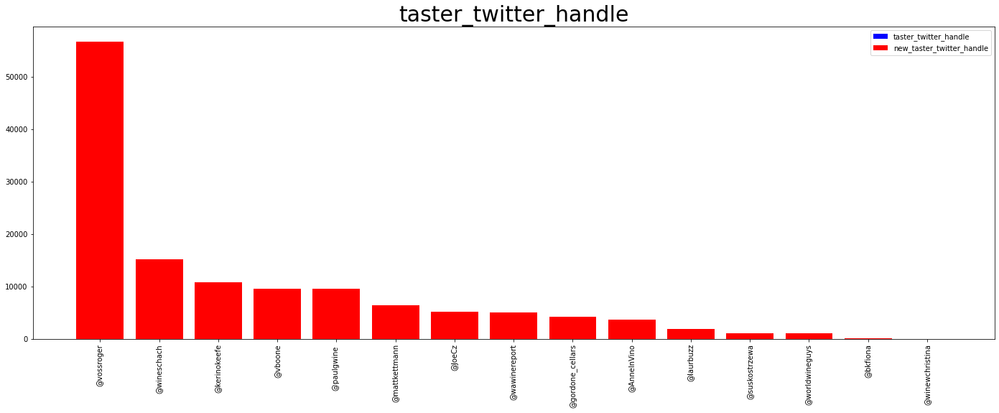

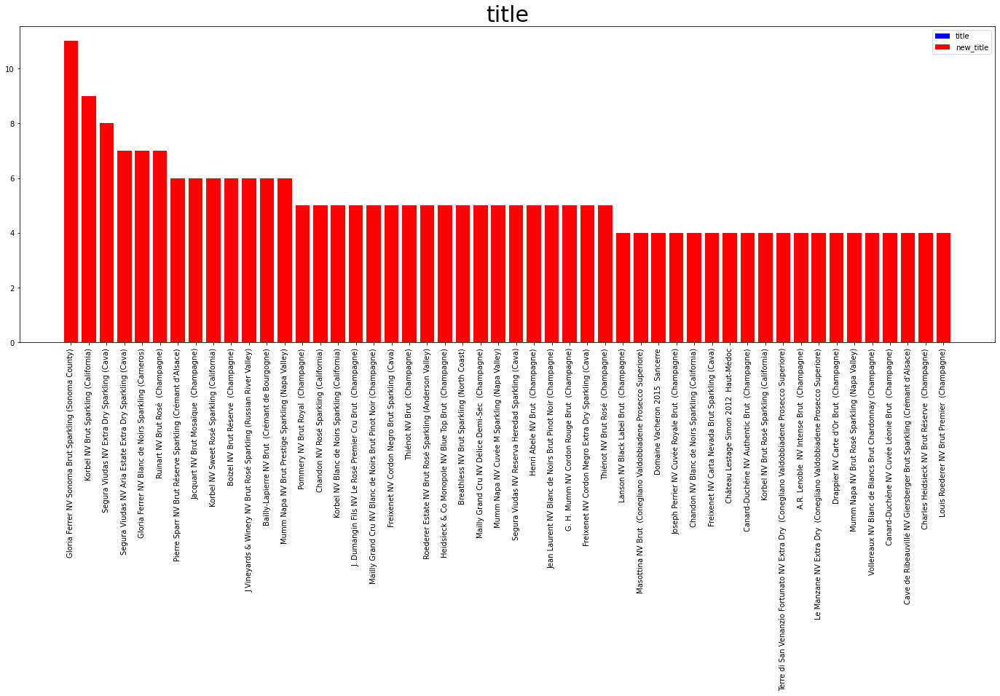

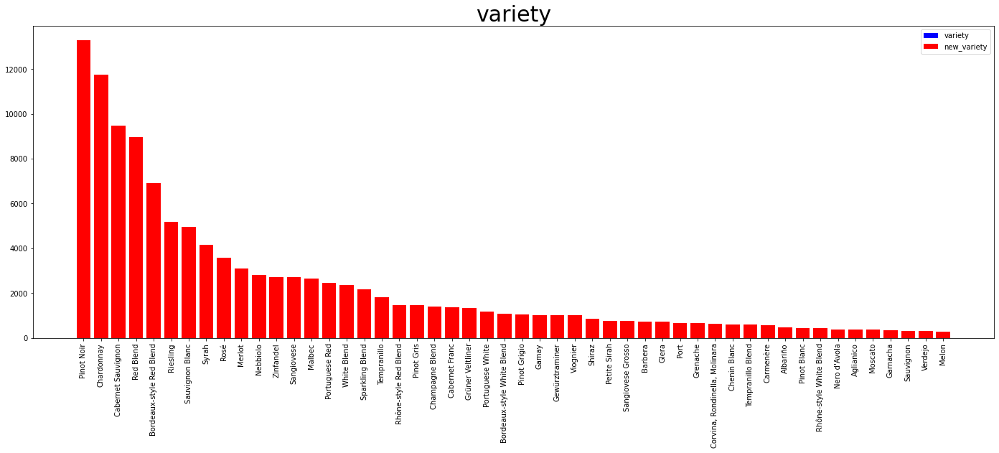

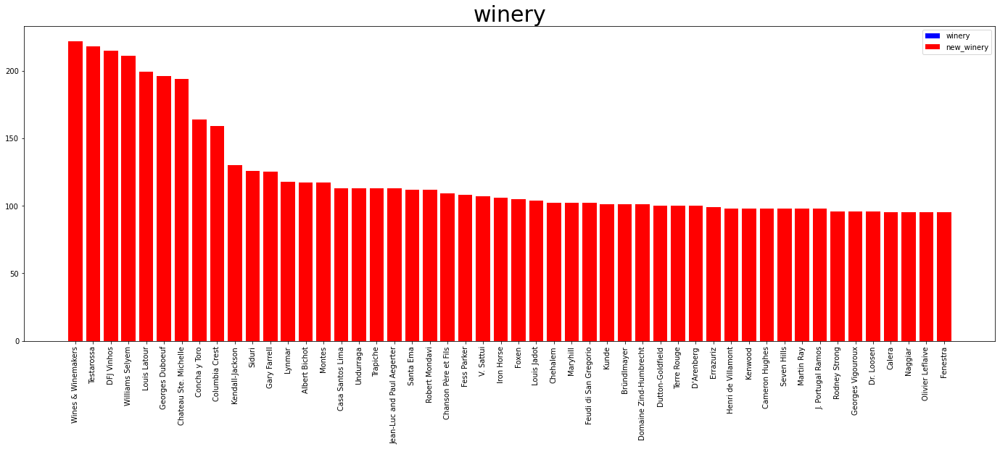

descriptive statistics (points):
Min: 80.0000	Q1(25%): 86.0000 	Q2(50%): 88.0000 	Q3(75%): 91.0000 	Max: 100.0000
Missing: 0

 new Min: 80.0000	Q1(25%): 86.0000 	Q2(50%): 88.0000 	Q3(75%): 91.0000 	Max: 100.0000 
 new Missing: 0 

descriptive statistics (price):
Min: 4.0000	Q1(25%): 17.0000 	Q2(50%): 25.0000 	Q3(75%): 42.0000 	Max: 3300.0000
Missing: 8996

 new Min: 4.0000	Q1(25%): 18.0000 	Q2(50%): 25.0000 	Q3(75%): 40.0000 	Max: 3300.0000 
 new Missing: 0 



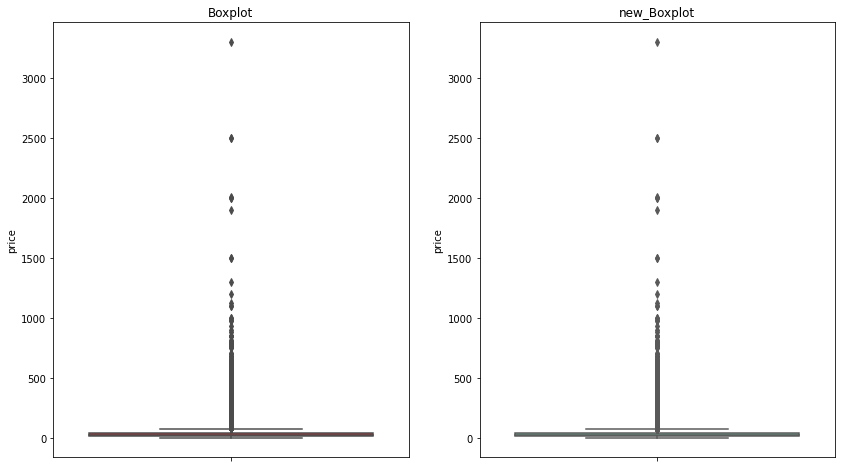

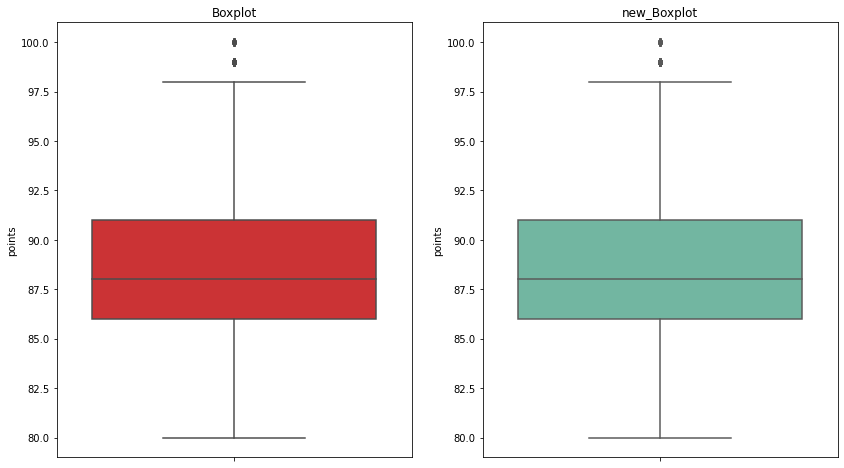

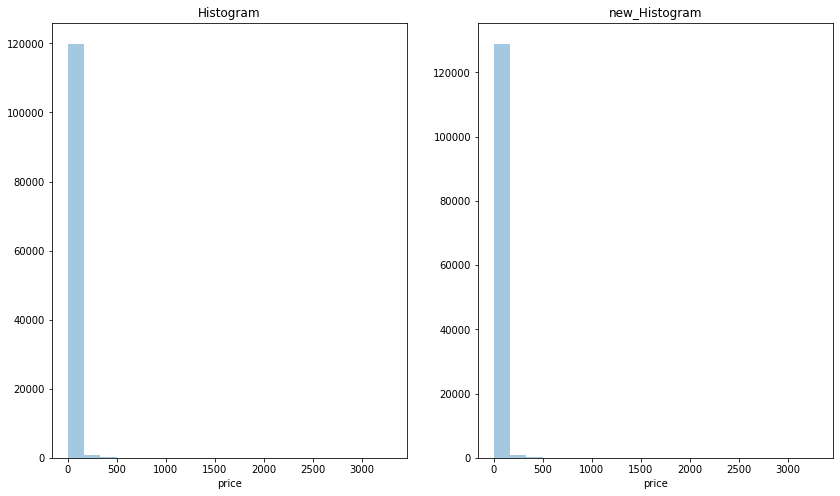

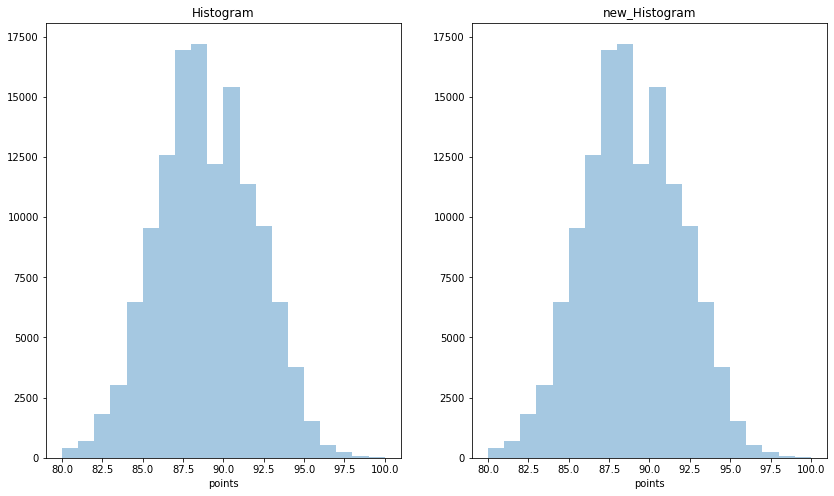

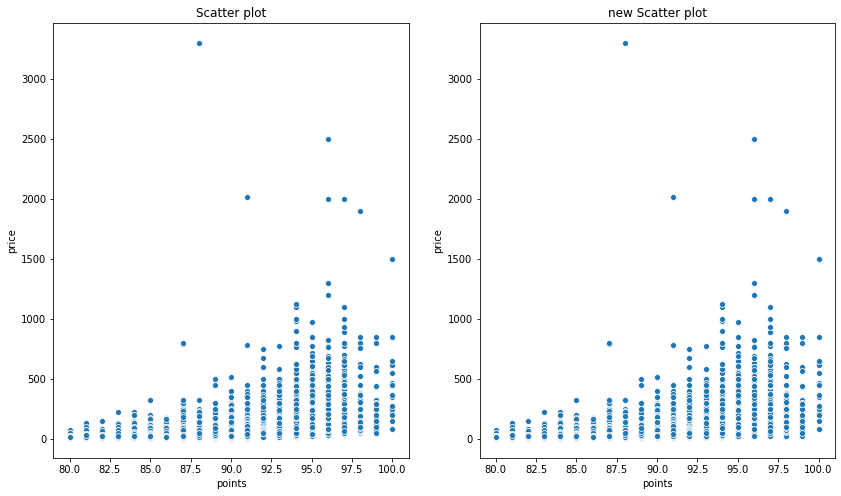

In [14]:
md130k=miss_mode_fill(winemag130k)
columns_info(winemag130k,show_shape=True,new_df=md130k)
nominal_summary(winemag130k,nominal_index=nominal_index,head_n=50,new_df=md130k)
numerical_summary(winemag130k,numerical_index=numerical_index,new_df=md130k)
viz_pairs(winemag130k,xlabel='points',ylabel='price',bins=20,new_df=md130k)

#### 3 通过属性的相关关系来填补缺失值

In [0]:
miss_index=['country','designation','price','province','region_1','region_2','taster_name','taster_twitter_handle','variety']
comp_index=['description','points','title','winery']
att130k=attr_corr_fill(winemag130k,miss_index=miss_index,complete_index=comp_index)
columns_info(winemag130k,show_shape=True,new_df=att130k)
nominal_summary(winemag130k,nominal_index=nominal_index,head_n=50,new_df=att130k)
numerical_summary(winemag130k,numerical_index=numerical_index,new_df=att130k)
viz_pairs(winemag130k,xlabel='points',ylabel='price',bins=20,new_df=att130k)

#### 4 通过数据对象之间的相似性来填补缺失值

In [27]:
obj130k=obj_corr_fill(winemag130k,numerical_index=numerical_index,k=10)
columns_info(winemag130k,show_shape=True,new_df=obj130k)
nominal_summary(winemag130k,nominal_index=nominal_index,head_n=50,new_df=obj130k)
numerical_summary(winemag130k,numerical_index=numerical_index,new_df=obj130k)
viz_pairs(winemag130k,xlabel='points',ylabel='price',bins=20,new_df=obj130k)

/usr/local/lib/python3.6/dist-packages/impyute/imputation/cs/fast_knn.py:113: RuntimeWarning: invalid value encountered in true_divide
  weights = distances/np.sum(distances)


KeyboardInterrupt: ignored

# 数据集2 - Consumer & Visitor Insights For Neighborhoods
Consumer Insights & Visitation Data At The Census Block Group Level
> cbg_patterns.csv Census Block Group Visitor Patterns & Consumer Insights.

## cbg_patterns.csv

In [0]:
cbg_patterns_dir = "."
cbg_patterns=pd.read_csv(cbg_patterns_dir+"/cbg_patterns.csv",sep=',',header='infer',index_col=None)

In [16]:
columns_info(cbg_patterns)

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 220735 entries, 0 to 220734
Data columns (total 13 columns):
 #   Column                    Non-Null Count   Dtype  
---  ------                    --------------   -----  
 0   census_block_group        220734 non-null  float64
 1   date_range_start          220735 non-null  int64  
 2   date_range_end            220735 non-null  int64  
 3   raw_visit_count           220629 non-null  float64
 4   raw_visitor_count         220629 non-null  float64
 5   visitor_home_cbgs         220735 non-null  object 
 6   visitor_work_cbgs         220735 non-null  object 
 7   distance_from_home        220518 non-null  float64
 8   related_same_day_brand    220735 non-null  object 
 9   related_same_month_brand  220735 non-null  object 
 10  top_brands                220735 non-null  object 
 11  popularity_by_hour        220735 non-null  object 
 12  popularity_by_day         220735 non-null  object 
dtypes: float64(4), int64(2), object(7)
memory us

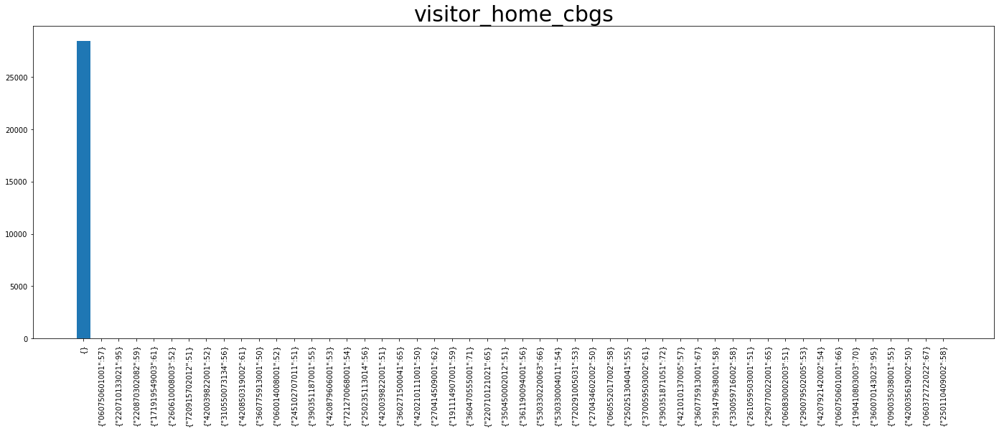

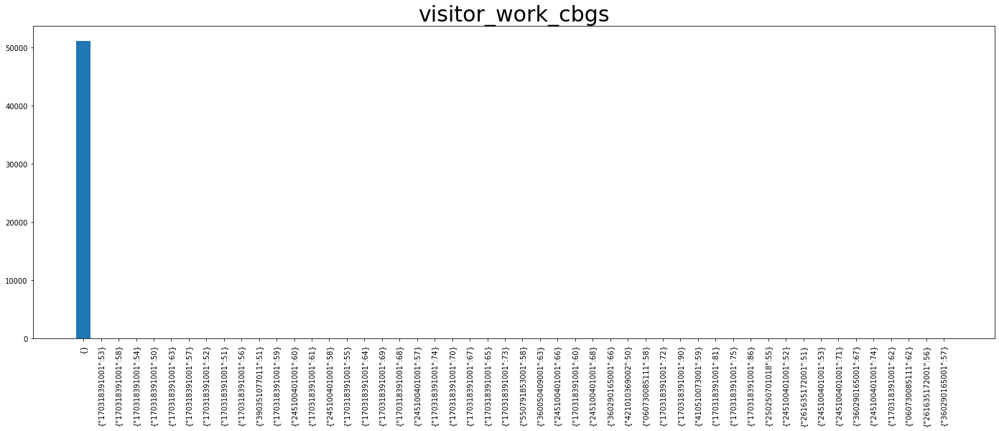

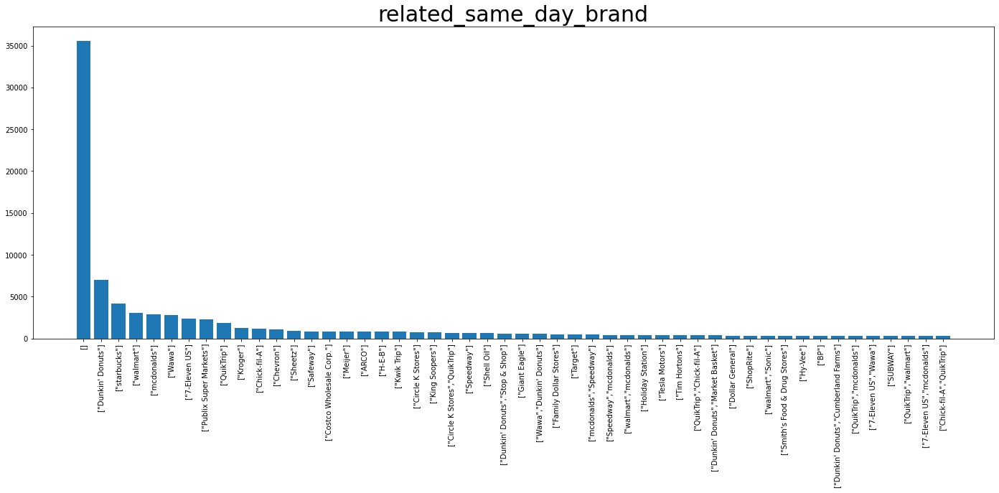

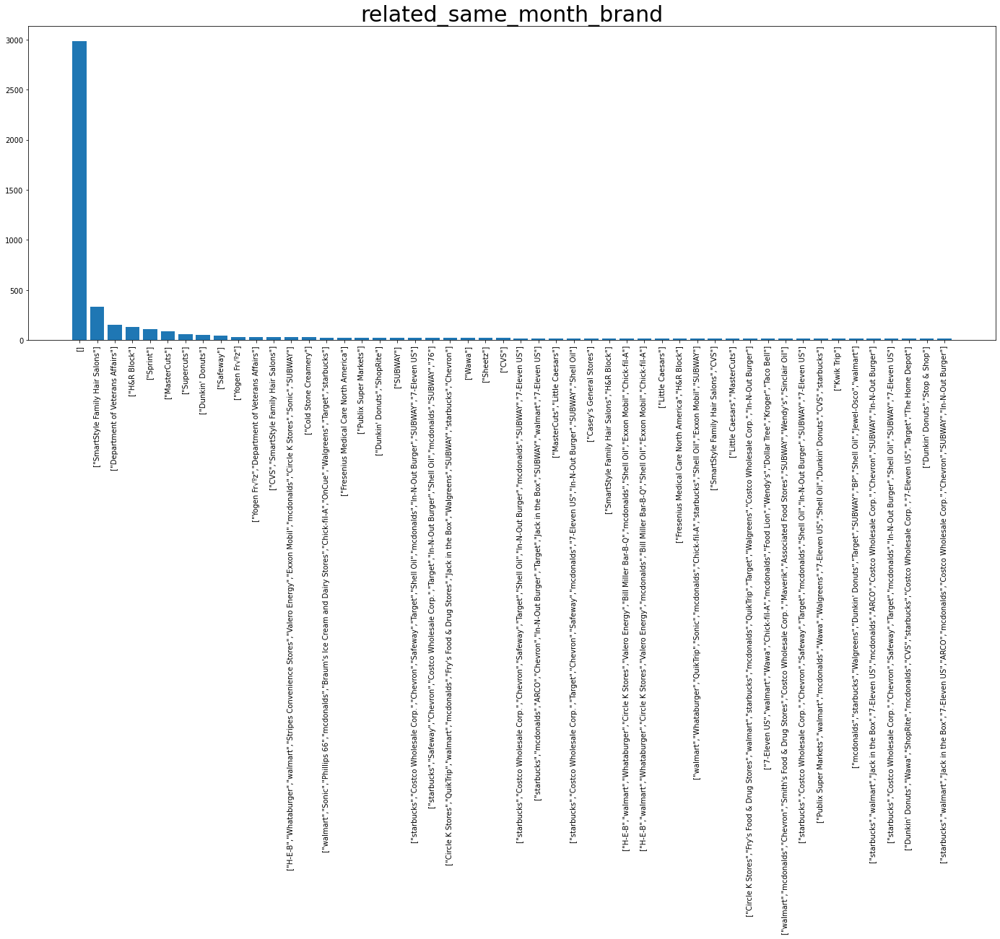

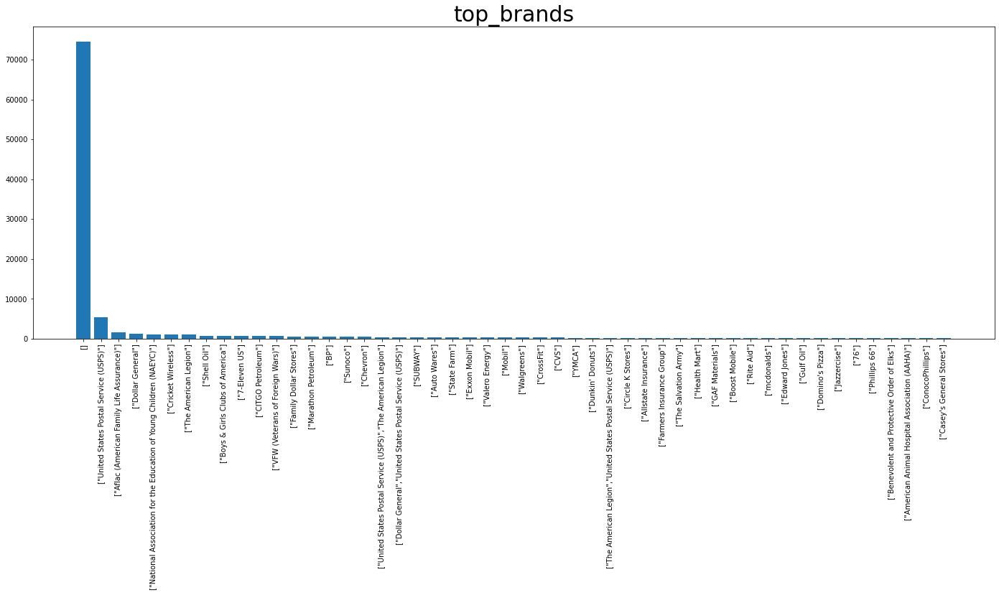

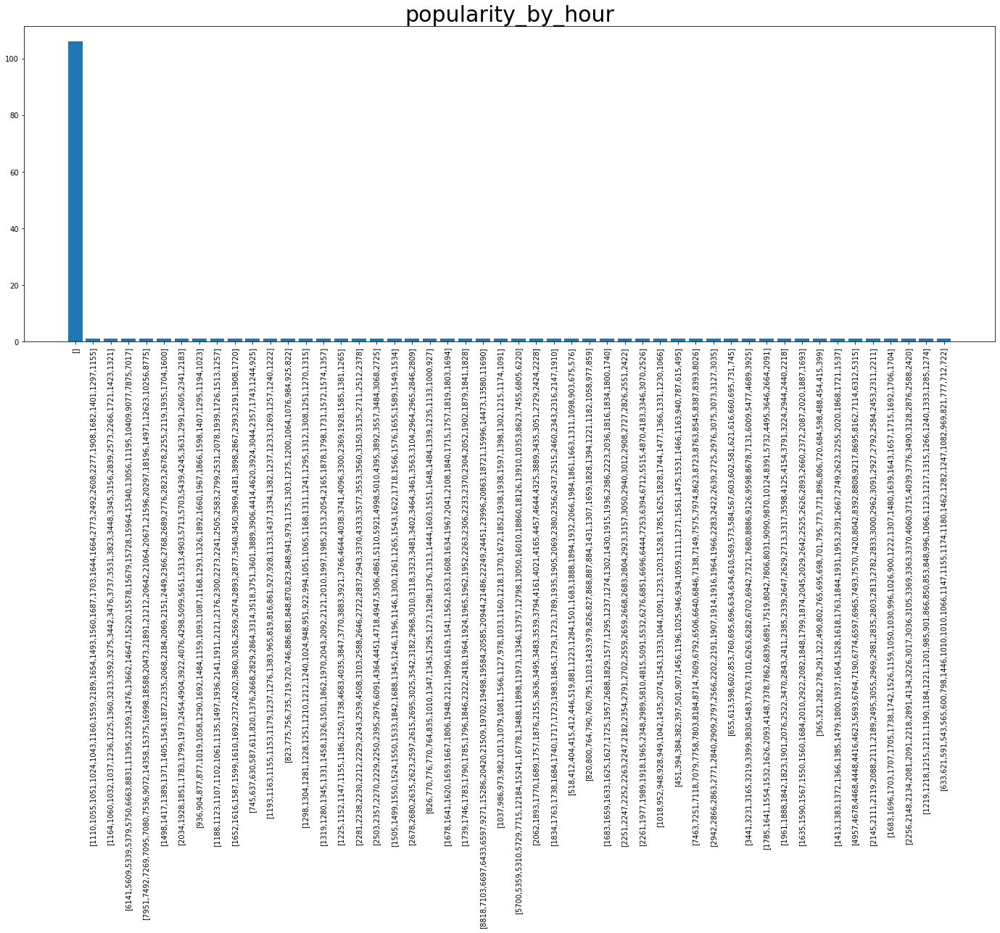

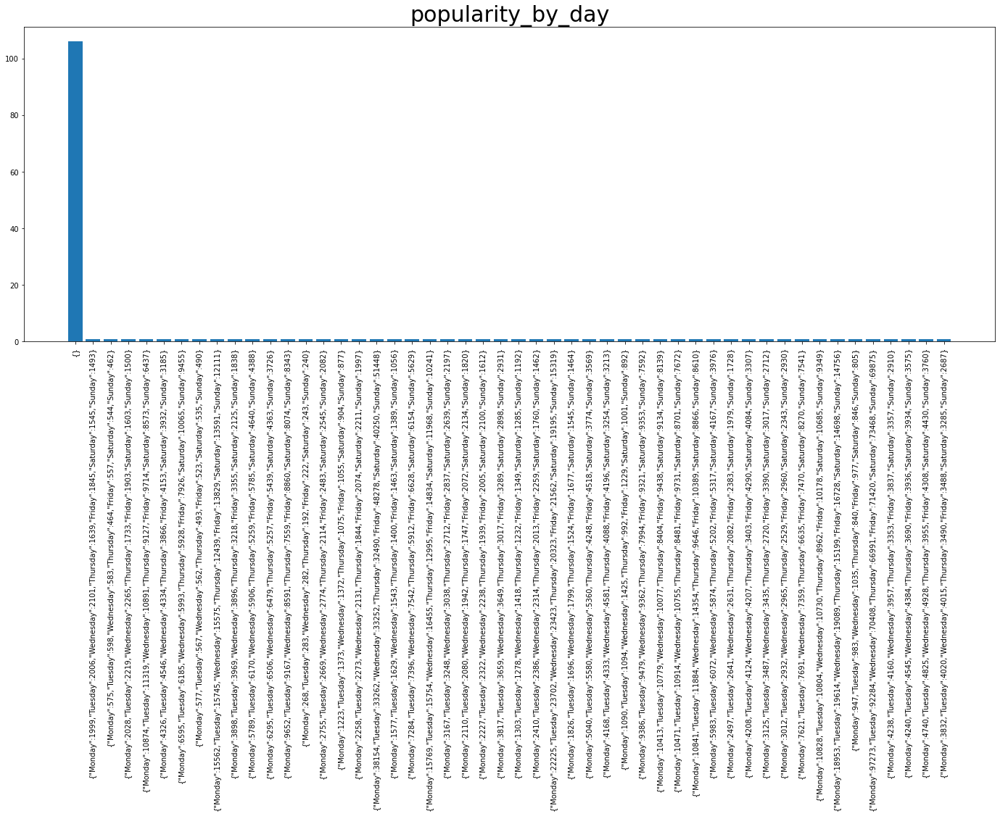

descriptive statistics (census_block_group):
Min: 10010201001.0000	Q1(25%): 131210116244.2500 	Q2(50%): 290190012013.5000 	Q3(75%): 420034897521.7500 	Max: 780309900000.0000
Missing: 1

descriptive statistics (date_range_start):
Min: 1538352000.0000	Q1(25%): 1538352000.0000 	Q2(50%): 1538352000.0000 	Q3(75%): 1538352000.0000 	Max: 1538352000.0000
Missing: 0

descriptive statistics (date_range_end):
Min: 1541030400.0000	Q1(25%): 1541030400.0000 	Q2(50%): 1541030400.0000 	Q3(75%): 1541030400.0000 	Max: 1541030400.0000
Missing: 0

descriptive statistics (raw_visit_count):
Min: 60.0000	Q1(25%): 17042.0000 	Q2(50%): 30640.0000 	Q3(75%): 56678.0000 	Max: 7179900.0000
Missing: 106

descriptive statistics (raw_visitor_count):
Min: 50.0000	Q1(25%): 3430.0000 	Q2(50%): 6541.0000 	Q3(75%): 13099.0000 	Max: 6113949.0000
Missing: 106

descriptive statistics (distance_from_home):
Min: 706.0000	Q1(25%): 8584.0000 	Q2(50%): 14614.0000 	Q3(75%): 31397.7500 	Max: 6297845.0000
Missing: 217



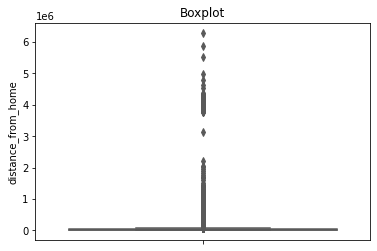

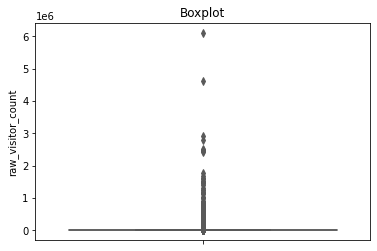

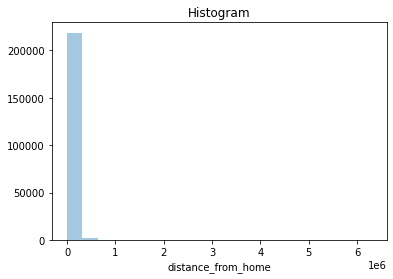

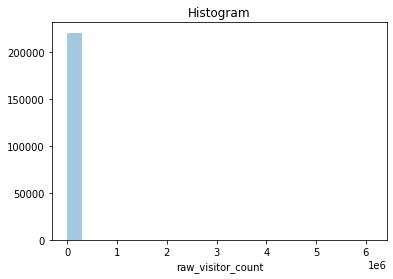

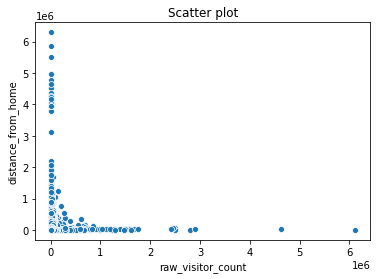

In [29]:
# Nominal index
nominal_index = ['visitor_home_cbgs','visitor_work_cbgs', 'related_same_day_brand', 'related_same_month_brand',
                 'top_brands', 'popularity_by_hour','popularity_by_day']
# Numerical index
numerical_index = ['census_block_group','date_range_start', 'date_range_end','raw_visit_count','raw_visitor_count','distance_from_home']
nominal_summary(cbg_patterns,nominal_index,head_n=50)
numerical_summary(cbg_patterns,numerical_index)
viz_pairs(cbg_patterns,xlabel=numerical_index[4],ylabel=numerical_index[5],bins=20,new_df=None)

### 缺失值处理与对比

#### 1 将缺失部分剔除

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 220735 entries, 0 to 220734
Data columns (total 13 columns):
 #   Column                    Non-Null Count   Dtype  
---  ------                    --------------   -----  
 0   census_block_group        220734 non-null  float64
 1   date_range_start          220735 non-null  int64  
 2   date_range_end            220735 non-null  int64  
 3   raw_visit_count           220629 non-null  float64
 4   raw_visitor_count         220629 non-null  float64
 5   visitor_home_cbgs         220735 non-null  object 
 6   visitor_work_cbgs         220735 non-null  object 
 7   distance_from_home        220518 non-null  float64
 8   related_same_day_brand    220735 non-null  object 
 9   related_same_month_brand  220735 non-null  object 
 10  top_brands                220735 non-null  object 
 11  popularity_by_hour        220735 non-null  object 
 12  popularity_by_day         220735 non-null  object 
dtypes: float64(4), int64(2), object(7)
memory us

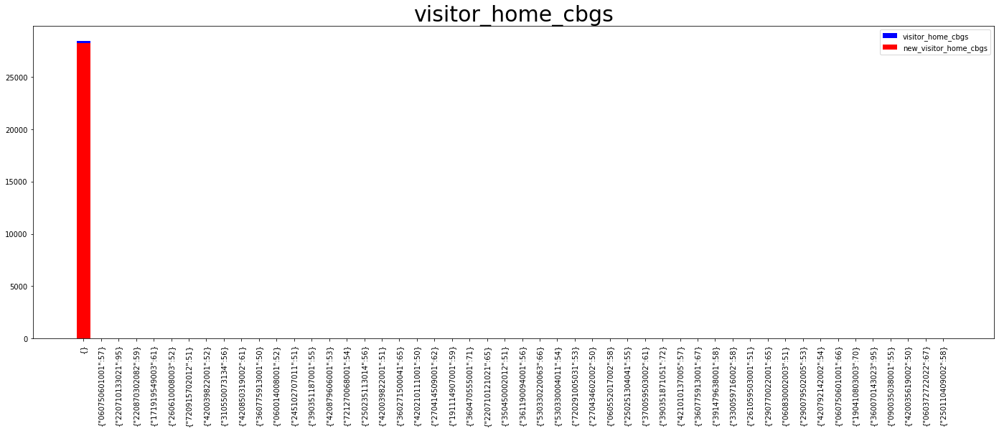

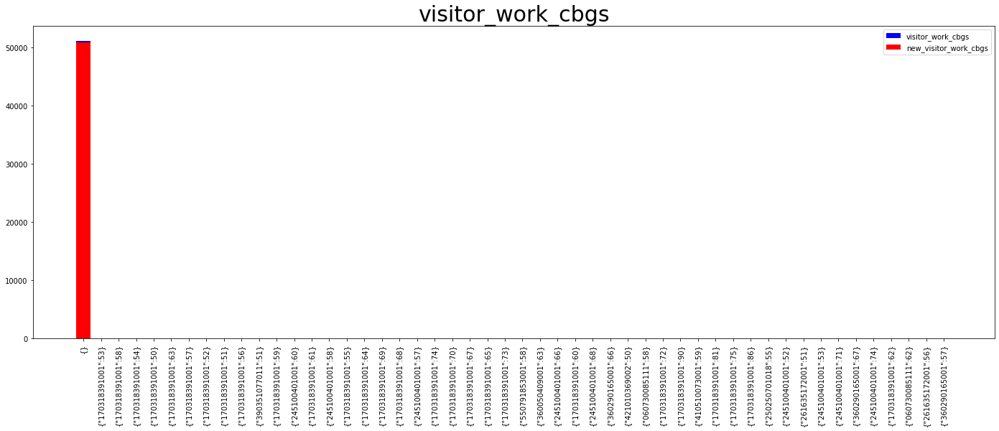

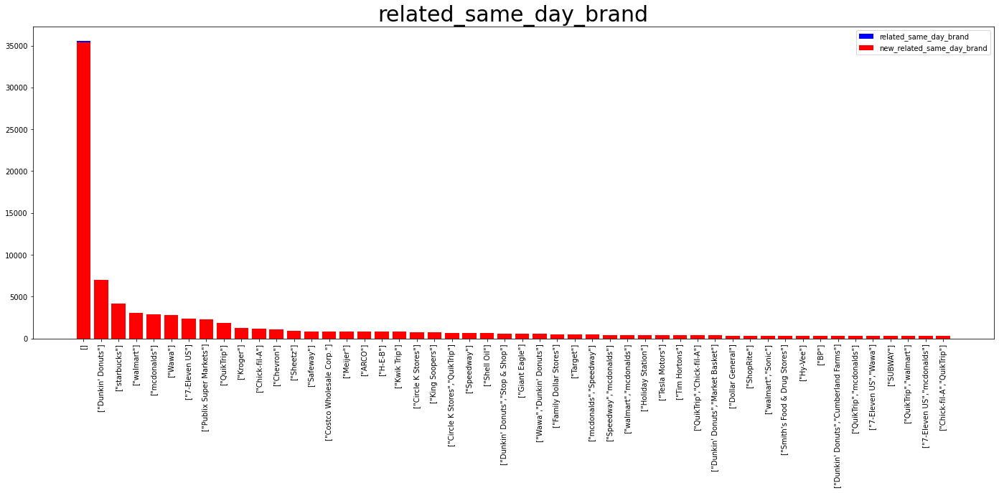

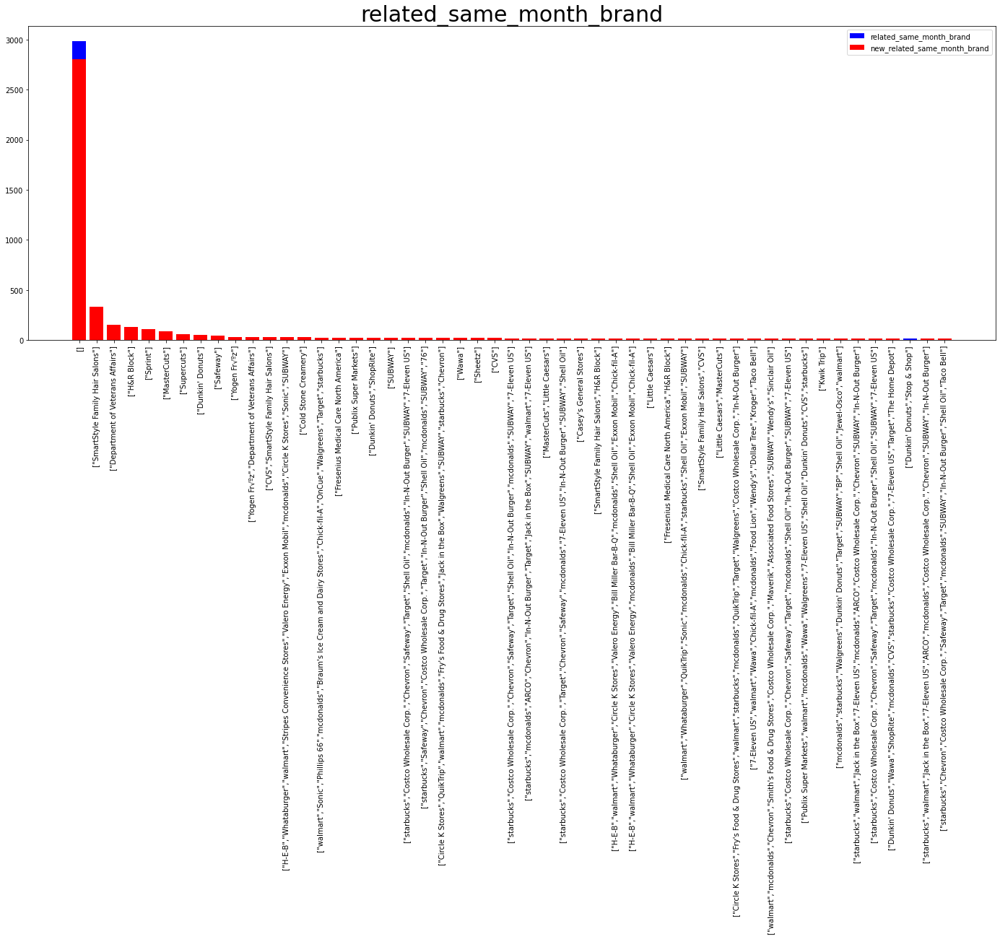

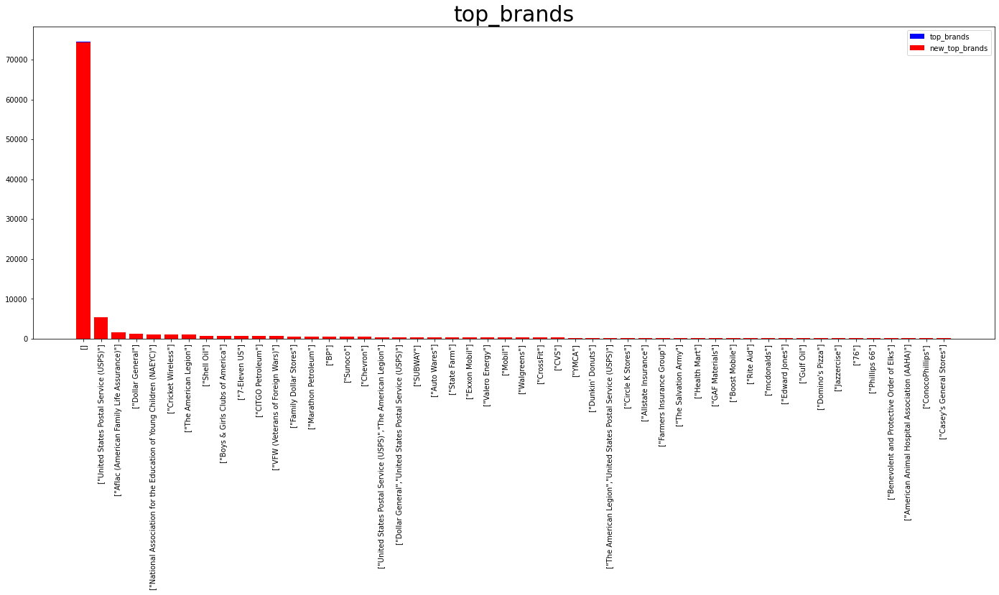

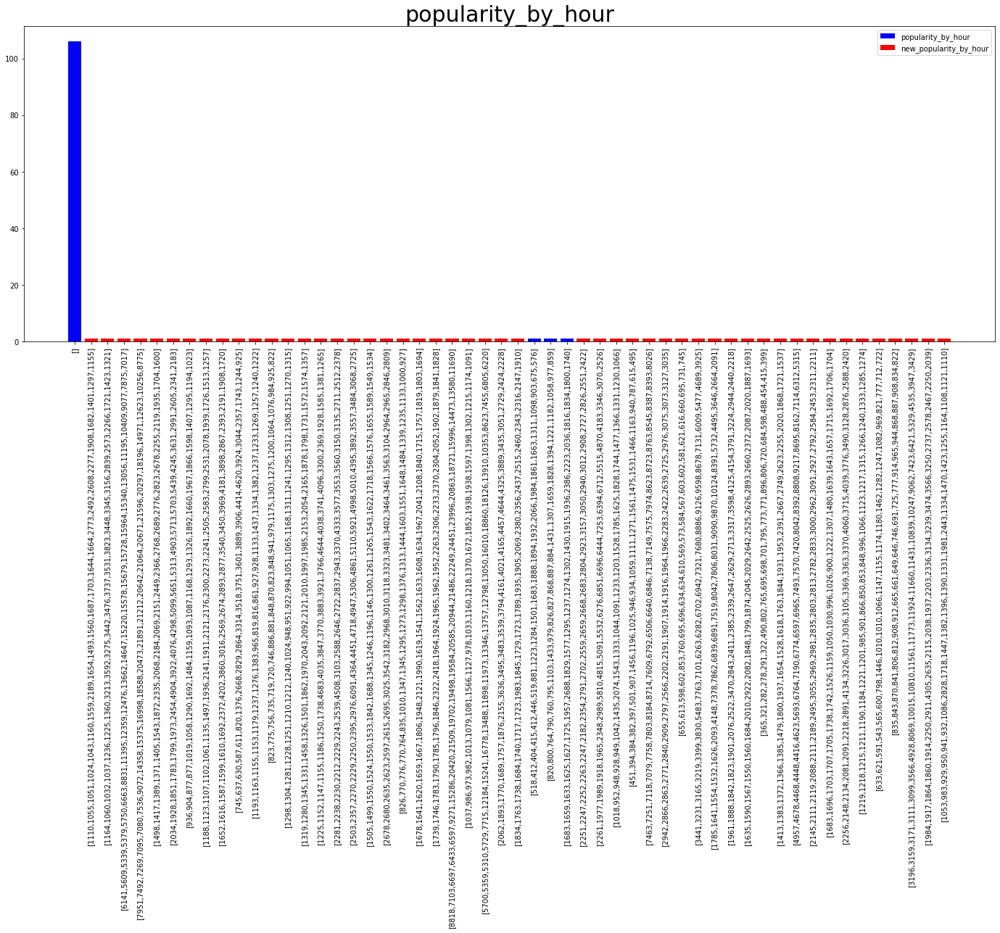

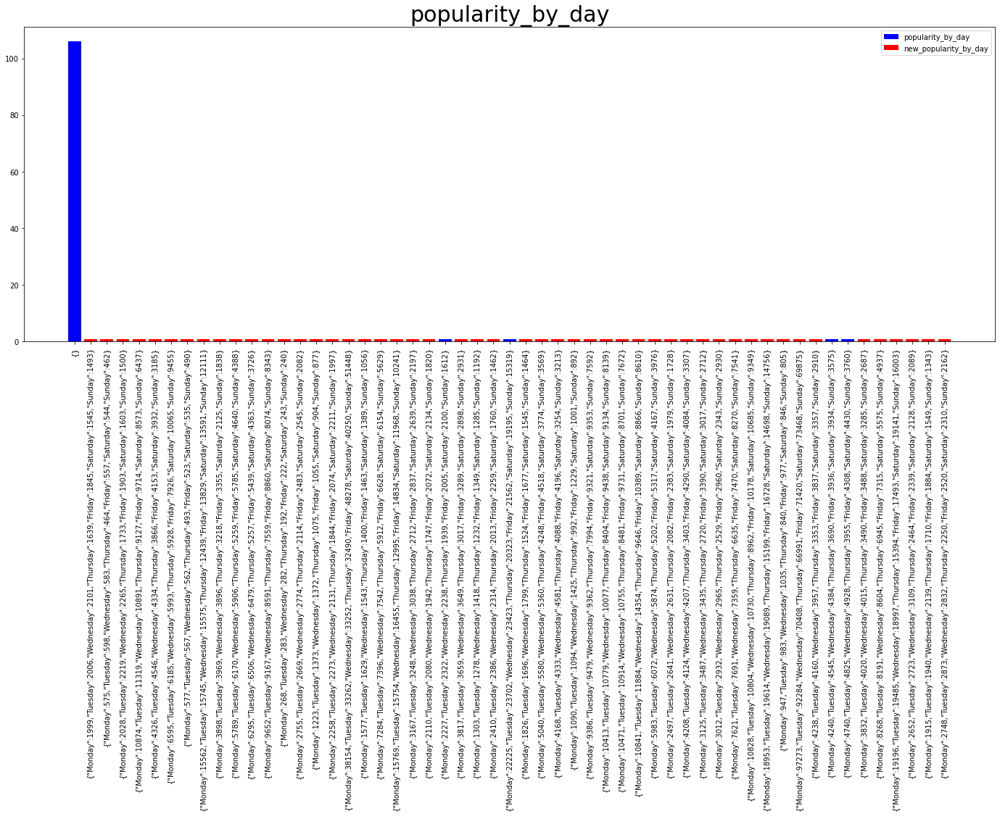

descriptive statistics (census_block_group):
Min: 10010201001.0000	Q1(25%): 131210116244.2500 	Q2(50%): 290190012013.5000 	Q3(75%): 420034897521.7500 	Max: 780309900000.0000
Missing: 1

 new Min: 10010201001.0000	Q1(25%): 131210116233.2500 	Q2(50%): 290190007002.5000 	Q3(75%): 420034810001.7500 	Max: 780309900000.0000 
 new Missing: 217 

descriptive statistics (date_range_start):
Min: 1538352000.0000	Q1(25%): 1538352000.0000 	Q2(50%): 1538352000.0000 	Q3(75%): 1538352000.0000 	Max: 1538352000.0000
Missing: 0

 new Min: 1538352000.0000	Q1(25%): 1538352000.0000 	Q2(50%): 1538352000.0000 	Q3(75%): 1538352000.0000 	Max: 1538352000.0000 
 new Missing: 217 

descriptive statistics (date_range_end):
Min: 1541030400.0000	Q1(25%): 1541030400.0000 	Q2(50%): 1541030400.0000 	Q3(75%): 1541030400.0000 	Max: 1541030400.0000
Missing: 0

 new Min: 1541030400.0000	Q1(25%): 1541030400.0000 	Q2(50%): 1541030400.0000 	Q3(75%): 1541030400.0000 	Max: 1541030400.0000 
 new Missing: 217 

descriptive statist

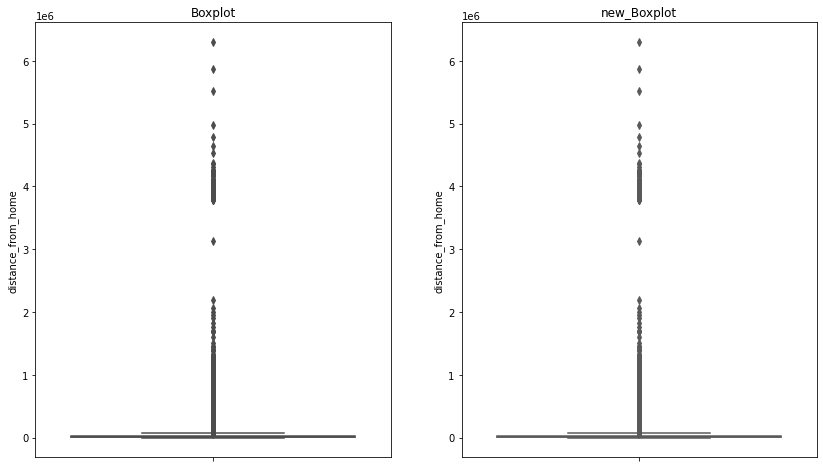

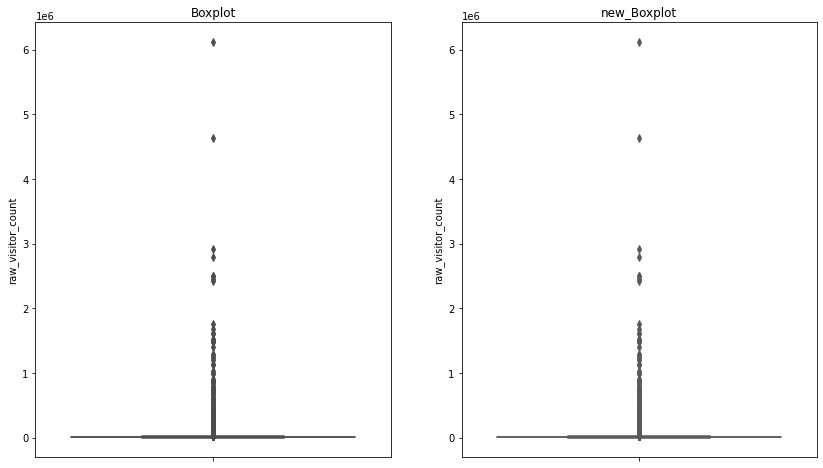

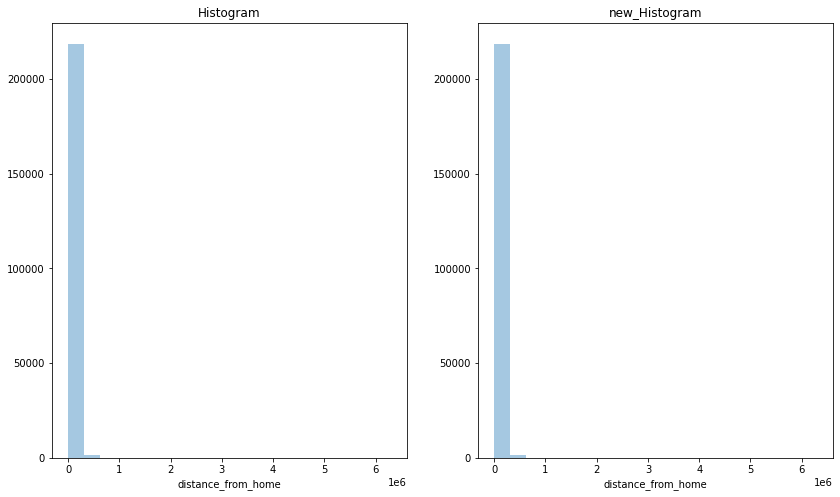

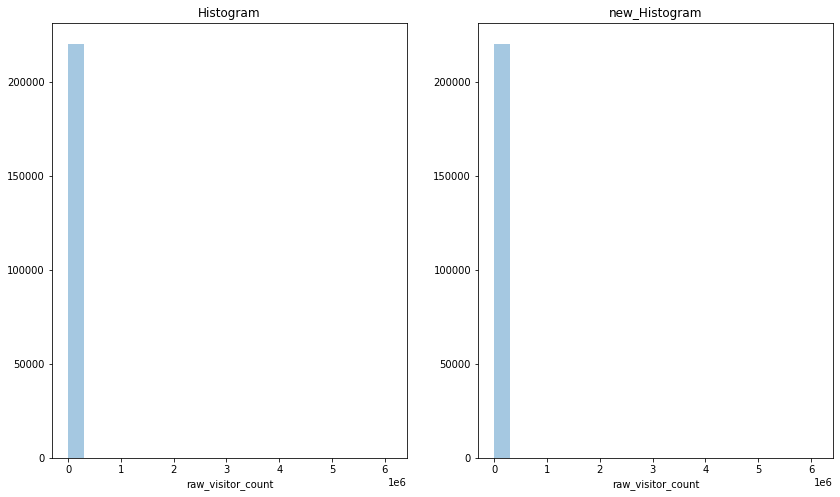

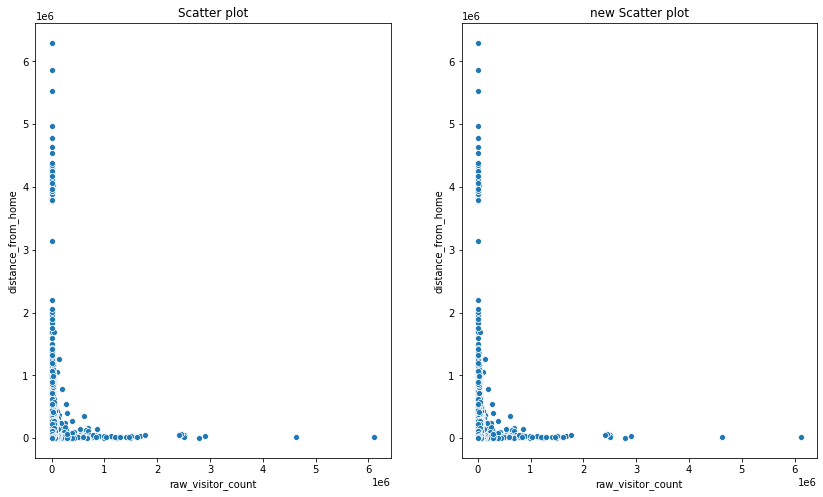

In [20]:
dwcbg=miss_drop(cbg_patterns)
columns_info(cbg_patterns,show_shape=True,new_df=dwcbg)
nominal_summary(cbg_patterns,nominal_index=nominal_index,head_n=50,new_df=dwcbg)
numerical_summary(cbg_patterns,numerical_index=numerical_index,new_df=dwcbg)
viz_pairs(cbg_patterns,xlabel=numerical_index[4],ylabel=numerical_index[5],bins=20,new_df=dwcbg)

#### 2 用最高频率值来填补缺失值

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 220735 entries, 0 to 220734
Data columns (total 13 columns):
 #   Column                    Non-Null Count   Dtype  
---  ------                    --------------   -----  
 0   census_block_group        220734 non-null  float64
 1   date_range_start          220735 non-null  int64  
 2   date_range_end            220735 non-null  int64  
 3   raw_visit_count           220629 non-null  float64
 4   raw_visitor_count         220629 non-null  float64
 5   visitor_home_cbgs         220735 non-null  object 
 6   visitor_work_cbgs         220735 non-null  object 
 7   distance_from_home        220518 non-null  float64
 8   related_same_day_brand    220735 non-null  object 
 9   related_same_month_brand  220735 non-null  object 
 10  top_brands                220735 non-null  object 
 11  popularity_by_hour        220735 non-null  object 
 12  popularity_by_day         220735 non-null  object 
dtypes: float64(4), int64(2), object(7)
memory us

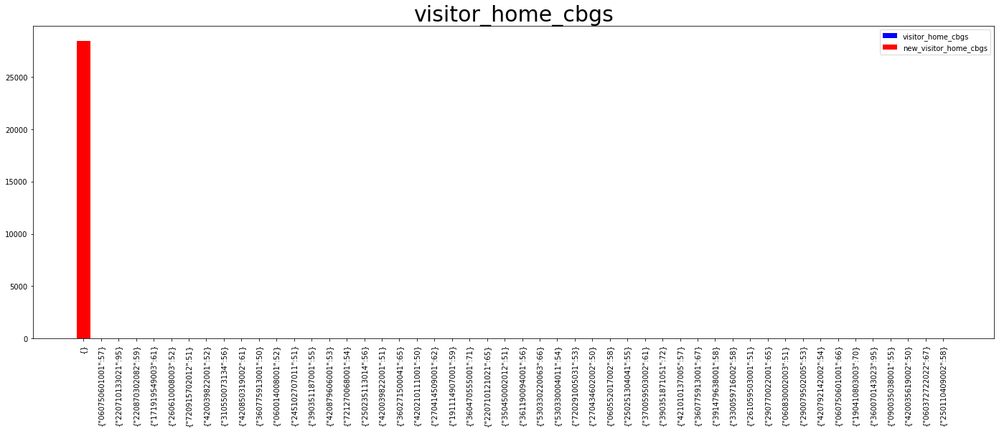

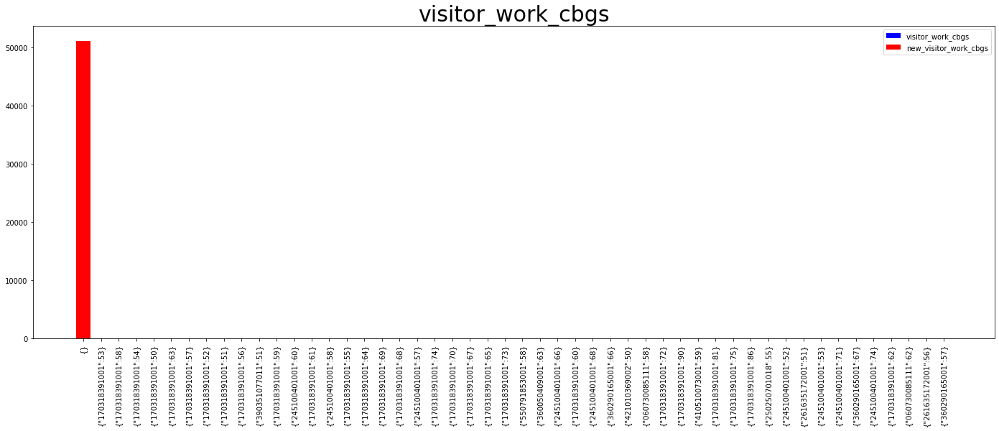

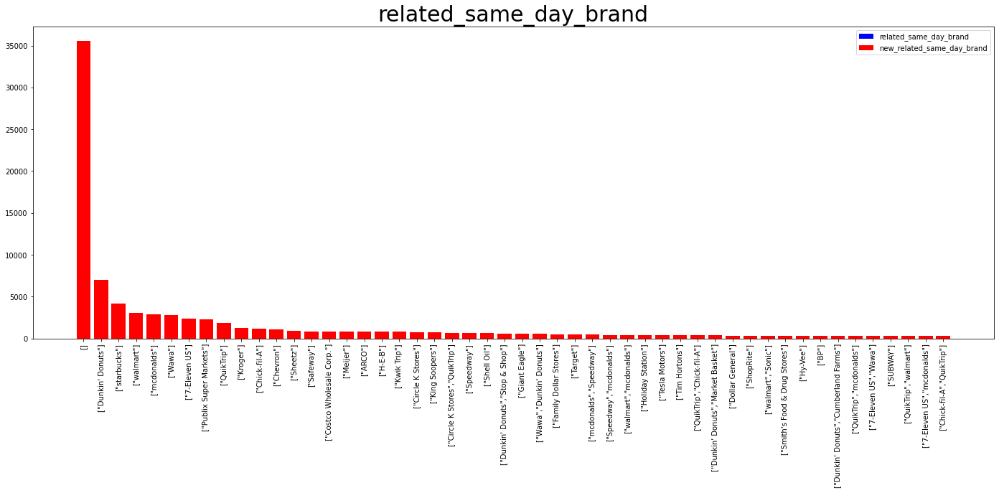

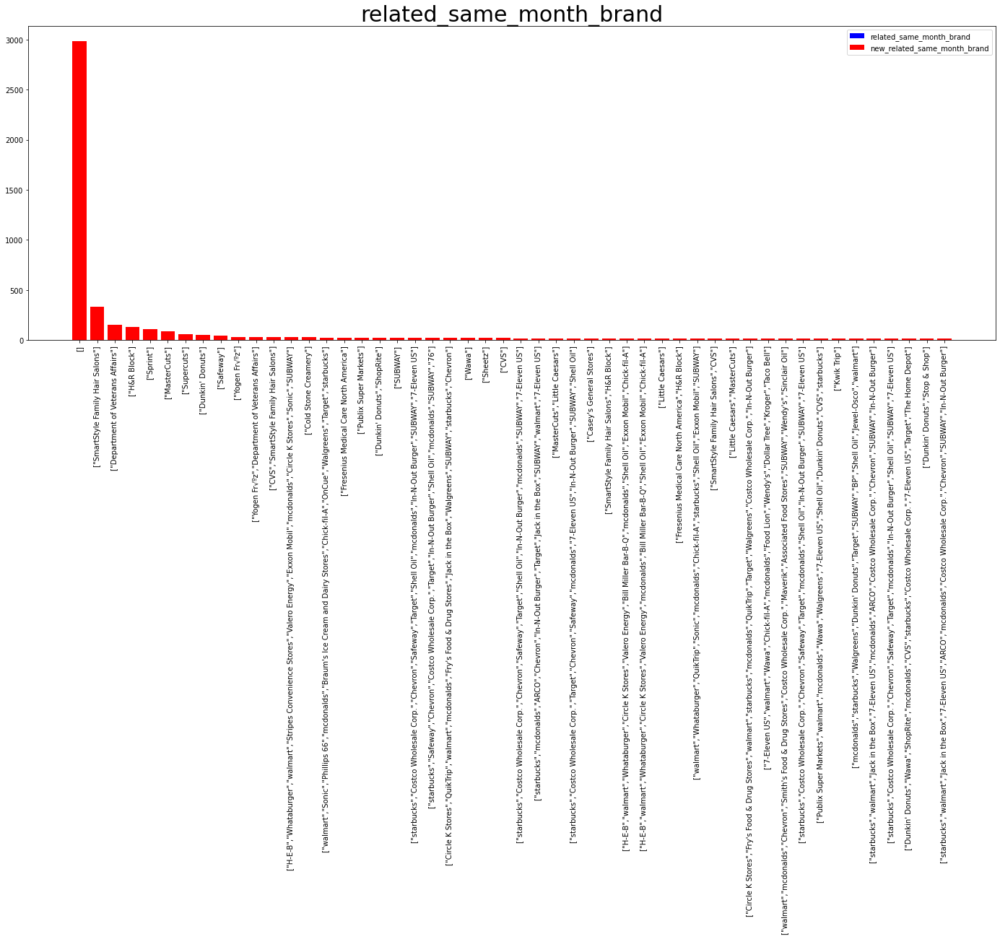

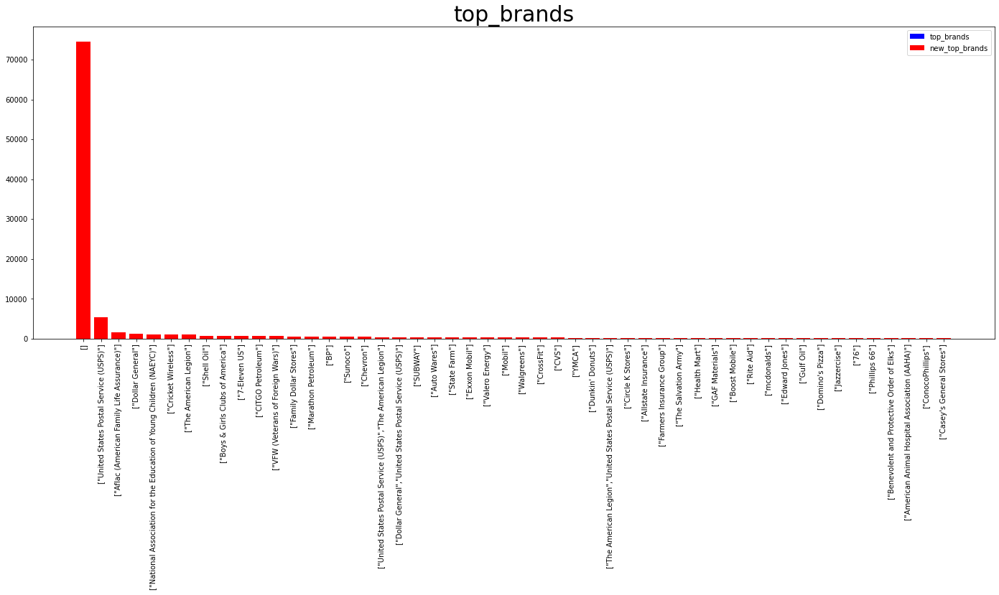

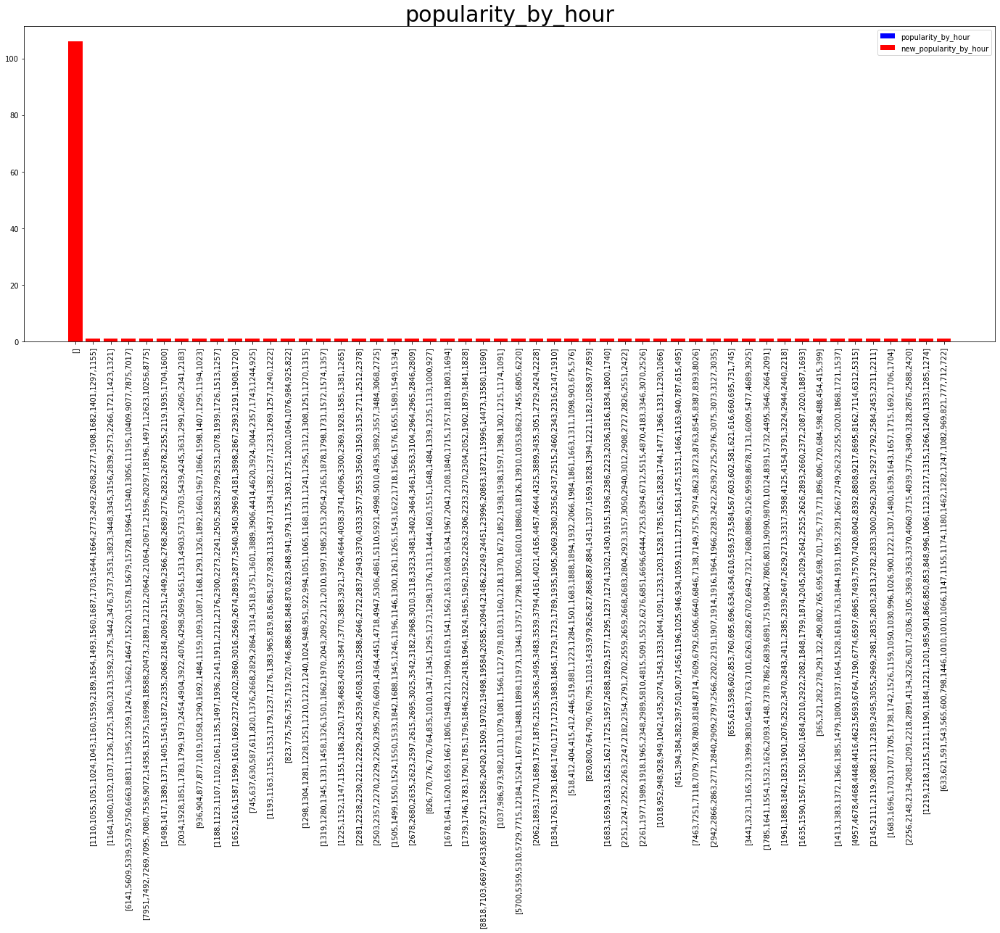

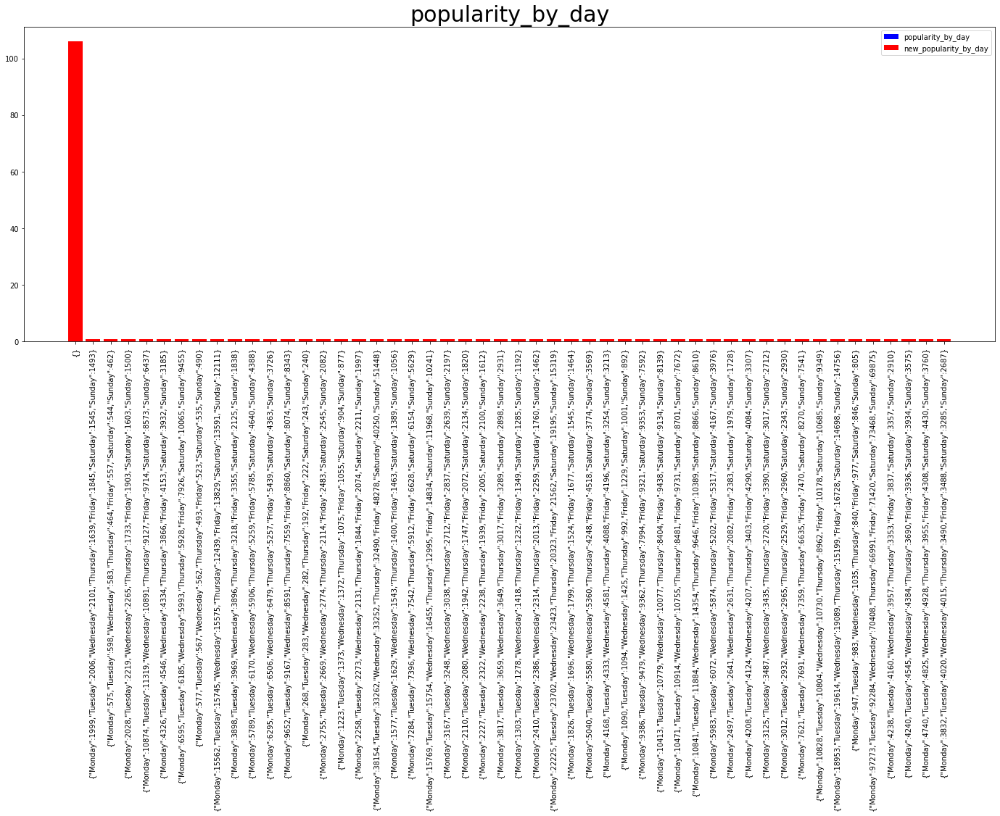

descriptive statistics (census_block_group):
Min: 10010201001.0000	Q1(25%): 131210116244.2500 	Q2(50%): 290190012013.5000 	Q3(75%): 420034897521.7500 	Max: 780309900000.0000
Missing: 1

 new Min: 10010201001.0000	Q1(25%): 131210116241.5000 	Q2(50%): 290190012013.0000 	Q3(75%): 420034895022.5000 	Max: 780309900000.0000 
 new Missing: 0 

descriptive statistics (date_range_start):
Min: 1538352000.0000	Q1(25%): 1538352000.0000 	Q2(50%): 1538352000.0000 	Q3(75%): 1538352000.0000 	Max: 1538352000.0000
Missing: 0

 new Min: 1538352000.0000	Q1(25%): 1538352000.0000 	Q2(50%): 1538352000.0000 	Q3(75%): 1538352000.0000 	Max: 1538352000.0000 
 new Missing: 0 

descriptive statistics (date_range_end):
Min: 1541030400.0000	Q1(25%): 1541030400.0000 	Q2(50%): 1541030400.0000 	Q3(75%): 1541030400.0000 	Max: 1541030400.0000
Missing: 0

 new Min: 1541030400.0000	Q1(25%): 1541030400.0000 	Q2(50%): 1541030400.0000 	Q3(75%): 1541030400.0000 	Max: 1541030400.0000 
 new Missing: 0 

descriptive statistics (r

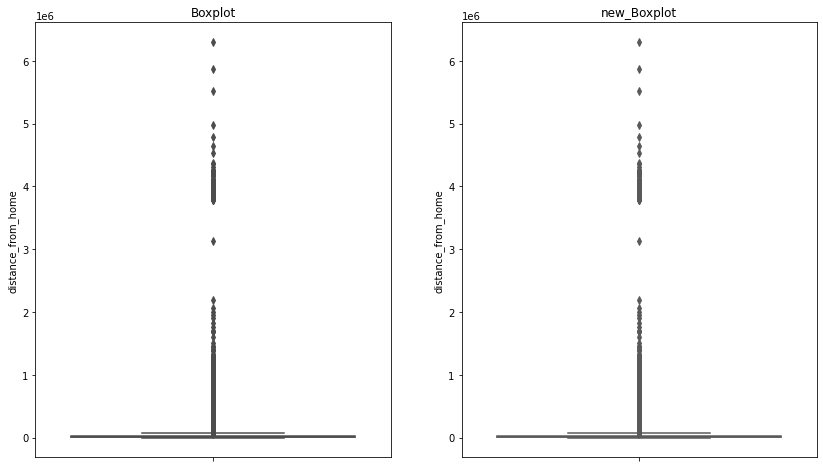

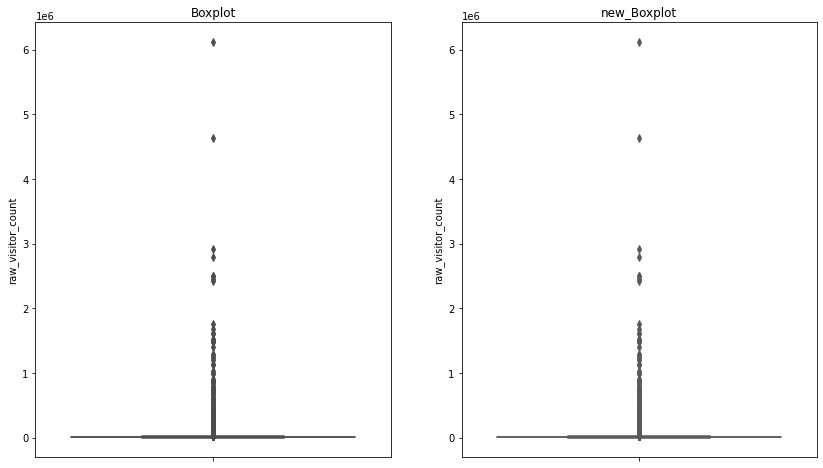

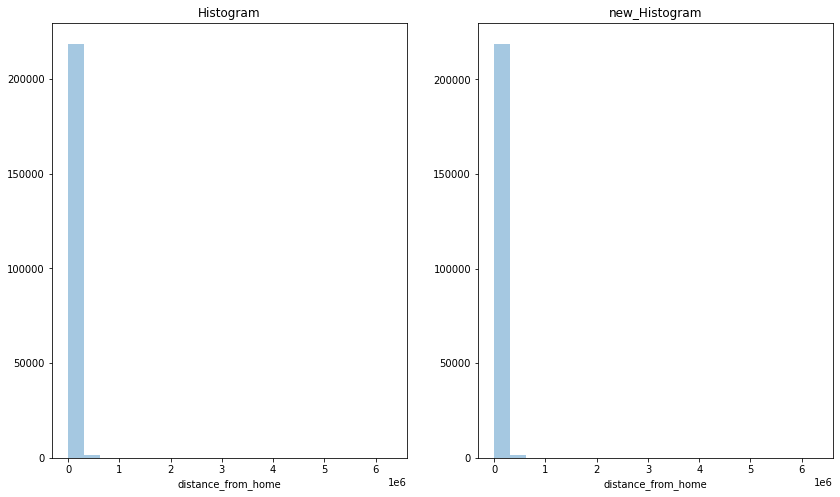

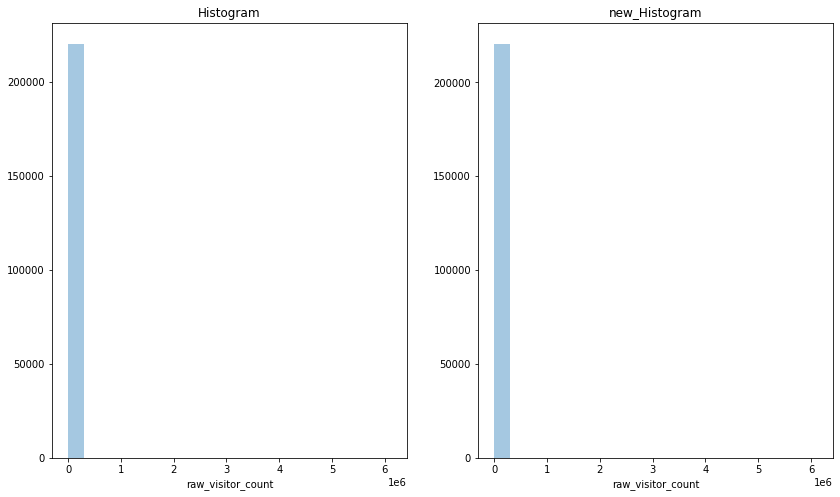

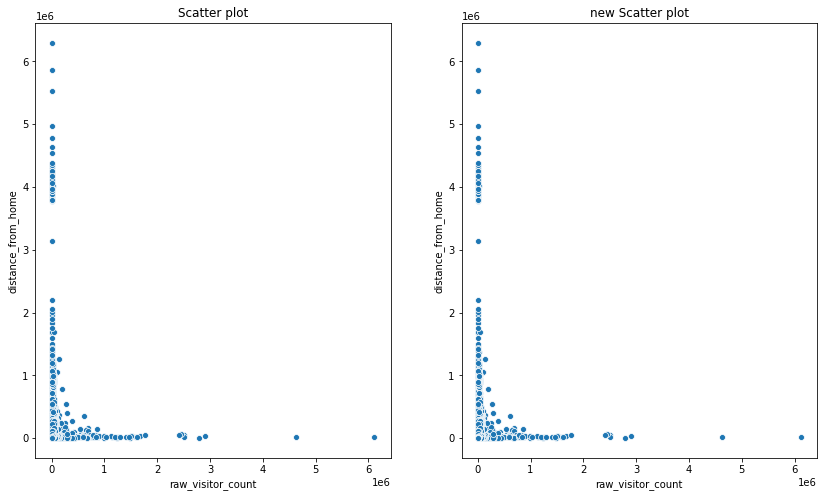

In [21]:
mdcbg=miss_mode_fill(cbg_patterns)
columns_info(cbg_patterns,show_shape=True,new_df=mdcbg)
nominal_summary(cbg_patterns,nominal_index=nominal_index,head_n=50,new_df=mdcbg)
numerical_summary(cbg_patterns,numerical_index=numerical_index,new_df=mdcbg)
viz_pairs(cbg_patterns,xlabel=numerical_index[4],ylabel=numerical_index[5],bins=20,new_df=mdcbg)

#### 3 通过属性的相关关系来填补缺失值

In [0]:
miss_index=['census_block_group','raw_visit_count','raw_visitor_count','distance_from_home']
comp_index=['visitor_home_cbgs','visitor_work_cbgs', 'related_same_day_brand', 'related_same_month_brand',
                 'top_brands', 'popularity_by_hour','popularity_by_day']
attcbg=attr_corr_fill(cbg_patterns,miss_index=miss_index,complete_index=comp_index)
columns_info(cbg_patterns,show_shape=True,new_df=attcbg)
nominal_summary(cbg_patterns,nominal_index=nominal_index,head_n=50,new_df=attcbg)
numerical_summary(cbg_patterns,numerical_index=numerical_index,new_df=attcbg)
viz_pairs(cbg_patterns,xlabel=numerical_index[4],ylabel=numerical_index[5],bins=20,new_df=attcbg)

#### 4 通过数据对象之间的相似性来填补缺失值

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 220735 entries, 0 to 220734
Data columns (total 13 columns):
 #   Column                    Non-Null Count   Dtype  
---  ------                    --------------   -----  
 0   census_block_group        220734 non-null  float64
 1   date_range_start          220735 non-null  int64  
 2   date_range_end            220735 non-null  int64  
 3   raw_visit_count           220629 non-null  float64
 4   raw_visitor_count         220629 non-null  float64
 5   visitor_home_cbgs         220735 non-null  object 
 6   visitor_work_cbgs         220735 non-null  object 
 7   distance_from_home        220518 non-null  float64
 8   related_same_day_brand    220735 non-null  object 
 9   related_same_month_brand  220735 non-null  object 
 10  top_brands                220735 non-null  object 
 11  popularity_by_hour        220735 non-null  object 
 12  popularity_by_day         220735 non-null  object 
dtypes: float64(4), int64(2), object(7)
memory us

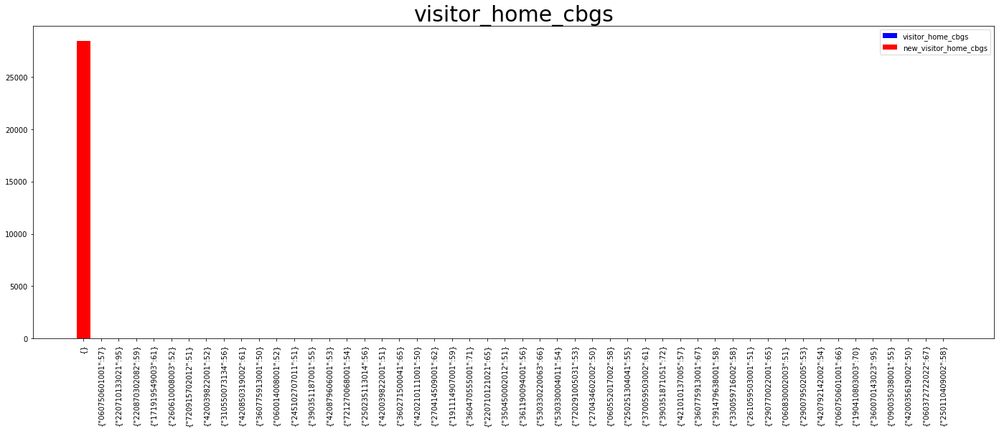

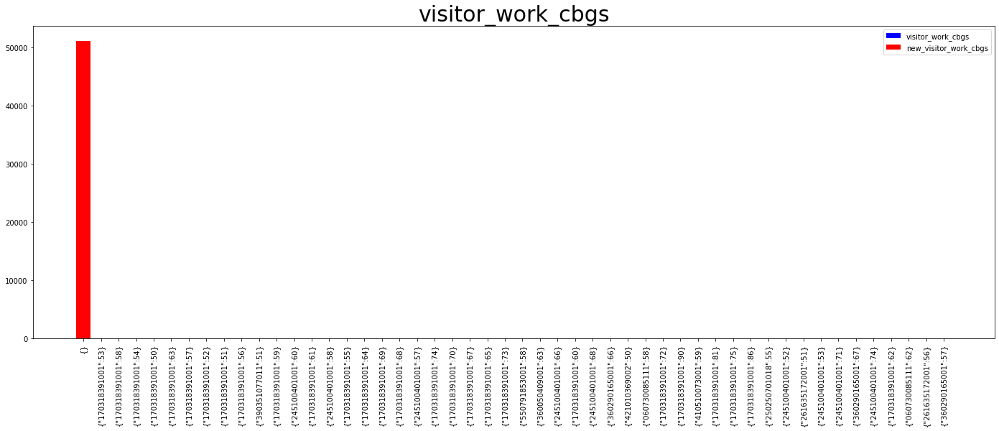

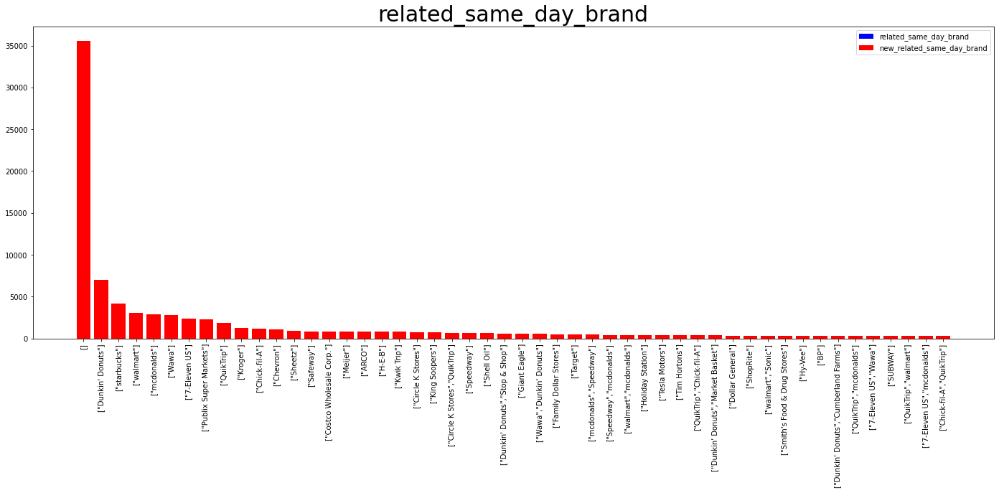

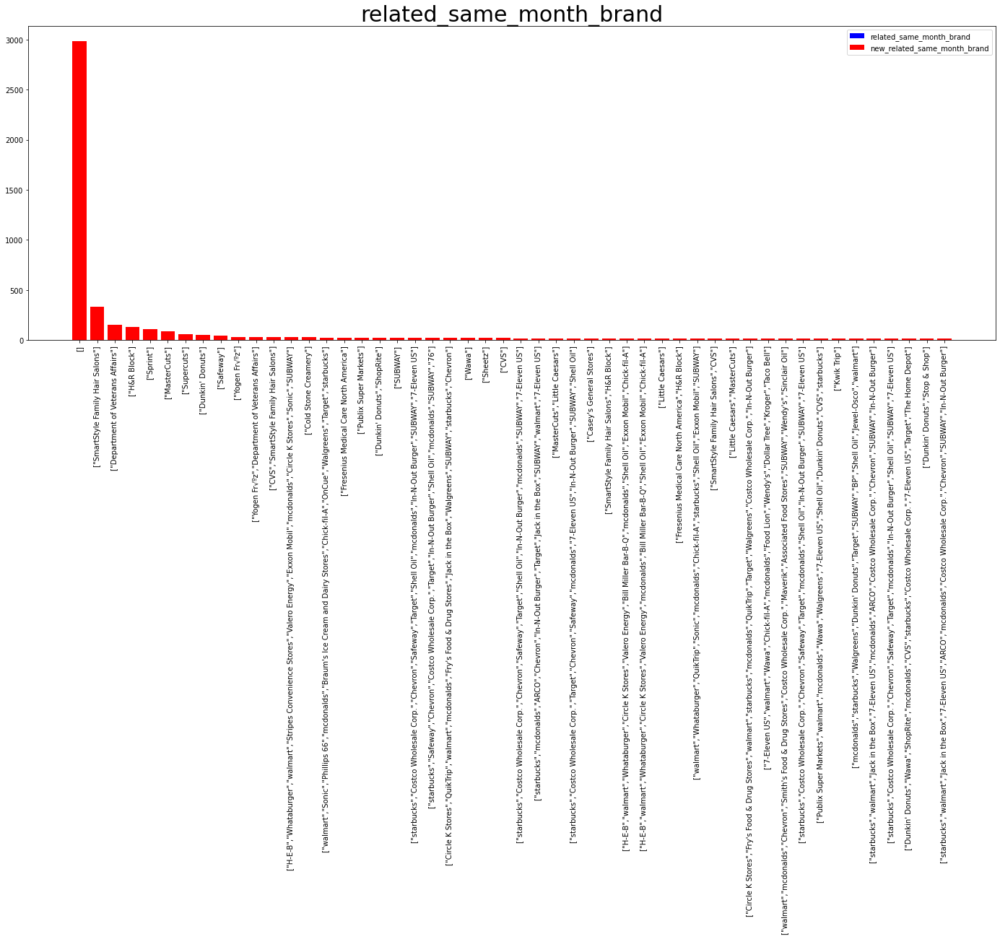

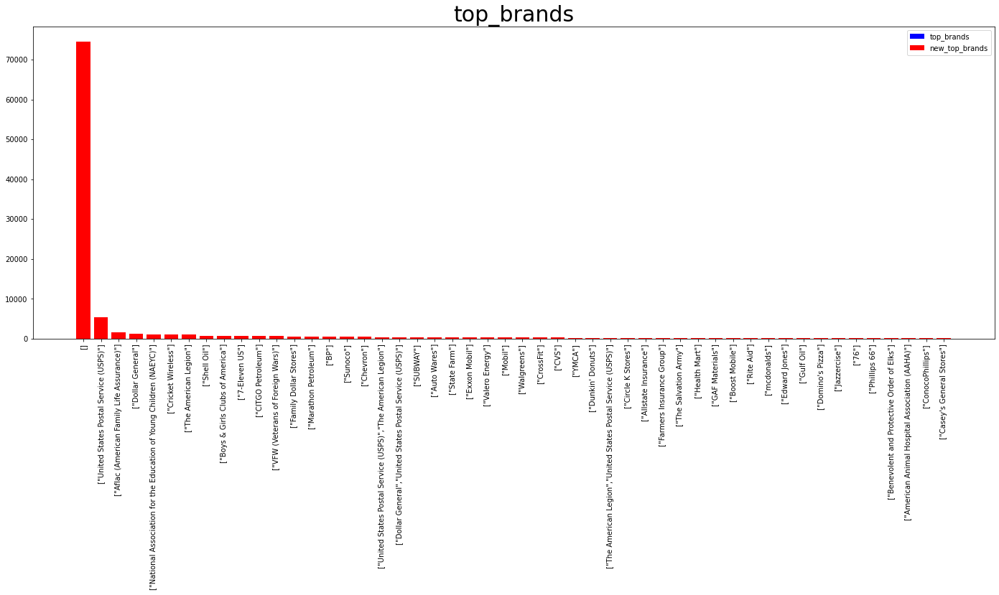

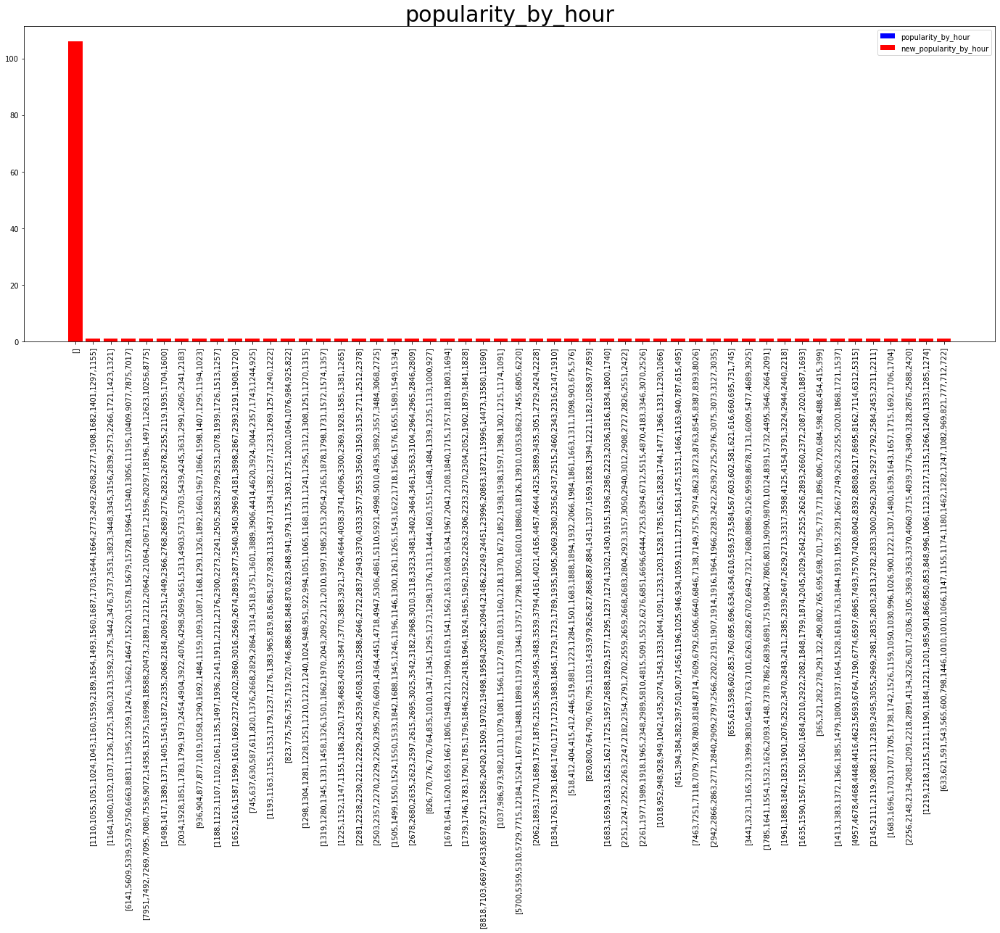

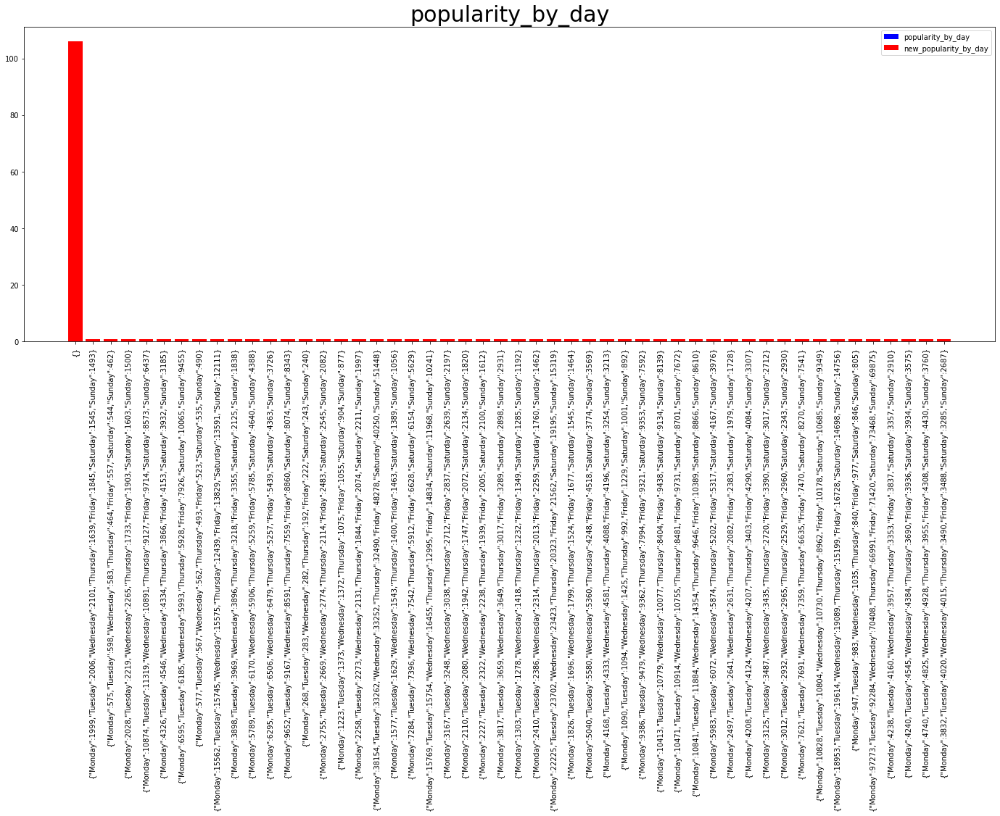

descriptive statistics (census_block_group):
Min: 10010201001.0000	Q1(25%): 131210116244.2500 	Q2(50%): 290190012013.5000 	Q3(75%): 420034897521.7500 	Max: 780309900000.0000
Missing: 1

 new Min: 10010201001.0000	Q1(25%): 131210116246.5000 	Q2(50%): 290190012013.0000 	Q3(75%): 420034895022.5000 	Max: 780309900000.0000 
 new Missing: 0 

descriptive statistics (date_range_start):
Min: 1538352000.0000	Q1(25%): 1538352000.0000 	Q2(50%): 1538352000.0000 	Q3(75%): 1538352000.0000 	Max: 1538352000.0000
Missing: 0

 new Min: 1538352000.0000	Q1(25%): 1538352000.0000 	Q2(50%): 1538352000.0000 	Q3(75%): 1538352000.0000 	Max: 1538352000.0000 
 new Missing: 0 

descriptive statistics (date_range_end):
Min: 1541030400.0000	Q1(25%): 1541030400.0000 	Q2(50%): 1541030400.0000 	Q3(75%): 1541030400.0000 	Max: 1541030400.0000
Missing: 0

 new Min: 1541030400.0000	Q1(25%): 1541030400.0000 	Q2(50%): 1541030400.0000 	Q3(75%): 1541030400.0000 	Max: 1541030400.0000 
 new Missing: 0 

descriptive statistics (r

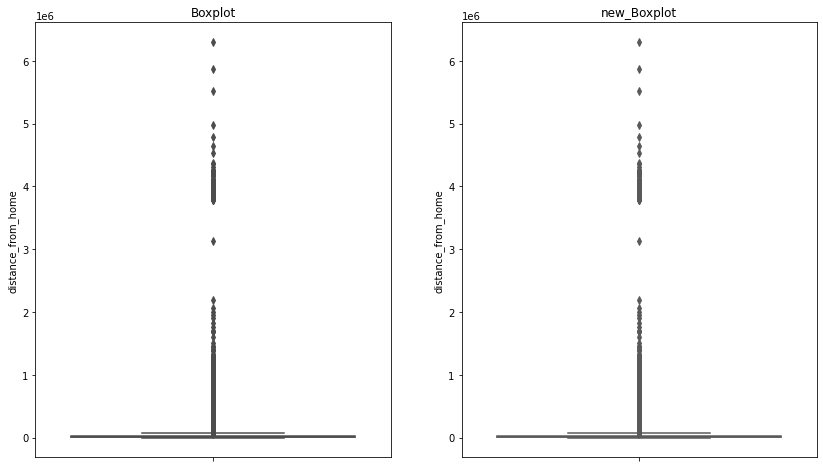

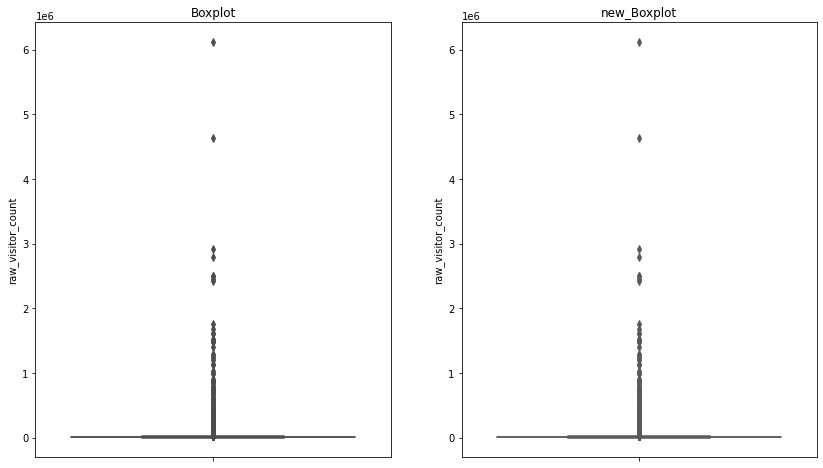

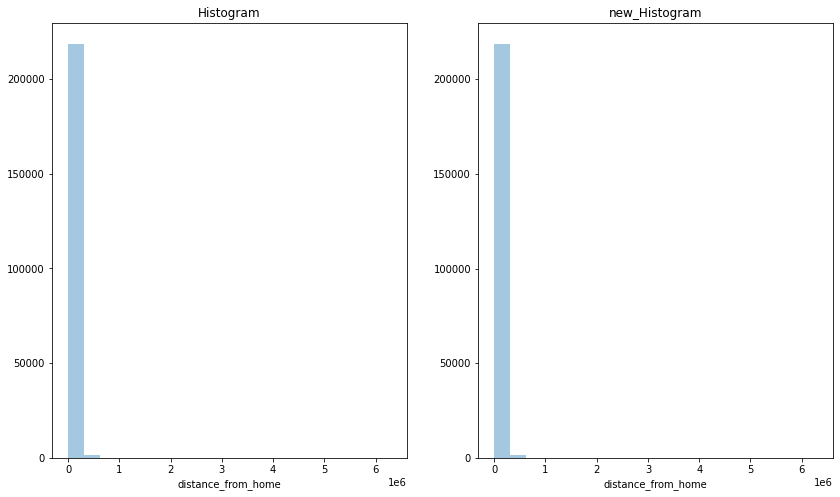

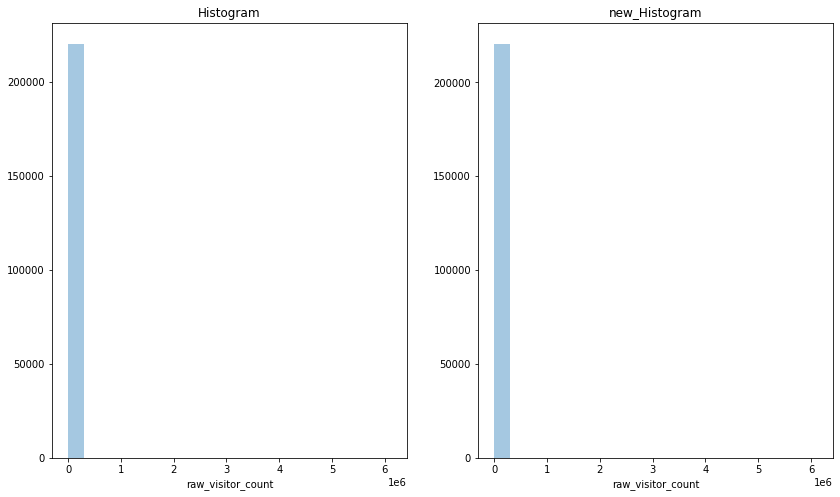

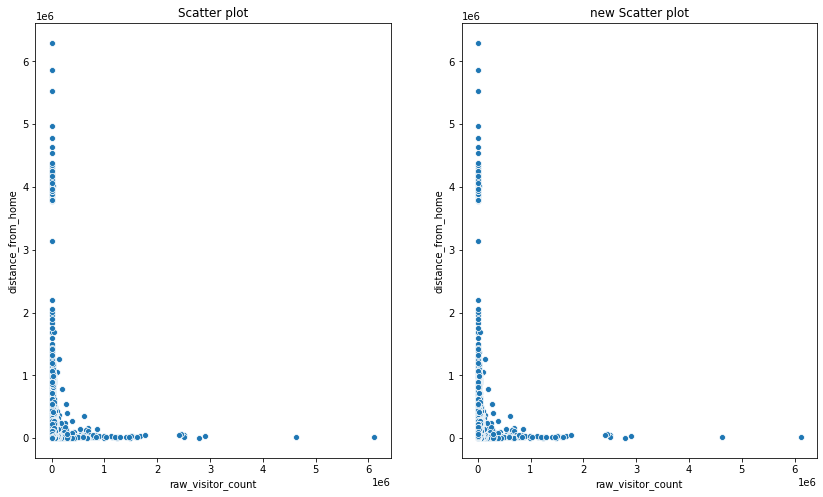

In [22]:
objcbg=obj_corr_fill(cbg_patterns,numerical_index=numerical_index,k=10)
columns_info(cbg_patterns,show_shape=True,new_df=objcbg)
nominal_summary(cbg_patterns,nominal_index=nominal_index,head_n=50,new_df=objcbg)
numerical_summary(cbg_patterns,numerical_index=numerical_index,new_df=objcbg)
viz_pairs(cbg_patterns,xlabel=numerical_index[4],ylabel=numerical_index[5],bins=20,new_df=objcbg)